In [2]:
from THM_main import Version5_THM_prototype
from iapws import IAPWS97
import numpy as np
from THM_main import plotting
import pandas as pd
import matplotlib.pyplot as plt
import os
import re
# Begining of the script used to test the THM prototype class.

In [3]:
case_name = "PSBT BenchMark Ex1 12223"
#User choice:
solveConduction = False
plot_at_z1 = []

########## Thermal hydraulics parameters ##########
## Geometric parameters
canalType = "square"
waterRadius = 0.0133409 # m
fuelRadius = 0.00542310/2 # m : fuel rod radius
gapRadius = fuelRadius + 0.0000001  # m : expansion gap radius : "void" between fuel and clad - equivalent to inner clad radius
cladRadius =  0.0094996/2 # m : clad external radius
height = 1.555 # m : height : active core height in BWRX-300 SMR

## Fluid parameters
pOutlet = 14719781.65 # Pa
tInlet = 592.75 #K
u_inlet = 4.467092221 #m/s
pressureDrop = 186737 #Pa/m
falsePInlet = pOutlet + height * pressureDrop
rhoInlet = IAPWS97(T = tInlet, P = falsePInlet*10**(-6)).rho #kg/m3
flowArea = waterRadius ** 2 - np.pi * cladRadius ** 2
qFlow = u_inlet * rhoInlet * flowArea # kg/m^2/s

## Meshing parameters:
If = 8
I1 = 3
Iz1 = 70 # number of control volumes in the axial direction

## Thermalhydraulics correlation
voidFractionCorrel = "EPRIvoidModel"    #choice between 'EPRIvoidModel' and 'GEramp' and 'modBestion' and 'HEM1'
frfaccorel = "Churchill"                #choice between 'Churchill' and 'blasius' 'base'
P2Pcorel = "lockhartMartinelli"                       #choice between 'HEM1' and 'HEM2' and 'MNmodel'
numericalMethod = 'BiCG'            #choice between 'BiCG', 'BiCGStab', 'GaussSiedel' and 'FVM'

############ Nuclear Parameters ###########
## Fission parameters

#qFss = 1943301220 # W/m3
## Material parameters
kFuel = 4.18 # W/m.K, TECHNICAL REPORTS SERIES No. 59 : Thermal Conductivity of Uranium Dioxide, IAEA, VIENNA, 1966
Hgap = 10000
kClad = 21.5 # W/m.K, Thermal Conductivity of Zircaloy-2 (as used in BWRX-300) according to https://www.matweb.com/search/datasheet.aspx?MatGUID=eb1dad5ce1ad4a1f9e92f86d5b44740d
# k_Zircaloy-4 = 21.6 W/m.K too so check for ATRIUM-10 clad material but should have the same thermal conductivity
########## Algorithm parameters ###########
nIter = 1000
tol = 1e-4

qFiss = [1000000000, 1500000000, 2000000000, 2500000000, 3000000000, 3500000000, 4000000000, 4500000000, 5000000000]
caseMerge = []
for q in qFiss:
    Qfiss1 = []
    for i in range(Iz1): 
        Qfiss1.append(q)
        
    voidFractionCorrel = "EPRIvoidModel"
    case1 = Version5_THM_prototype(case_name, canalType,
                    waterRadius, fuelRadius, gapRadius, cladRadius, height, tInlet, pOutlet, qFlow, Qfiss1,
                    kFuel, Hgap, kClad, Iz1, If, I1, plot_at_z1, solveConduction,
                    dt = 0, t_tot = 0, frfaccorel = frfaccorel, P2Pcorel = P2Pcorel, voidFractionCorrel = voidFractionCorrel, numericalMethod = numericalMethod)

    voidFractionCorrel = "GEramp"
    case2 = Version5_THM_prototype(case_name, canalType,
                    waterRadius, fuelRadius, gapRadius, cladRadius, height, tInlet, pOutlet, qFlow, Qfiss1,
                    kFuel, Hgap, kClad, Iz1, If, I1, plot_at_z1, solveConduction,
                    dt = 0, t_tot = 0, frfaccorel = frfaccorel, P2Pcorel = P2Pcorel, voidFractionCorrel = voidFractionCorrel, numericalMethod = numericalMethod)

    voidFractionCorrel = "modBestion"
    case3 = Version5_THM_prototype(case_name, canalType,
                    waterRadius, fuelRadius, gapRadius, cladRadius, height, tInlet, pOutlet, qFlow, Qfiss1,
                    kFuel, Hgap, kClad, Iz1, If, I1, plot_at_z1, solveConduction,
                    dt = 0, t_tot = 0, frfaccorel = frfaccorel, P2Pcorel = P2Pcorel, voidFractionCorrel = voidFractionCorrel, numericalMethod = numericalMethod)


    voidFractionCorrel = "HEM1"
    case4 = Version5_THM_prototype(case_name, canalType,
                    waterRadius, fuelRadius, gapRadius, cladRadius, height, tInlet, pOutlet, qFlow, Qfiss1,
                    kFuel, Hgap, kClad, Iz1, If, I1, plot_at_z1, solveConduction,
                    dt = 0, t_tot = 0, frfaccorel = frfaccorel, P2Pcorel = P2Pcorel, voidFractionCorrel = voidFractionCorrel, numericalMethod = numericalMethod)

    caseMerge.append([case1, case2, case3, case4])


$$$---------- THM: prototype, case treated : PSBT BenchMark Ex1 12223.
$$$---------- THM: prototype, steady state case.
$$---------- Calling DFM class.
Setting up heat convection solution along the axial dimension. zmax = 1.555 m with 70 axial elements.
self.I_z: 70
self.qFlow: 0.32526840090529774
self.pOutlet: 14719781.65
self.Lf: 1.555
self.r_f: 0.00271155
self.clad_r: 0.0047498
self.r_w: 0.0133409
self.Dz: 0.022214285714285714
self.dt: 0
Courant number: 0.0
Numerical Method BiCG
Velocity at the inlet:  4.467092221
cote: 0.0133409
cladRadius: 0.0047498
Dh: 0.014355160325313157
Hydraulic diameter: [0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.014355160325313157, 0.01435516032531315

c:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\THM_waterProp.py:566: RuntimeWarning: divide by zero encountered in scalar divide
  return self.U[i] - (self.voidFractionTEMP[i] / ( 1 - self.voidFractionTEMP[i])) * (self.rhogTEMP[i] / self.rhoTEMP[i]) * self.VgjPrimeTEMP[i]
c:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\THM_waterProp.py:579: RuntimeWarning: invalid value encountered in sqrt
  return 1 + 1/np.sqrt(X) + 20/X


Convergence test, residuals: epsilon: 0.3850736165213674, rho: 0.3256148460357737, xTh: 6.740919818541088
uInlet:4.471460405084839
VAR_VFM_Class: [[ 1.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-6.50850070e-02  6.50696469e-02  0.00000000e+00 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00 -6.50696469e-02  6.50542868e-02 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 ...
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ... -1.07103397e-04
   1.07103397e-04  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
  -1.07103397e-04  1.07103397e-04]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   0.00000000e+00  1.00000000e+00]]
VAR_VFM_Class: [4.47146041e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00

In [4]:
print(caseMerge[0][0].Qfiss ,caseMerge[0][0].convection_sol.q__)

class GFPlotter():
    def __init__(self, caseList, directory_path, case_name):
        self.case_name = f'{case_name}\\'

        self.caseList = caseList
        self.directory_path = directory_path
        self.height = self.caseList[0].convection_sol.height

        self.data_dict_list = []
        self.data_dict = self.read_files_in_directory()
        self.allow_space()

        self.struture_fraction = 1 - (self.alpha_liquid[0] + self.alpha_vapour[0])

        self.calculateFields()
        self.createZ()

    def plotCase(self):
        title = f"f: {self.caseList[0].convection_sol.frfaccorel}, \n Méthode numérique: {self.caseList[0].convection_sol.numericalMethod}, \n Correlation void fraction: {self.caseList[0].convection_sol.voidFractionCorrel}"
        labelTitle = 'DFM'
        fig1, ax1 = plt.subplots()
        for i in range(len(self.caseList)):
            ax1.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.T_water, label=labelTitle)
        ax1.set_xlabel("Axial position in m")
        ax1.set_ylabel("Temperature in K")
        ax1.set_title(f"{title}")
        ax1.grid()
        ax1.legend(loc="best")
        fig1.savefig(rf'result\{self.case_name}\Tcoolant.png', bbox_inches='tight')

        fig2, ax2 = plt.subplots()
        for i in range(len(self.caseList)):
            ax2.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.voidFraction[-1], label=labelTitle)

        ax2.set_xlabel("Axial position in m")
        ax2.set_ylabel("Void fraction")
        ax2.set_title(f"{title}")
        ax2.grid()
        ax2.legend(loc="best")
        fig2.savefig(rf'result\{self.case_name}\epsilon.png', bbox_inches='tight')

        fig3, ax3 = plt.subplots()
        for i in range(len(self.caseList)):
            ax3.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.rho[-1], label=labelTitle)

        ax3.set_xlabel("Axial position in m")
        ax3.set_ylabel("Density in kg/m^3")
        ax3.set_title(f"{title}")
        ax3.grid()
        ax3.legend(loc="best")
        fig3.savefig(rf'result\{self.case_name}\Rho.png', bbox_inches='tight')

        fig7, ax7 = plt.subplots()
        for i in range(len(self.caseList)):
            ax7.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.rhoL[-1], label=labelTitle)
        ax7.set_xlabel("Axial position in m")
        ax7.set_ylabel("Liquid density in kg/m^3")
        ax7.set_title(f"{title}")
        ax7.grid()
        ax7.legend(loc="best")
        fig7.savefig(rf'result\{self.case_name}\RhoL.png', bbox_inches='tight')

        fig8, ax8 = plt.subplots()
        for i in range(len(self.caseList)):
            ax8.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.rhoG[-1], label=labelTitle)
        ax8.set_xlabel("Axial position in m")
        ax8.set_ylabel("Vapour density in kg/m^3")
        ax8.set_title(f"{title}")
        ax8.grid()
        ax8.legend(loc="best")
        fig8.savefig(rf'result\{self.case_name}\RhoG.png', bbox_inches='tight')

        fig4, ax4 = plt.subplots() 
        for i in range(len(self.caseList)):
            labelTitle = f"DFM {self.caseList[i].convection_sol.frfaccorel}"
            ax4.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.P[-1], label=labelTitle)
        ax4.step(self.zList, self.p_rgh, label="GenFoam P_rgh")
        ax4.set_xlabel("Axial position in m")
        ax4.set_ylabel("Pressure in Pa")
        ax4.grid()
        ax4.set_title(f"{title}")
        ax4.legend(loc="best")
        fig4.savefig(rf'result\{self.case_name}\P.png', bbox_inches='tight')

        fig5, ax5 = plt.subplots()
        for i in range(len(self.caseList)):
            ax5.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.Ul, label=labelTitle)
        ax5.set_xlabel("Axial position in m")
        ax5.set_ylabel("Liquid Velocity in m/s")
        ax5.set_title(f"{title}")
        ax5.grid()
        ax5.legend(loc="best")
        fig5.savefig(rf'result\{self.case_name}\Ul.png', bbox_inches='tight')

        fig6, ax6 = plt.subplots()
        for i in range(len(self.caseList)):
            ax6.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.Ug, label=labelTitle)
        ax6.set_xlabel("Axial position in m")
        ax6.set_ylabel("Vapour Velocity in m/s")
        ax6.set_title(f"{title}")
        ax6.grid()
        ax6.legend(loc="best")
        fig6.savefig(rf'result\{self.case_name}\Ug.png', bbox_inches='tight')

        fig9, ax9 = plt.subplots()
        for i in range(len(self.caseList)):
            ax9.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.U[-1], label=labelTitle)
        ax9.set_xlabel("Axial position in m")
        ax9.set_ylabel("Mixture Velocity in m/s")
        ax9.set_title(f"{title}")
        ax9.grid()
        ax9.legend(loc="best")
        fig9.savefig(rf'result\{self.case_name}\U.png', bbox_inches='tight')

        fig10, ax10 = plt.subplots()
        for i in range(len(self.caseList)):
            ax10.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.Rel, label=labelTitle)
        ax10.set_xlabel("Axial position in m")
        ax10.set_ylabel("Reynolds number")
        ax10.set_title(f"{title}")
        ax10.grid()
        ax10.legend(loc="best")
        fig10.savefig(rf'result\{self.case_name}\Re.png', bbox_inches='tight')

        fig11, ax11 = plt.subplots()
        ax11.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.xTh[-1], label=labelTitle)
        ax11.set_xlabel("Axial position in m")
        ax11.set_ylabel("xTh")
        ax11.set_title(f"{title}")
        ax11.grid()
        ax11.legend(loc="best")
        fig11.savefig(rf'result\{self.case_name}\xTh.png', bbox_inches='tight')

        
        """ fig12, ax12 = plt.subplots()
        for i in range(len(self.caseList)):
            print(f'longueur de rhoL: {len(self.caseList[i].convection_sol.rhoL[-1])}')
            print(f'longueur de Ul: {len(self.caseList[i].convection_sol.Ul)}')
            rhoUA_liquid = [self.caseList[i].convection_sol.Ul[j] * self.caseList[i].convection_sol.rhoL[-1][j]*self.caseList[i].convection_sol.areaMatrix[0] for j in range(len(self.caseList[i].convection_sol.Ul))]
            ax12.step(self.caseList[i].convection_sol.z_mesh, rhoUA_liquid, label=labelTitle + " rhoUA_liquid")
        #ax12.step(self.zList, self.alphaRhoMagU_liquid, label="GenFoam")
        ax12.set_xlabel("Axial position in m")
        ax12.set_ylabel("rhoUA_liquid")
        ax12.set_title(f"{title}")
        ax12.grid()
        fig12.savefig(rf'result\{self.case_name}\rhoUA_liquid.png', bbox_inches='tight')

        fig13, ax13 = plt.subplots()
        for i in range(len(self.caseList)):
            rhoUA_vapour = [self.caseList[i].convection_sol.Ug[j] * self.caseList[i].convection_sol.rhoG[-1][j]*self.caseList[i].convection_sol.areaMatrix[0] for j in range(len(self.caseList[i].convection_sol.Ug))]
            ax13.step(self.caseList[i].convection_sol.z_mesh, rhoUA_vapour, label=labelTitle + " rhoUA_vapour")
        #ax13.step(self.zList, self.alphaRhoMagU_vapour, label="GenFoam")
        ax13.set_xlabel("Axial position in m")
        ax13.set_ylabel("rhoUA_vapour")
        ax13.set_title(f"{title}")
        ax13.grid()
        fig13.savefig(rf'result\{self.case_name}\rhoUA_vapour.png', bbox_inches='tight')

        fig14, ax14 = plt.subplots()
        for i in range(len(self.caseList)):
            self.rhoUA = [self.caseList[i].convection_sol.U[-1][j] * self.caseList[i].convection_sol.rho[-1][j]*self.caseList[i].convection_sol.areaMatrix[0] for j in range(len(self.caseList[i].convection_sol.Ug))]
            ax14.step(self.caseList[i].convection_sol.z_mesh, self.rhoUA, label=labelTitle + " rhoUA")
        #ax14.step(self.zList, self.alphaRhoMagU_liquid, label="GenFoam")
        ax14.set_xlabel("Axial position in m")
        ax14.set_ylabel("rhoUA")
        ax14.set_title(f"{title}")
        ax14.grid()
        fig14.savefig(rf'result\{self.case_name}\rhoUA.png', bbox_inches='tight') """
        

        plt.show()

    def createZ(self):
        self.zList = np.linspace(0, self.height, len(self.alpha_liquid))

    def read_files_in_directory(self):
        data_dict = {}
        print(f"Reading files in directory: {self.directory_path}")
        # Parcourt tous les fichiers du dossier
        for filename in os.listdir(self.directory_path):
            file_path = os.path.join(self.directory_path, filename)
            # Vérifie que c'est bien un fichier
            if os.path.isfile(file_path):
                print(f"Reading file: {filename}")
                with open(file_path, 'r') as file:
                    content = file.read()
                    
                    # Trouve la première parenthèse ouvrante et fermante
                    start = content.find('(')
                    end = content.find(')', start)
                    #end = start + 74
                    if start != -1 and end != -1:
                        # Extrait les données entre les parenthèses
                        data_str = content[start+1:end].strip()
                        # Divise les lignes en liste de chaînes
                        data_lines = data_str.splitlines()
                        if len(data_lines) != 1:
                            float_list = [float(item) for item in data_lines]
                            data_dict[filename] = float_list

                    if len(data_lines) == 1:
                        # Trouve la première parenthèse ouvrante et fermante
                        start = content.find('(')
                        end = content.find(';', start)
                        #end = start
                        if start != -1 and end != -1:
                            # Extrait les données entre les parenthèses
                            data_str = content[start+1:end].strip()
                            # Divise les lignes en liste de chaînes
                            data_lines = data_str.splitlines()
                            data_lines.pop()
                            x, y, z = np.zeros(len(data_lines)), np.zeros(len(data_lines)), np.zeros(len(data_lines))
                            for i in range(len(data_lines)):
                                a = values = data_lines[i].strip("()").split()
                                x[i] = float(a[0])
                                y[i] = float(a[1])
                                z[i] = float(a[2])
                            data_dict[fr'{filename}_x'] = x
                            data_dict[fr'{filename}_y'] = y
                            data_dict[fr'{filename}_z'] = z
        
        return data_dict
    
    def allow_space(self):
        self.alpha_liquid = np.array(self.data_dict['alpha.liquid'])
        self.alpha_vapour = np.array(self.data_dict['alpha.vapour'])
        #self.alpha_powerModel = np.array(self.data_dict['alpha.powerModel'])
        self.alphaPhi_liquid = np.array(self.data_dict['alphaPhi.liquid']+ [self.data_dict['alphaPhi.liquid'][-1]])
        self.alphaPhi_vapour = np.array(self.data_dict['alphaPhi.vapour']+ [self.data_dict['alphaPhi.vapour'][-1]])
        self.alphaRhoMagU_liquid = np.array(self.data_dict['alphaRhoMagU.liquid'])#+ [self.data_dict['alphaRhoMagU.liquid'][-1]])
        self.alphaRhoMagU_vapour = np.array(self.data_dict['alphaRhoMagU.vapour'])#+ [self.data_dict['alphaRhoMagU.vapour'][-1]])
        self.alphaRhoPhi_liquid = np.array(self.data_dict['alphaRhoPhi.liquid']+ [self.data_dict['alphaRhoPhi.liquid'][-1]])
        self.alphaRhoPhi_vapour = np.array(self.data_dict['alphaRhoPhi.vapour']+ [self.data_dict['alphaRhoPhi.vapour'][-1]])
        self.areaDensity_interface = np.array(self.data_dict['areaDensity.interface'])
        self.dgdt_liquid = np.array(self.data_dict['dgdt.liquid'])
        self.dgdt_vapour = np.array(self.data_dict['dgdt.vapour'])
        self.dmdt_vapour = np.array(self.data_dict['dmdt.liquid.vapour'])
        self.heatFlux_structure = np.array(self.data_dict['heatFlux.structure'])
        self.htc_liquid_interface = np.array(self.data_dict['htc.liquid.interface'])
        self.htc_liquid_structure = np.array(self.data_dict['htc.liquid.structure'])
        self.p = np.array(self.data_dict['p'])
        self.p_rgh = np.array(self.data_dict['p_rgh'])
        self.Re_liquid_structure = np.array(self.data_dict['Re.liquid.structure'])
        #self.Re_vapour_structure = np.array(self.data_dict['Re.vapour.structure'])
        self.Re_liquid_vapour = np.array(self.data_dict['Re.liquid.vapour'])
        self.T_fixedPower = np.array(self.data_dict['T.fixedPower'])
        self.T_liquid = np.array(self.data_dict['T.liquid'])
        self.T_vapour = np.array(self.data_dict['T.vapour'])
        self.U_liquid_x = np.array(self.data_dict['U.liquid_x'])
        self.U_liquid_y = np.array(self.data_dict['U.liquid_y'])
        self.U_liquid_z = np.array(self.data_dict['U.liquid_z'])
        self.U_vapour_x = np.array(self.data_dict['U.vapour_x'])
        self.U_vapour_y = np.array(self.data_dict['U.vapour_y'])
        self.U_vapour_z = np.array(self.data_dict['U.vapour_z'])

    def calculateFields(self):
        self.alpha_vapour = self.alpha_vapour/(1-self.struture_fraction)
        self.alpha_liquid = self.alpha_liquid/(1-self.struture_fraction)
        self.U_liquid = np.sqrt(self.U_liquid_x**2 + self.U_liquid_y**2 + self.U_liquid_z**2)
        self.U_vapour = np.sqrt(self.U_vapour_x**2 + self.U_vapour_y**2 + self.U_vapour_z**2)
        self.U_mixture = (1-self.alpha_vapour) * self.U_liquid + self.alpha_vapour * self.U_vapour

        self.rho_liquid  = self.alphaRhoPhi_liquid/(self.alphaPhi_liquid)
        self.rho_vapour = self.alphaRhoPhi_vapour/(self.alphaPhi_vapour)
        for i in range(len(self.rho_vapour)):
            if np.isnan(self.rho_vapour[i]):
                self.rho_vapour[i] = 0
            if np.isnan(self.rho_liquid[i]):
                self.rho_liquid[i] = 0
        self.rho_mixture = self.rho_liquid + self.rho_vapour

        self.T_mixture = (1-self.alpha_vapour) * self.T_liquid + self.alpha_vapour * self.T_vapour

    def plotComparison(self):
        file_path = rf'C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\result\{self.case_name}'
        os.makedirs(os.path.dirname(file_path), exist_ok=True)
        if len(self.caseList) == 1:
            labelTitle = 'DFM'
        labelTitle = 'DFM'
        title = f"f: {self.caseList[0].convection_sol.frfaccorel}, \n Méthode numérique: {self.caseList[0].convection_sol.numericalMethod}, \n Correlation void fraction: {self.caseList[0].convection_sol.voidFractionCorrel}"
        fig1, ax1 = plt.subplots()
        for i in range(len(self.caseList)):
            ax1.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.T_water, label=labelTitle)
        ax1.step(self.zList, self.T_liquid, label="GenFoam T.liquid")
        ax1.step(self.zList, self.T_vapour, label="GenFoam T.vapour")
        ax1.step(self.zList, self.T_mixture, label="GenFoam T.mixture")
        ax1.set_xlabel("Axial position in m")
        ax1.set_ylabel("Temperature in K")
        ax1.set_title(f"{title}")
        ax1.grid()
        ax1.legend(loc="best")
        fig1.savefig(rf'result\{self.case_name}\Tcoolant.png', bbox_inches='tight')

        fig2, ax2 = plt.subplots()
        for i in range(len(self.caseList)):
            ax2.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.voidFraction[-1], label=labelTitle)
        ax2.step(self.zList, self.alpha_vapour, label="GenFoam")
        ax2.set_xlabel("Axial position in m")
        ax2.set_ylabel("Void fraction")
        ax2.set_title(f"{title}")
        ax2.grid()
        ax2.legend(loc="best")
        fig2.savefig(rf'result\{self.case_name}\epsilon.png', bbox_inches='tight')

        fig3, ax3 = plt.subplots()
        for i in range(len(self.caseList)):
            ax3.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.rho[-1], label=labelTitle)
        ax3.plot(self.zList, self.rho_mixture, label="GenFoam")
        ax3.set_xlabel("Axial position in m")
        ax3.set_ylabel("Density in kg/m^3")
        ax3.set_title(f"{title}")
        ax3.grid()
        ax3.legend(loc="best")
        fig3.savefig(rf'result\{self.case_name}\Rho.png', bbox_inches='tight')

        fig7, ax7 = plt.subplots()
        for i in range(len(self.caseList)):
            ax7.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.rhoL[-1], label=labelTitle)
        ax7.plot(self.zList, self.rho_liquid, label="GenFoam")
        ax7.set_xlabel("Axial position in m")
        ax7.set_ylabel("Liquid density in kg/m^3")
        ax7.set_title(f"{title}")
        ax7.grid()
        ax7.legend(loc="best")
        fig7.savefig(rf'result\{self.case_name}\RhoL.png', bbox_inches='tight')

        fig8, ax8 = plt.subplots()
        for i in range(len(self.caseList)):
            ax8.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.rhoG[-1], label=labelTitle)
        ax8.plot(self.zList, self.rho_vapour, label="GenFoam")
        ax8.set_xlabel("Axial position in m")
        ax8.set_ylabel("Vapour density in kg/m^3")
        ax8.set_title(f"{title}")
        ax8.grid()
        ax8.legend(loc="best")
        fig8.savefig(rf'result\{self.case_name}\RhoG.png', bbox_inches='tight')

        fig4, ax4 = plt.subplots() 
        for i in range(len(self.caseList)):
            labelTitle = f"DFM {self.caseList[i].convection_sol.frfaccorel} {self.caseList[i].convection_sol.P2Pcorel}"
            ax4.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.P[-1], label=labelTitle)
        ax4.step(self.zList, self.p, label="GenFoam")
        ax4.step(self.zList, self.p_rgh, label="GenFoam P_rgh")
        ax4.set_xlabel("Axial position in m")
        ax4.set_ylabel("Pressure in Pa")
        ax4.grid()
        ax4.set_title(f"{title}")
        ax4.legend(loc="best")
        fig4.savefig(rf'result\{self.case_name}\P.png', bbox_inches='tight')

        fig5, ax5 = plt.subplots()
        for i in range(len(self.caseList)):
            ax5.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.Ul, label=labelTitle)
        ax5.step(self.zList, self.U_liquid, label="GenFoam")
        ax5.set_xlabel("Axial position in m")
        ax5.set_ylabel("Liquid Velocity in m/s")
        ax5.set_title(f"{title}")
        ax5.grid()
        ax5.legend(loc="best")
        fig5.savefig(rf'result\{self.case_name}\Ul.png', bbox_inches='tight')

        fig6, ax6 = plt.subplots()
        for i in range(len(self.caseList)):
            ax6.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.Ug, label=labelTitle)
        ax6.step(self.zList, self.U_vapour, label="GenFoam")
        ax6.set_xlabel("Axial position in m")
        ax6.set_ylabel("Vapour Velocity in m/s")
        ax6.set_title(f"{title}")
        ax6.grid()
        ax6.legend(loc="best")
        fig6.savefig(rf'result\{self.case_name}\Ug.png', bbox_inches='tight')

        fig9, ax9 = plt.subplots()
        for i in range(len(self.caseList)):
            ax9.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.U[-1], label=labelTitle)
        ax9.step(self.zList, self.U_mixture, label="GenFoam")
        ax9.set_xlabel("Axial position in m")
        ax9.set_ylabel("Mixture Velocity in m/s")
        ax9.set_title(f"{title}")
        ax9.grid()
        ax9.legend(loc="best")
        fig9.savefig(rf'result\{self.case_name}\U.png', bbox_inches='tight')

        fig10, ax10 = plt.subplots()
        for i in range(len(self.caseList)):
            ax10.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.Rel, label=labelTitle)
        ax10.step(self.zList, self.Re_liquid_structure, label="GenFoam")
        ax10.set_xlabel("Axial position in m")
        ax10.set_ylabel("Reynolds number")
        ax10.set_title(f"{title}")
        ax10.grid()
        ax10.legend(loc="best")
        fig10.savefig(rf'result\{self.case_name}\Re.png', bbox_inches='tight')

        fig11, ax11 = plt.subplots()
        ax11.step(self.caseList[i].convection_sol.z_mesh, self.caseList[i].convection_sol.xTh[-1], label=labelTitle)
        ax11.set_xlabel("Axial position in m")
        ax11.set_ylabel("xTh")
        ax11.set_title(f"{title}")
        ax11.grid()
        ax11.legend(loc="best")
        fig11.savefig(rf'result\{self.case_name}\xTh.png', bbox_inches='tight')

        
        """ fig12, ax12 = plt.subplots()
        for i in range(len(self.caseList)):
            rhoUA_liquid = [self.caseList[i].convection_sol.Ul[j] * self.caseList[i].convection_sol.rhoL[-1][j]*self.caseList[i].convection_sol.areaMatrix[0] for j in range(len(self.caseList[i].convection_sol.Ul))]
            ax12.step(self.caseList[i].convection_sol.z_mesh, rhoUA_liquid, label=labelTitle + " rhoUA_liquid")
        #ax12.step(self.zList, self.alphaRhoMagU_liquid, label="GenFoam")
        ax12.set_xlabel("Axial position in m")
        ax12.set_ylabel("rhoUA_liquid")
        ax12.set_title(f"{title}")
        ax12.grid()
        fig12.savefig(rf'result\{self.case_name}\rhoUA_liquid.png', bbox_inches='tight')

        fig13, ax13 = plt.subplots()
        for i in range(len(self.caseList)):
            rhoUA_vapour = [self.caseList[i].convection_sol.Ug[j] * self.caseList[i].convection_sol.rhoG[-1][j]*self.caseList[i].convection_sol.areaMatrix[0] for j in range(len(self.caseList[i].convection_sol.Ug))]
            ax13.step(self.caseList[i].convection_sol.z_mesh, rhoUA_vapour, label=labelTitle + " rhoUA_vapour")
        #ax13.step(self.zList, self.alphaRhoMagU_vapour, label="GenFoam")
        ax13.set_xlabel("Axial position in m")
        ax13.set_ylabel("rhoUA_vapour")
        ax13.set_title(f"{title}")
        ax13.grid()
        fig13.savefig(rf'result\{self.case_name}\rhoUA_vapour.png', bbox_inches='tight')

        fig14, ax14 = plt.subplots()
        for i in range(len(self.caseList)):
            self.rhoUA = [self.caseList[i].convection_sol.U[-1][j] * self.caseList[i].convection_sol.rho[-1][j]*self.caseList[i].convection_sol.areaMatrix[0] for j in range(len(self.caseList[i].convection_sol.Ug))]
            ax14.step(self.caseList[i].convection_sol.z_mesh, self.rhoUA, label=labelTitle + " rhoUA")
        #ax14.step(self.zList, self.alphaRhoMagU_liquid, label="GenFoam")
        ax14.set_xlabel("Axial position in m")
        ax14.set_ylabel("rhoUA")
        ax14.set_title(f"{title}")
        ax14.grid()
        fig14.savefig(rf'result\{self.case_name}\rhoUA.png', bbox_inches='tight') """
        

        plt.show()

    def computeErrors(self):
        self.error_T_abs = []
        self.error_T_rel = []
        self.error_p_abs = []
        self.error_p_rel = []
        self.error_rho_abs = []
        self.error_rho_rel = []
        self.error_U_abs = []
        self.error_U_rel = []
        self.error_Re_abs = []
        self.error_Re_rel = []
        self.error_eps_abs = []
        self.error_eps_rel = []

        for i in range(len(self.caseList)):
            self.error_T_abs.append(abs(self.T_mixture - self.caseList[i].convection_sol.T_water))
            self.error_T_rel.append(100*self.error_T_abs[-1]/(self.T_mixture))
            self.error_p_abs.append(abs(self.p - self.caseList[i].convection_sol.P[-1]))
            self.error_p_rel.append(100*self.error_p_abs[-1]/(self.p))
            self.error_rho_abs.append(abs(self.rho_mixture - self.caseList[i].convection_sol.rho[-1]))
            self.error_rho_rel.append(100*self.error_rho_abs[-1]/(self.rho_mixture))
            self.error_U_abs.append(abs(self.U_mixture - self.caseList[i].convection_sol.U[-1]))
            self.error_U_rel.append(100*self.error_U_abs[-1]/(self.U_mixture))
            self.error_Re_abs.append(abs(self.Re_liquid_structure - self.caseList[i].convection_sol.Rel))
            self.error_Re_rel.append(100*self.error_Re_abs[-1]/(self.Re_liquid_structure))
            self.error_eps_abs.append(100*abs(self.alpha_vapour - self.caseList[i].convection_sol.voidFraction[-1]))
            self.error_eps_rel.append(self.error_eps_abs[-1]/(self.alpha_vapour))

            

    def plotErrorsPressure(self):
        file_path = rf'C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\result\{self.case_name}'
        os.makedirs(os.path.dirname(file_path), exist_ok=True)
        
        """ fig, ax = plt.subplots()
        for i in range(len(self.caseList)):
            ax.step(self.caseList[i].convection_sol.z_mesh, self.error_p_abs[i], label=f" {self.caseList[i].convection_sol.frfaccorel} , {self.caseList[i].convection_sol.P2Pcorel}")
        ax.set_xlabel("Axial position in m")
        ax.set_ylabel("Absolute error in Pa")
        ax.set_title("Absolute error in pressure")
        ax.grid()
        ax.legend(loc="best")
        fig.savefig(rf'result\{self.case_name}\error_p_abs.png', bbox_inches='tight')

        fig1, ax1 = plt.subplots()
        for i in range(len(self.caseList)):
            ax1.step(self.caseList[i].convection_sol.z_mesh, self.error_p_rel[i], label=f" {self.caseList[i].convection_sol.frfaccorel} , {self.caseList[i].convection_sol.P2Pcorel}")
        ax1.set_xlabel("Axial position in m")
        ax1.set_ylabel("Relative error in %")
        ax1.set_title("Relative error in pressure")
        ax1.grid()
        ax1.legend(loc="best")
        fig1.savefig(rf'result\{self.case_name}\error_p_rel.png', bbox_inches='tight')

        plt.show() """

        error_list_mean = []
        error_list_max = []
        for i in range(len(self.caseList)):
            print(f"Mean relative error in pressure: {np.mean(self.error_p_rel[i])}, max relative error in pressure {np.max(self.error_p_rel[i])} for {self.caseList[i].convection_sol.voidFractionCorrel}")
            error_list_mean.append(np.mean(self.error_p_rel[i]))
            error_list_max.append(np.max(self.error_p_rel[i]))
        
        print(error_list_mean)
        return error_list_mean
    
    def plotErrorsTemperature(self):
        file_path = rf'C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\result\{self.case_name}'
        os.makedirs(os.path.dirname(file_path), exist_ok=True)
        
        """ fig, ax = plt.subplots()
        for i in range(len(self.caseList)):
            ax.step(self.caseList[i].convection_sol.z_mesh, self.error_T_abs[i], label=f" {self.caseList[i].convection_sol.frfaccorel} , {self.caseList[i].convection_sol.P2Pcorel}")
        ax.set_xlabel("Axial position in m")
        ax.set_ylabel("Absolute error in K")
        ax.set_title("Absolute error in temperature")
        ax.grid()
        ax.legend(loc="best")
        fig.savefig(rf'result\{self.case_name}\error_T_abs.png', bbox_inches='tight')

        fig1, ax1 = plt.subplots()
        for i in range(len(self.caseList)):
            ax1.step(self.caseList[i].convection_sol.z_mesh, self.error_T_rel[i], label=f" {self.caseList[i].convection_sol.frfaccorel} , {self.caseList[i].convection_sol.P2Pcorel}")
        ax1.set_xlabel("Axial position in m")
        ax1.set_ylabel("Relative error in %")
        ax1.set_title("Relative error in temperature")
        ax1.grid()
        ax1.legend(loc="best")
        fig1.savefig(rf'result\{self.case_name}\error_T_rel.png', bbox_inches='tight')
 
        plt.show()"""

        error_list_mean = []
        error_list_max = []
        for i in range(len(self.caseList)):
            print(f"Mean relative error in temperature: {np.mean(self.error_T_rel[i])}, max relative error in temperature {np.max(self.error_T_rel[i])} for {self.caseList[i].convection_sol.voidFractionCorrel}")
            error_list_mean.append(np.mean(self.error_T_rel[i]))
            error_list_max.append(np.max(self.error_T_rel[i]))
        
        print(error_list_mean)
        return error_list_mean
    
    def plotErrorsVoidFraction(self):
        file_path = rf'C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\result\{self.case_name}'
        os.makedirs(os.path.dirname(file_path), exist_ok=True)
        
        error_list_mean = []
        error_list_max = []
        for i in range(len(self.caseList)):
            print(f"Mean absolute error in void fraction: {np.mean(self.error_eps_abs[i])}, max absolute error in temperature {np.max(self.error_eps_abs[i])} for {self.caseList[i].convection_sol.voidFractionCorrel}")
            error_list_mean.append(np.mean(self.error_eps_abs[i]))
            error_list_max.append(np.max(self.error_eps_abs[i]))
        
        print(error_list_mean)
        return error_list_mean

[1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000, 1000000000] [215666087.3676211, 215666087.3676211, 215666087.3676211, 215666087.3676211, 215666087.3676211, 215666087.3676211, 215666087.3676211, 215666087.3676211, 215666

Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\1.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: alphaRhoPhi.liquid
Reading file: alphaRhoPhi.vapour
Reading file: areaDensity.interface
Reading file: dgdt.liquid
Reading file: dgdt.vapour
Reading file: dmdt.liquid.vapour
Reading file: heatFlux.structure
Reading file: htc.liquid.interface
Reading file: htc.liquid.structure
Reading file: htc.vapour.interface
Reading file: htc.vapour.structure
Reading file: Kd.liquid.structure
Reading file: Kd.liquid.vapour
Reading file: Kd.vapour.structure
Reading file: KdTotU
Reading file: p
Reading file: phi.liquid
Reading file: phi.vapour
Reading file: powerDensity.fixedPower
Rea

C:\Users\cleme\AppData\Local\Temp\ipykernel_20072\1223046657.py:266: RuntimeWarning: invalid value encountered in divide
  self.rho_vapour = self.alphaRhoPhi_vapour/(self.alphaPhi_vapour)


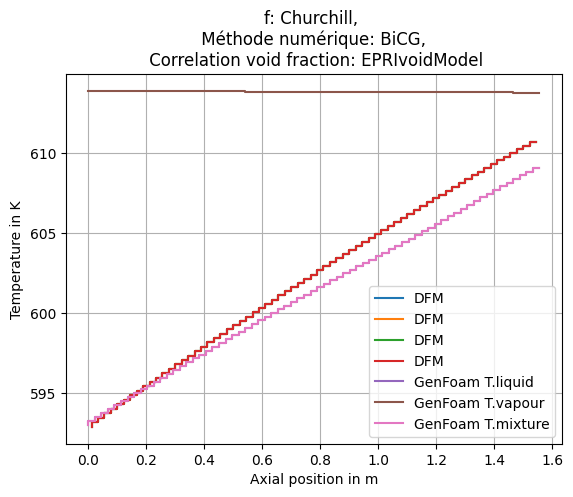

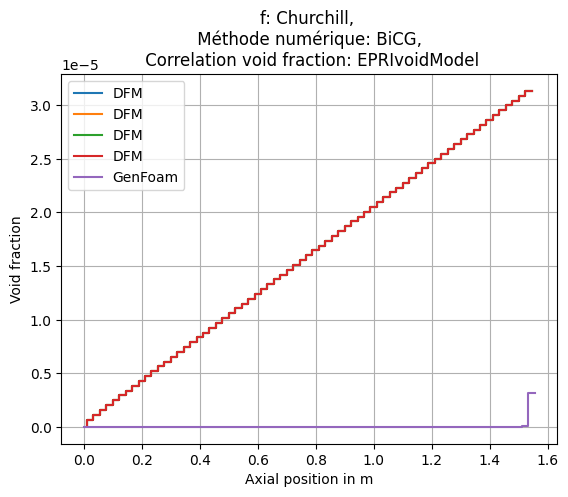

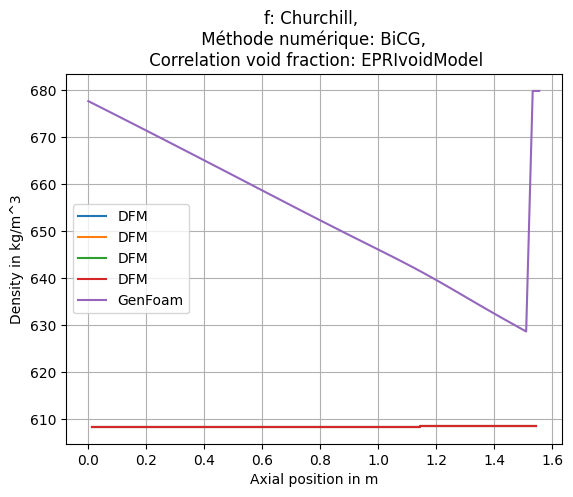

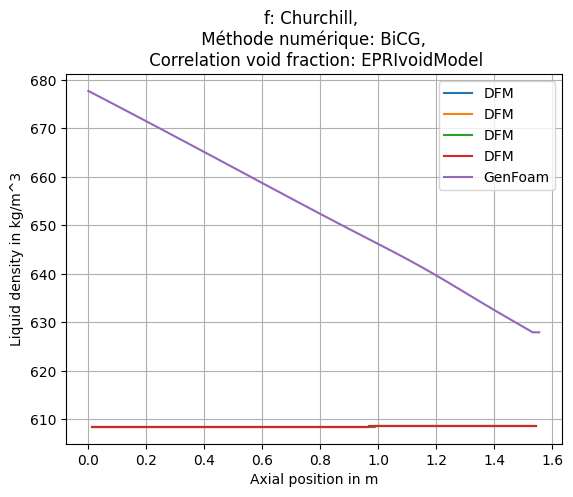

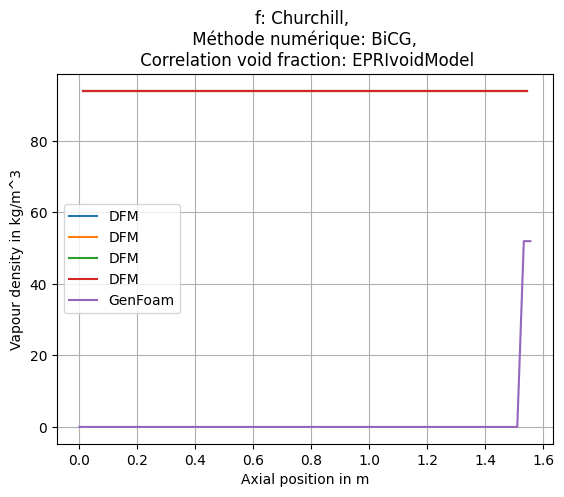

...

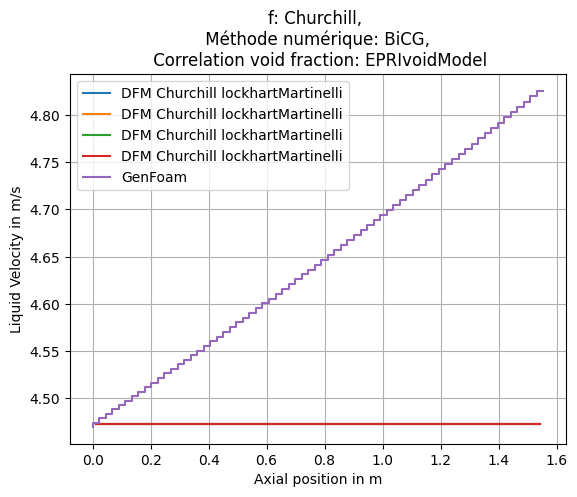

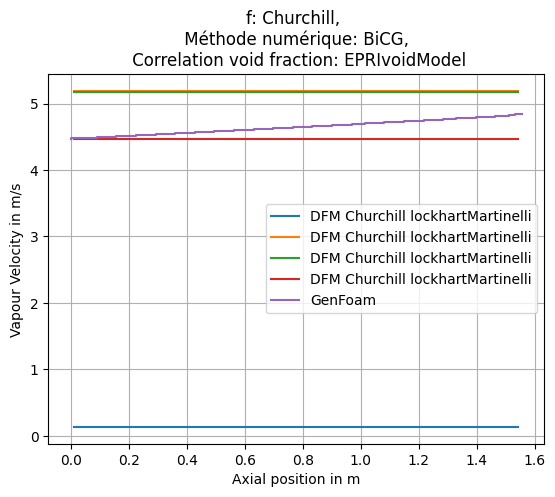

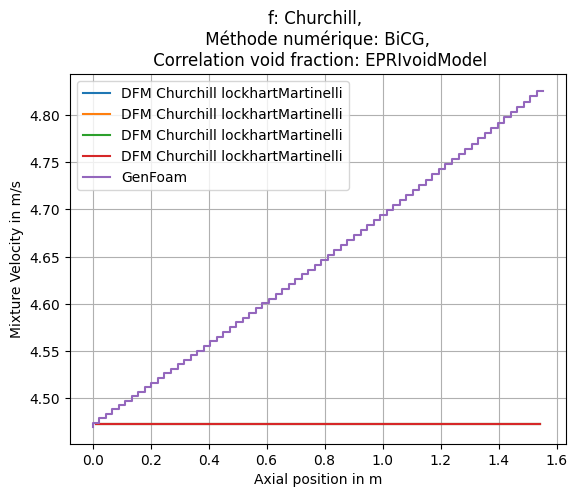

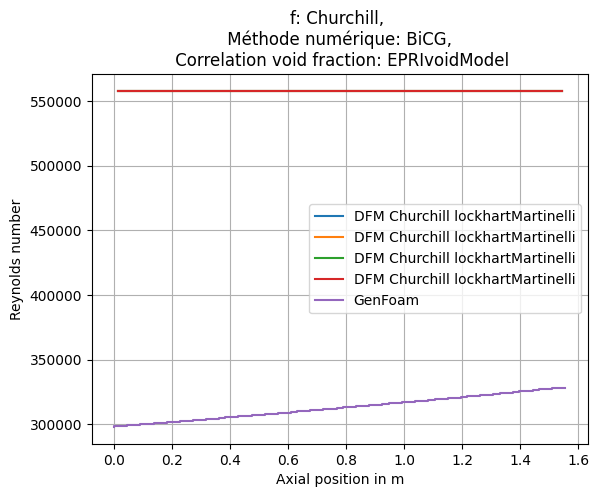

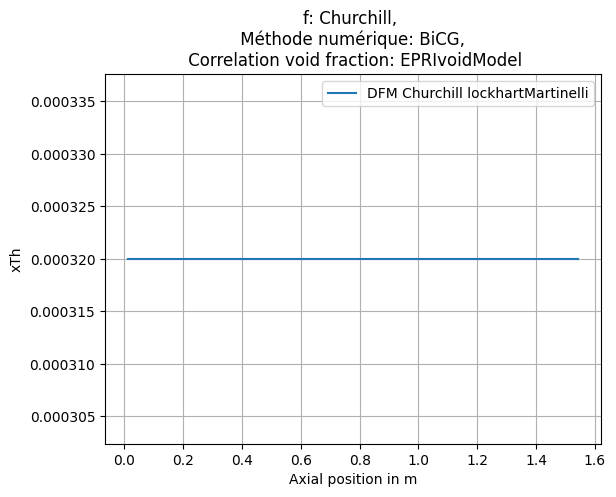

C:\Users\cleme\AppData\Local\Temp\ipykernel_20072\1223046657.py:469: RuntimeWarning: divide by zero encountered in divide
  self.error_eps_rel.append(self.error_eps_abs[-1]/(self.alpha_vapour))


Mean relative error in pressure: 0.041802014713492604, max relative error in pressure 0.08172076514458665 for EPRIvoidModel
Mean relative error in pressure: 0.04180356991782972, max relative error in pressure 0.08172443641324728 for GEramp
Mean relative error in pressure: 0.041803563735515935, max relative error in pressure 0.08172442546657699 for modBestion
Mean relative error in pressure: 0.041802896188077386, max relative error in pressure 0.08172320485347727 for HEM1
[0.041802014713492604, 0.04180356991782972, 0.041803563735515935, 0.041802896188077386]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\1.5GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: alphaRhoP

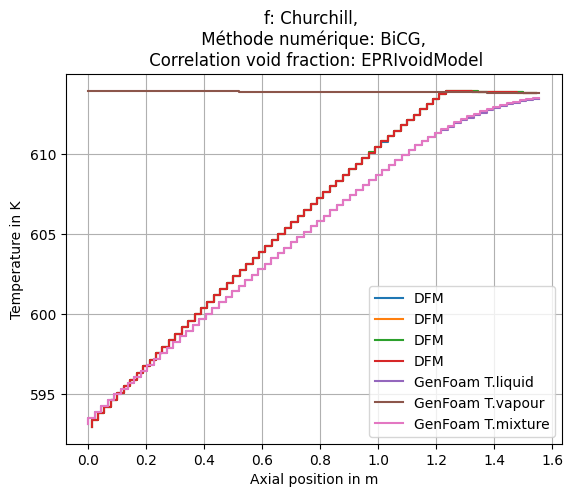

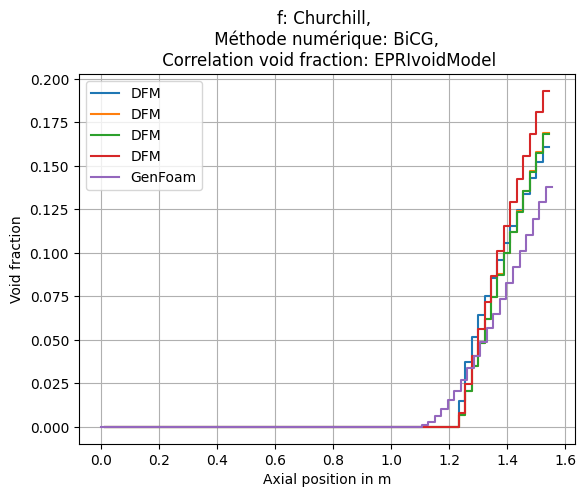

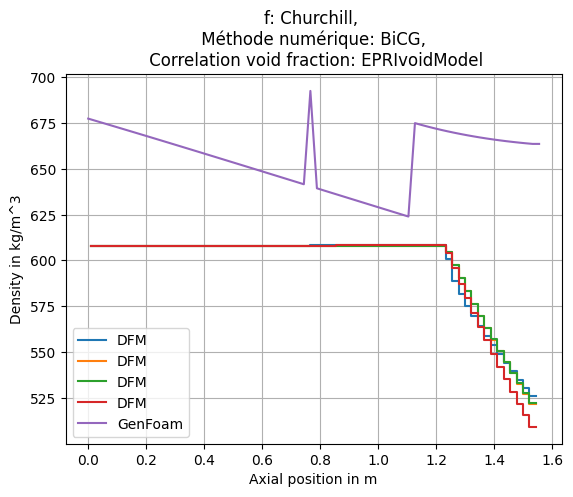

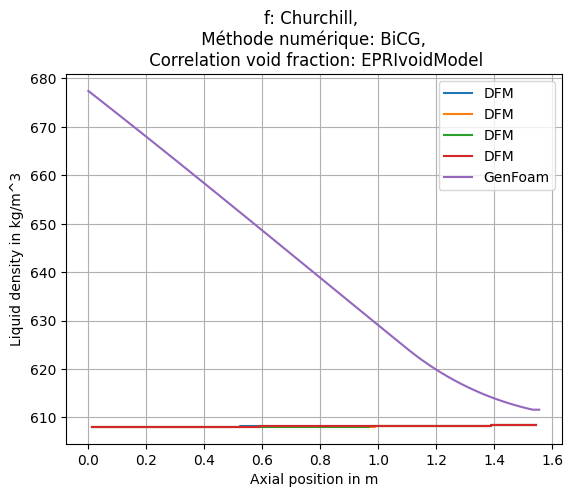

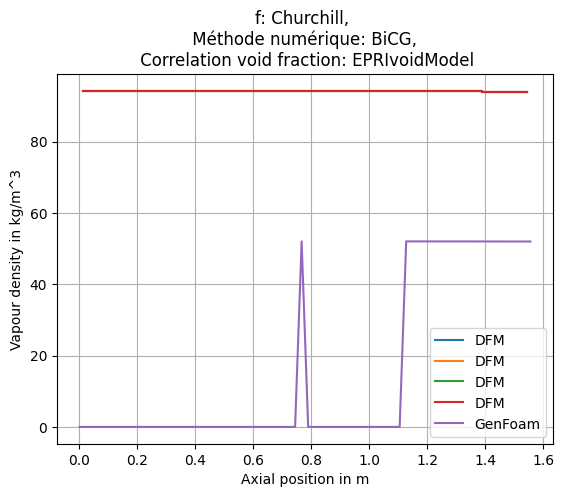

...

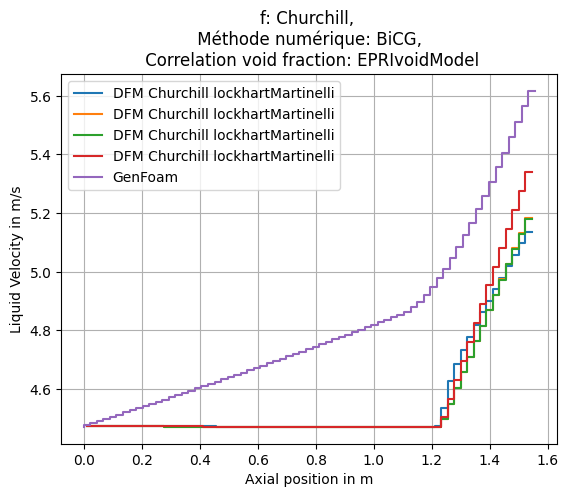

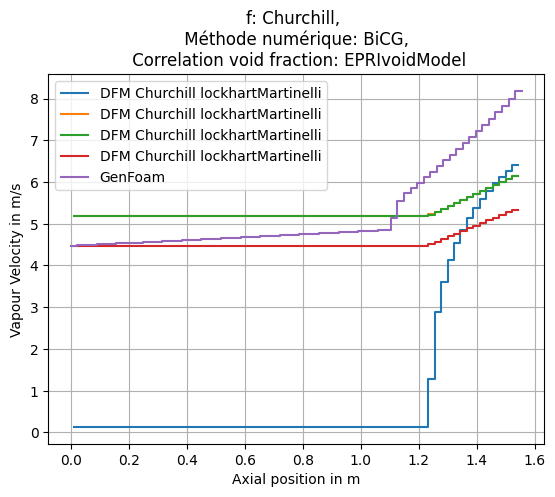

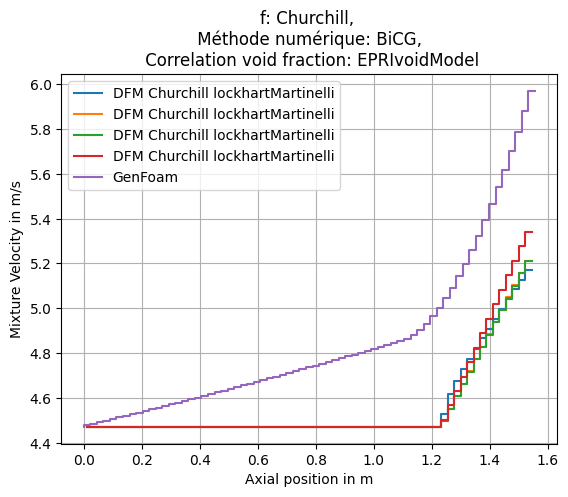

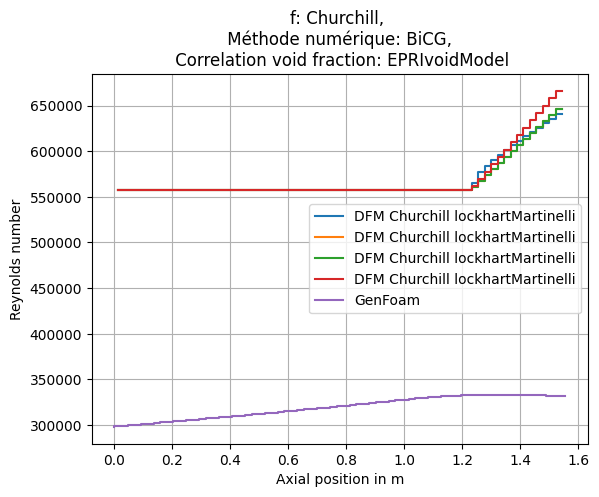

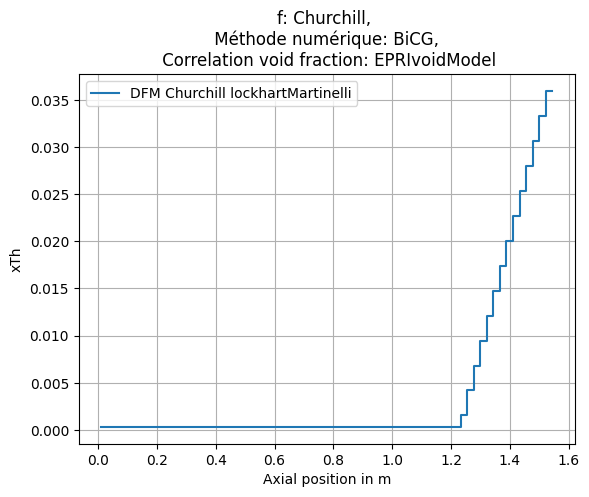

Mean relative error in pressure: 0.02586944319007165, max relative error in pressure 0.059992677857249904 for EPRIvoidModel
Mean relative error in pressure: 0.037225031853276754, max relative error in pressure 0.07611765842390733 for GEramp
Mean relative error in pressure: 0.037117920223667056, max relative error in pressure 0.07599751279306849 for modBestion
Mean relative error in pressure: 0.026492093007641885, max relative error in pressure 0.06277117746161626 for HEM1
[0.02586944319007165, 0.037225031853276754, 0.037117920223667056, 0.026492093007641885]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\2.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: alphaRho

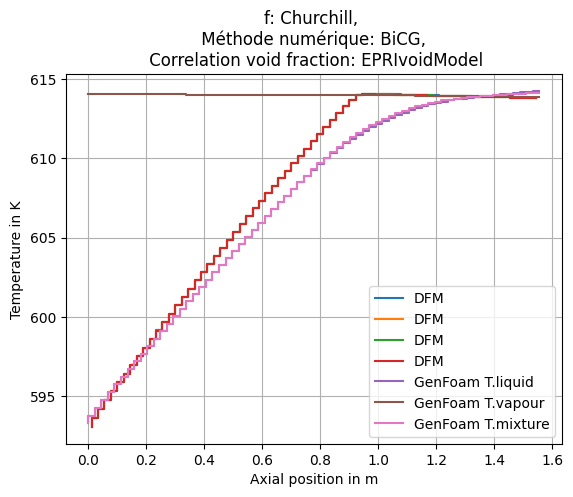

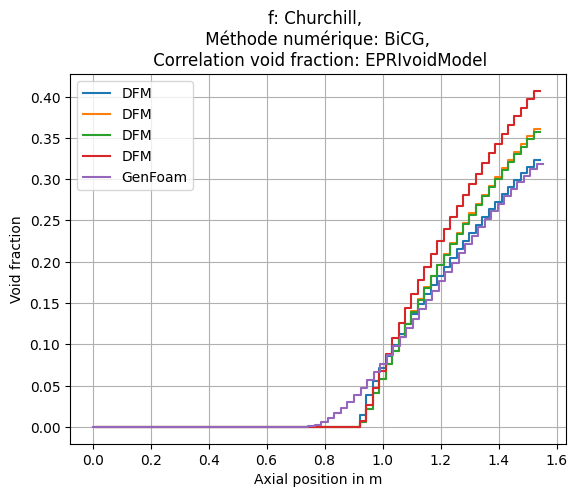

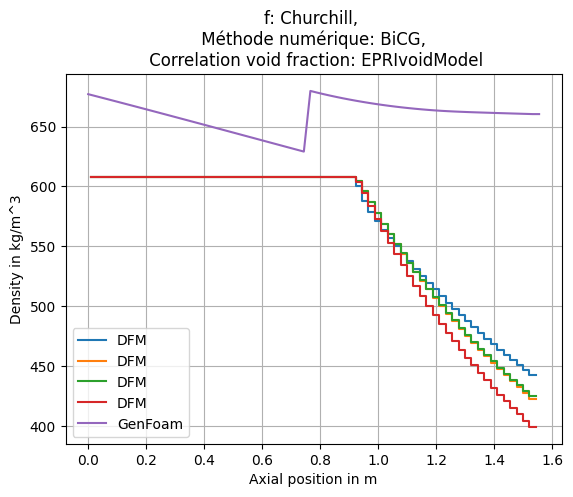

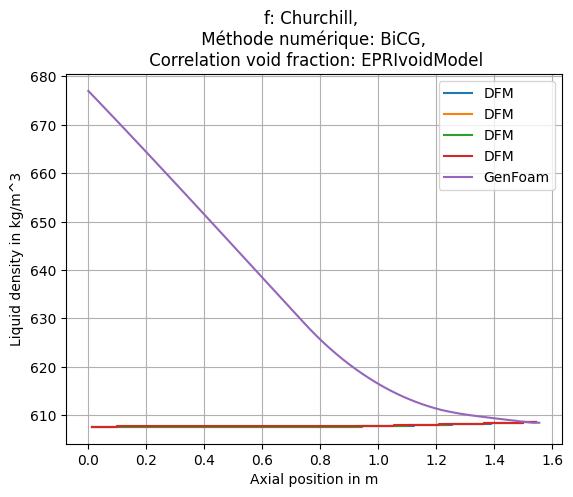

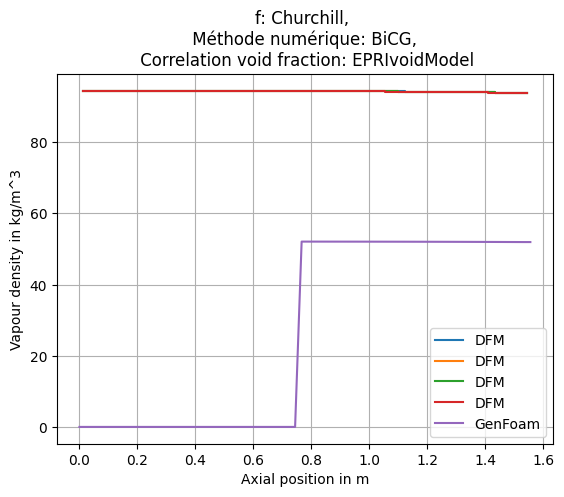

...

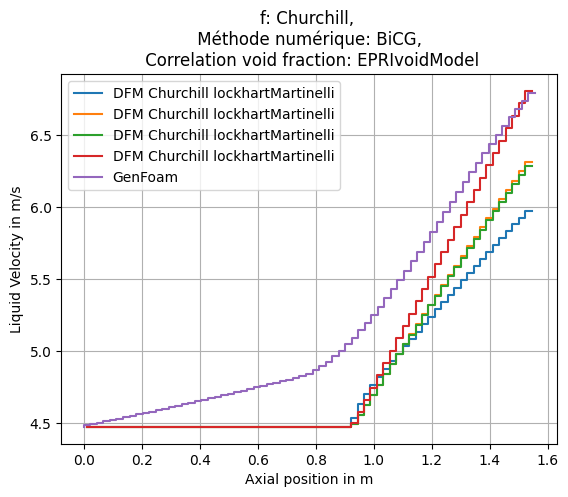

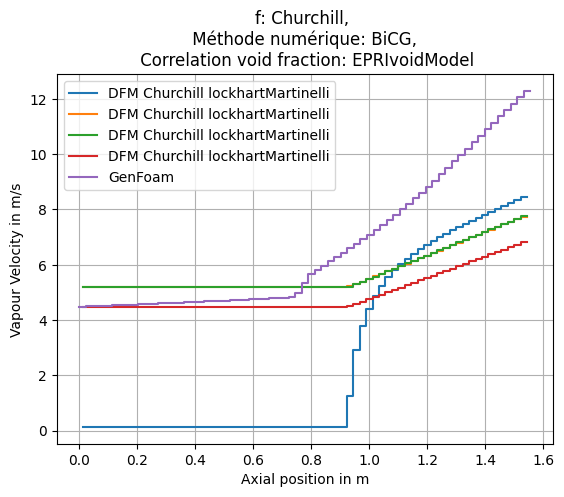

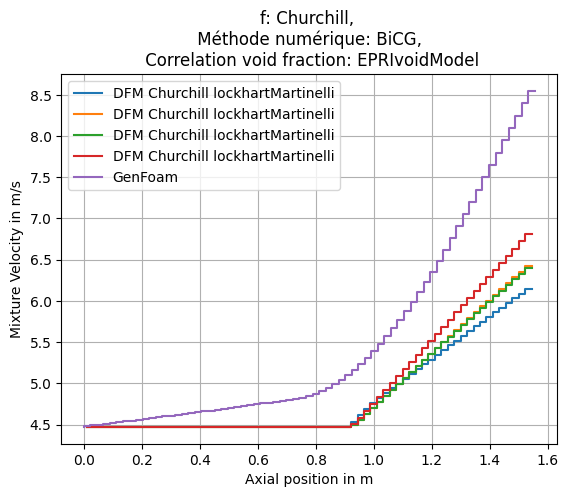

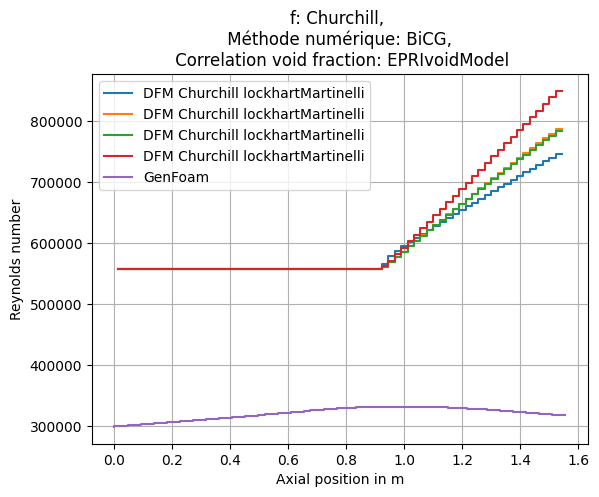

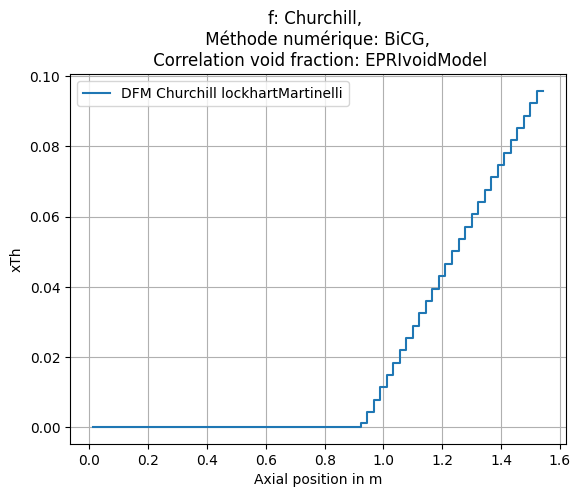

Mean relative error in pressure: 0.0387676000954829, max relative error in pressure 0.07643460760894333 for EPRIvoidModel
Mean relative error in pressure: 0.03709747015164551, max relative error in pressure 0.07829495038137226 for GEramp
Mean relative error in pressure: 0.03681920413168501, max relative error in pressure 0.077939089777999 for modBestion
Mean relative error in pressure: 0.01649898306488092, max relative error in pressure 0.04885005530547836 for HEM1
[0.0387676000954829, 0.03709747015164551, 0.03681920413168501, 0.01649898306488092]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\2.5GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: alphaRhoPhi.liquid


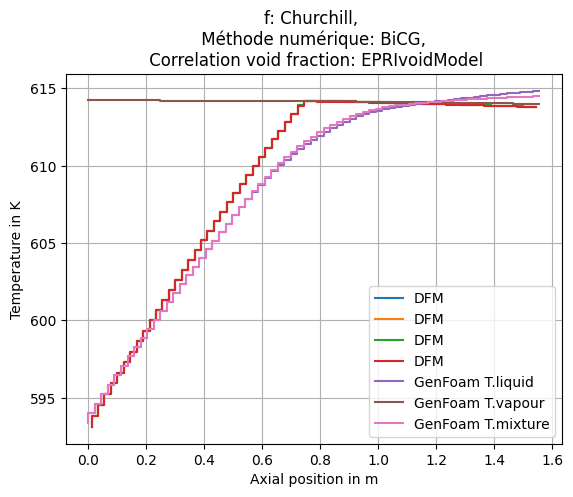

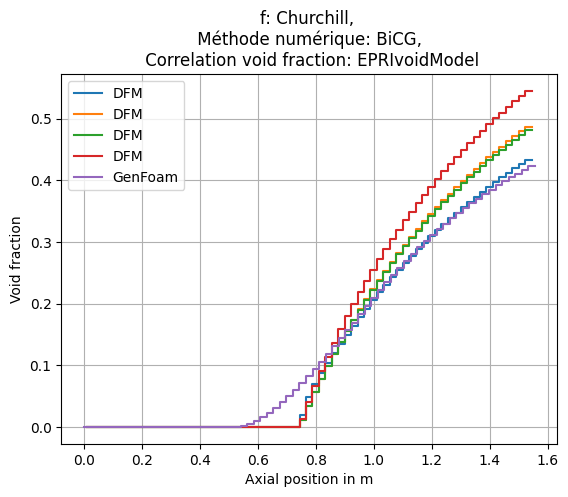

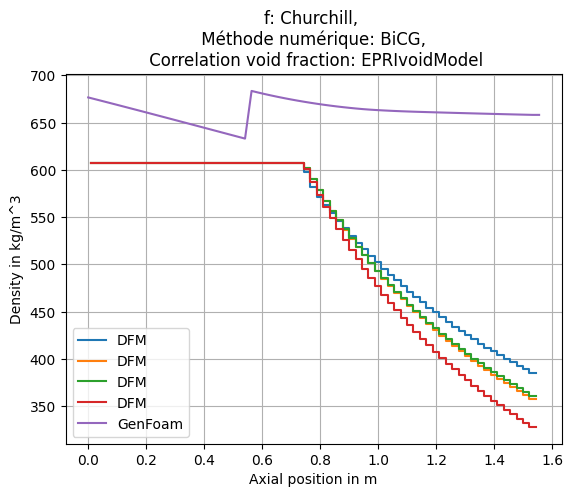

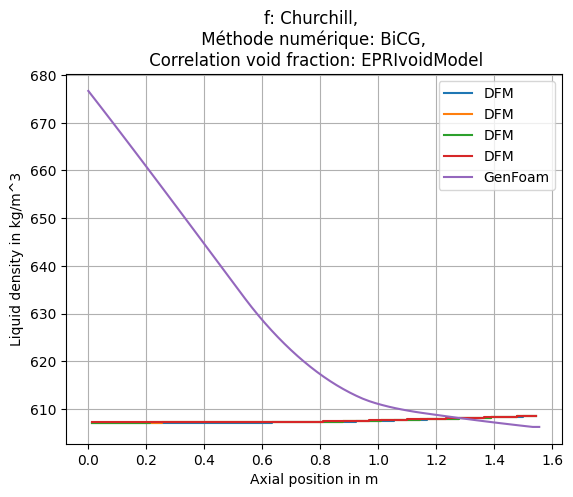

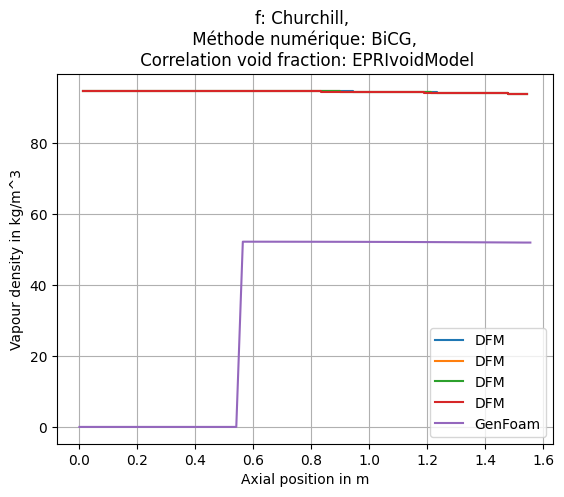

...

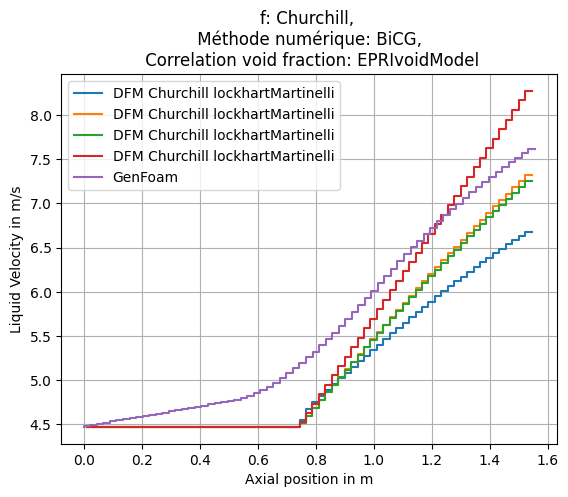

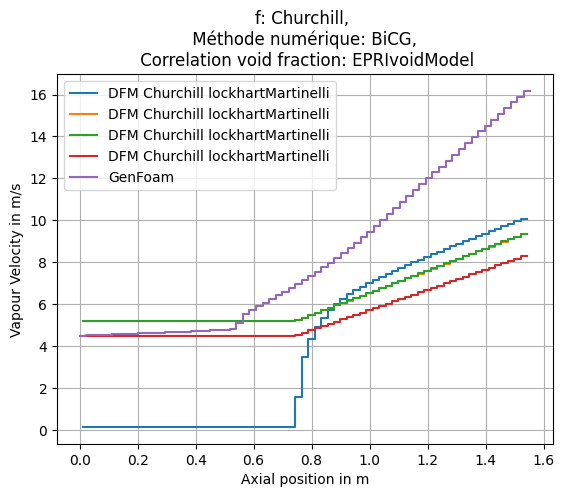

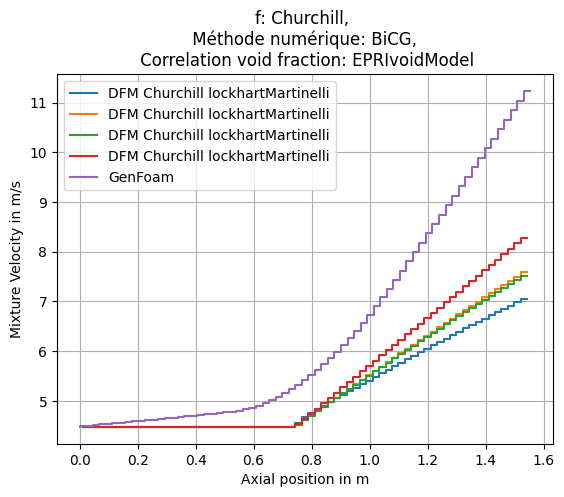

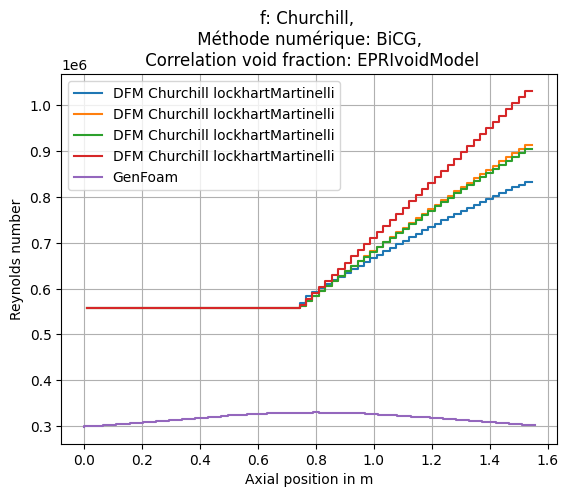

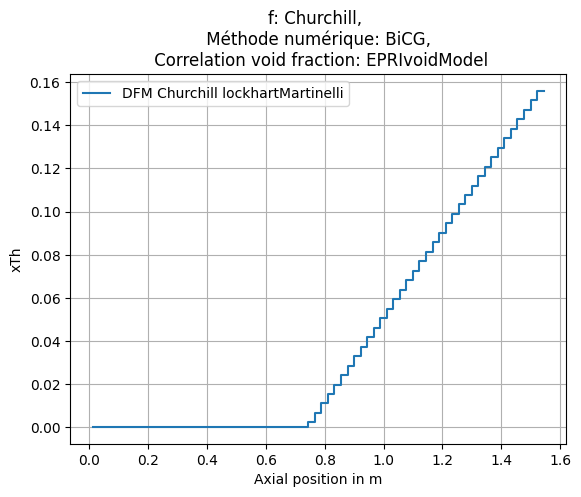

Mean relative error in pressure: 0.021622621784510253, max relative error in pressure 0.04384817895160442 for EPRIvoidModel
Mean relative error in pressure: 0.032532715357634696, max relative error in pressure 0.05630057880801047 for GEramp
Mean relative error in pressure: 0.033204339093303954, max relative error in pressure 0.057200523680887724 for modBestion
Mean relative error in pressure: 0.0641963881426109, max relative error in pressure 0.09709699705826315 for HEM1
[0.021622621784510253, 0.032532715357634696, 0.033204339093303954, 0.0641963881426109]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\3.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: alphaRhoPh

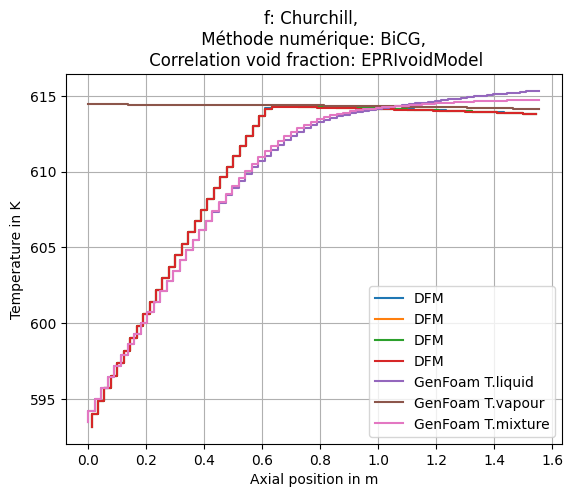

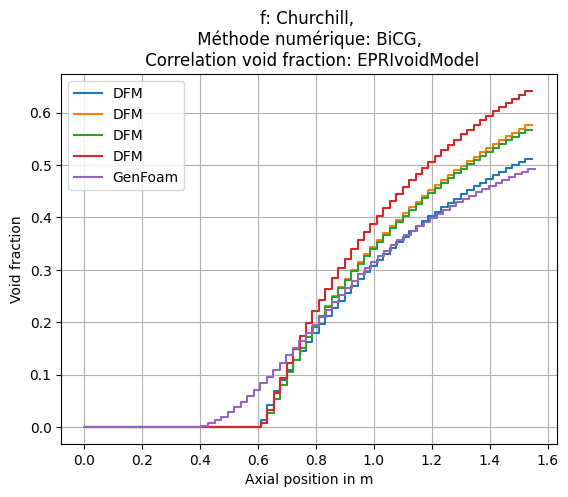

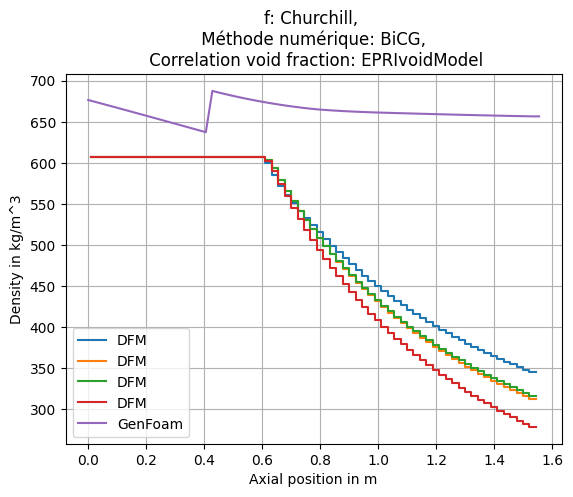

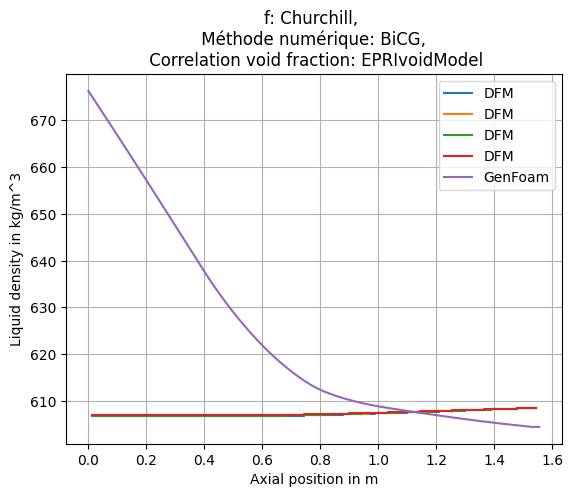

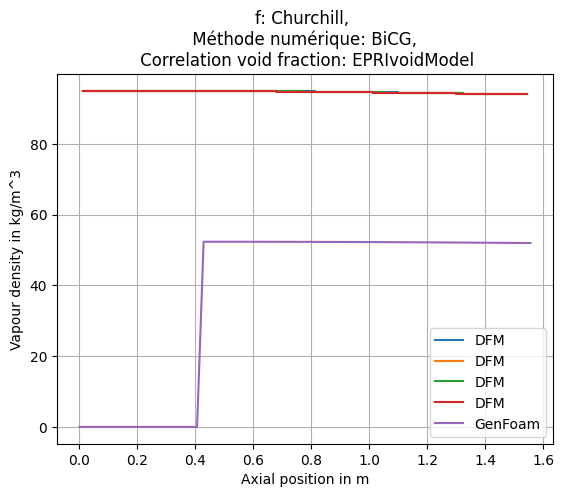

...

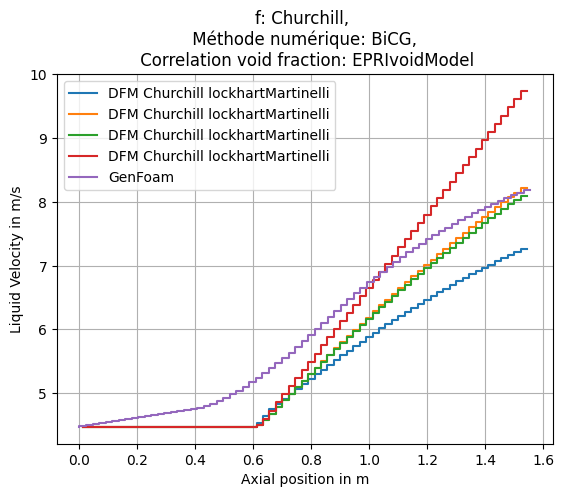

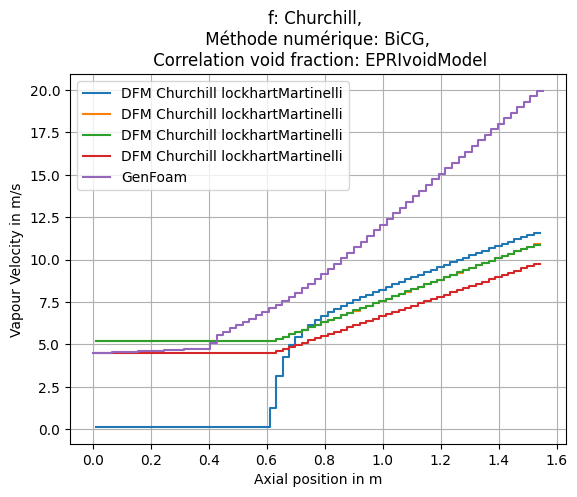

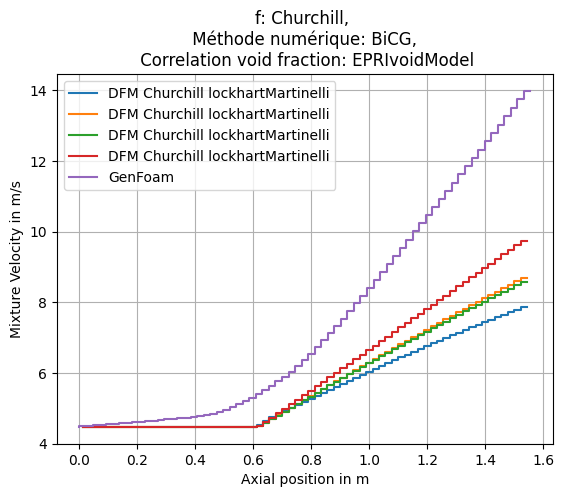

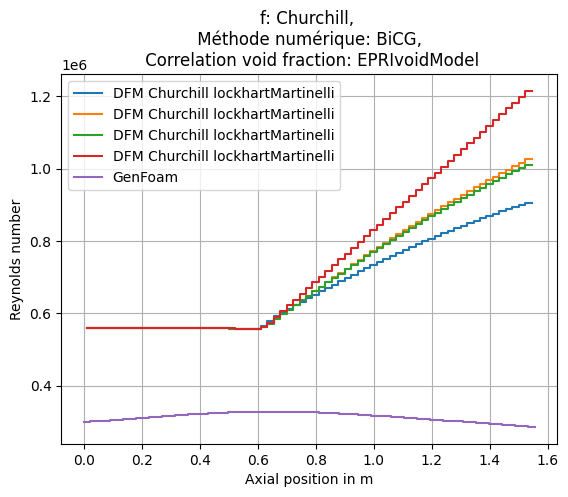

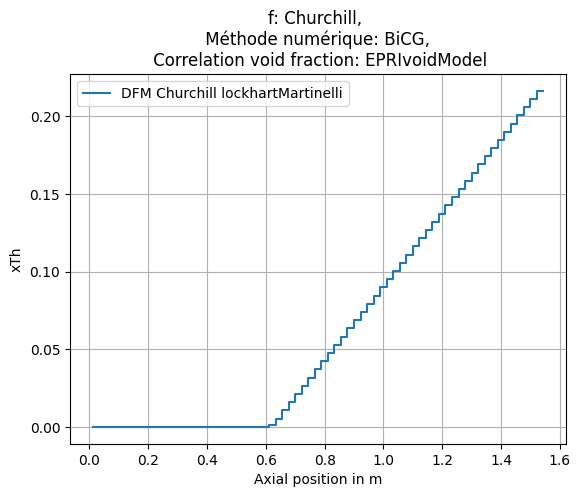

Mean relative error in pressure: 0.09228844462223335, max relative error in pressure 0.12523533773502032 for EPRIvoidModel
Mean relative error in pressure: 0.1104584930705475, max relative error in pressure 0.14361520003342132 for GEramp
Mean relative error in pressure: 0.11195844257813213, max relative error in pressure 0.1455082269778353 for modBestion
Mean relative error in pressure: 0.14954112265773828, max relative error in pressure 0.1954147170004262 for HEM1
[0.09228844462223335, 0.1104584930705475, 0.11195844257813213, 0.14954112265773828]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\3.5GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: alphaRhoPhi.liquid


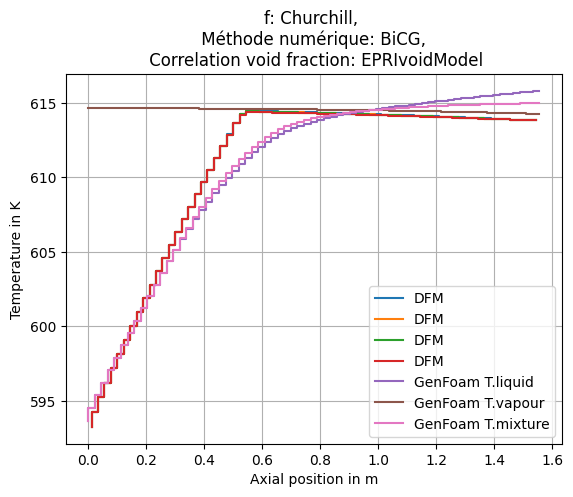

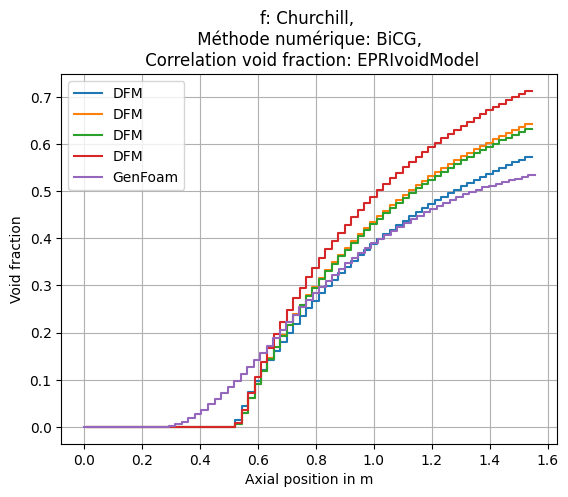

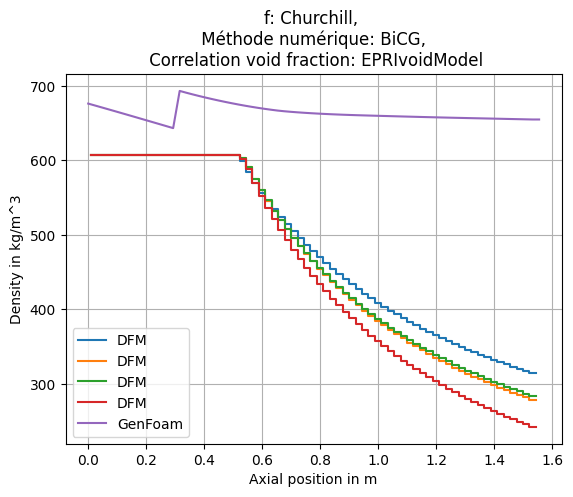

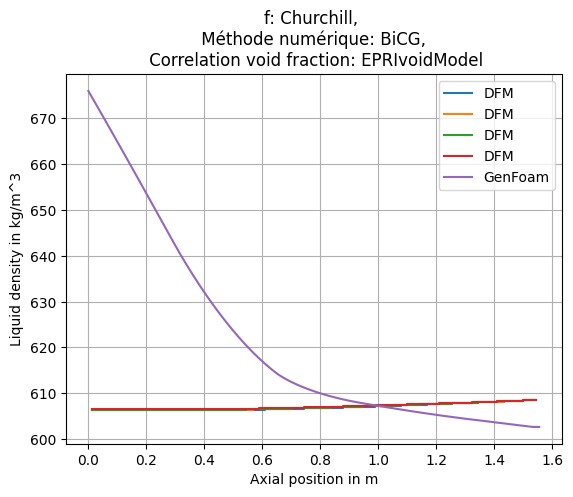

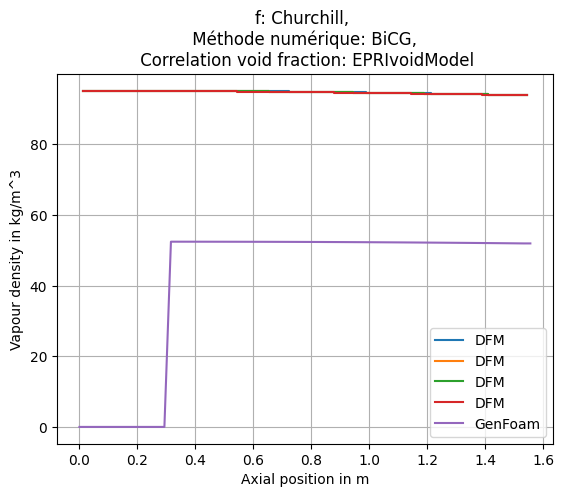

...

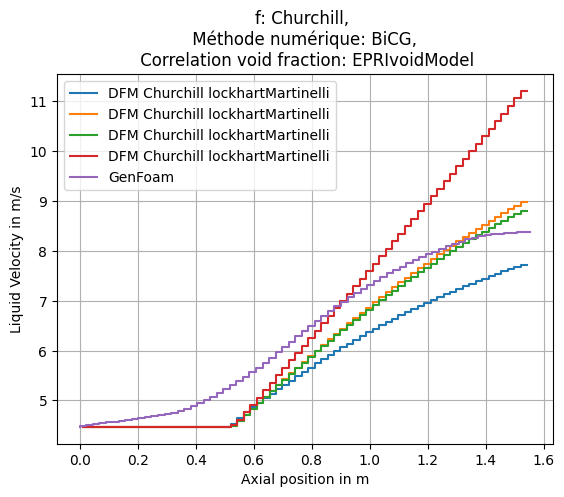

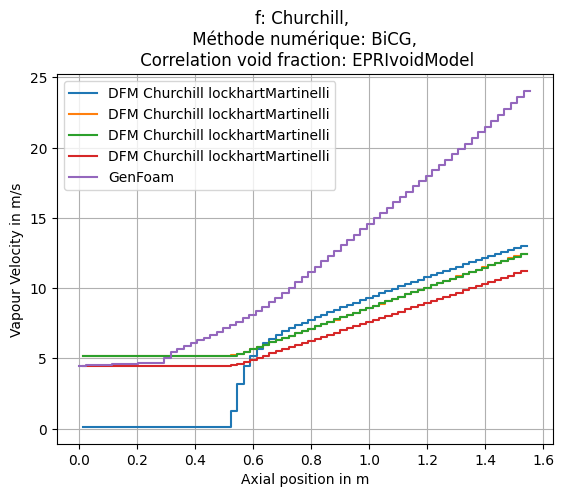

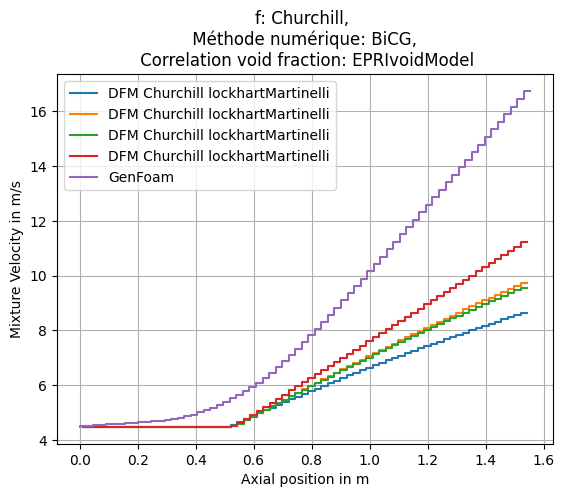

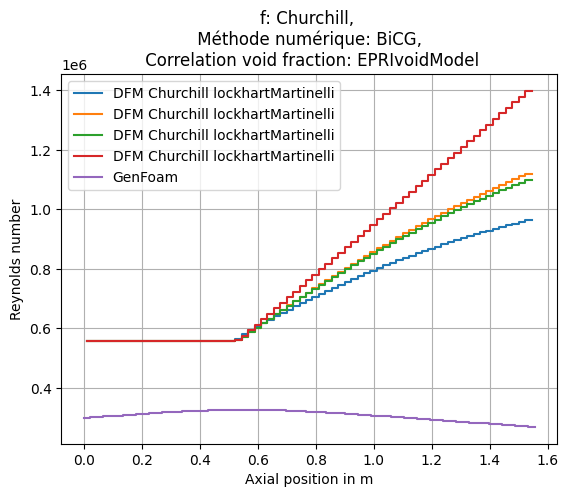

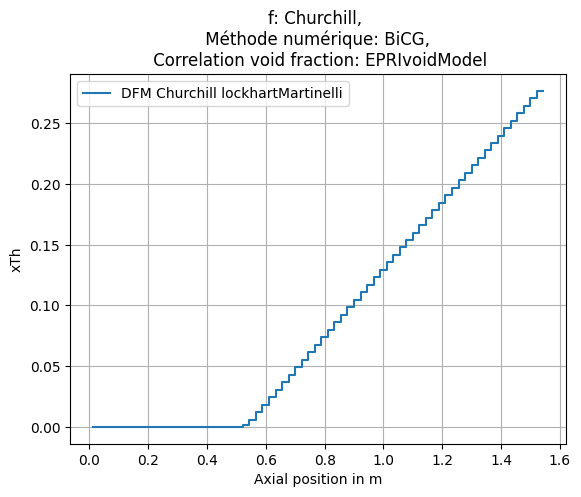

Mean relative error in pressure: 0.1940444777128066, max relative error in pressure 0.25677317733914545 for EPRIvoidModel
Mean relative error in pressure: 0.2156363230406067, max relative error in pressure 0.28036604559071215 for GEramp
Mean relative error in pressure: 0.21818807222955963, max relative error in pressure 0.28362327712160734 for modBestion
Mean relative error in pressure: 0.2622893952282263, max relative error in pressure 0.3428560208554718 for HEM1
[0.1940444777128066, 0.2156363230406067, 0.21818807222955963, 0.2622893952282263]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\4.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: alphaRhoPhi.liquid
Rea

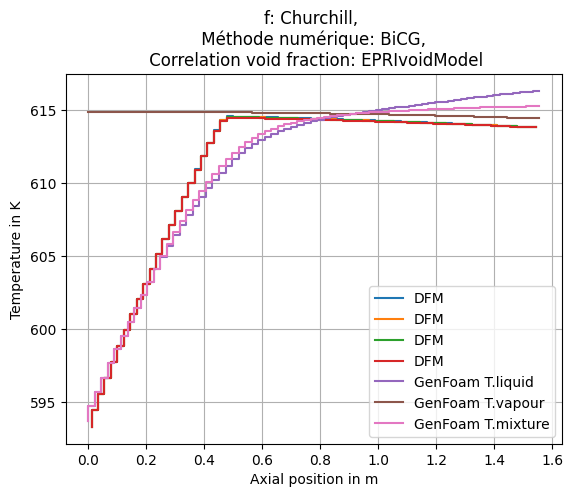

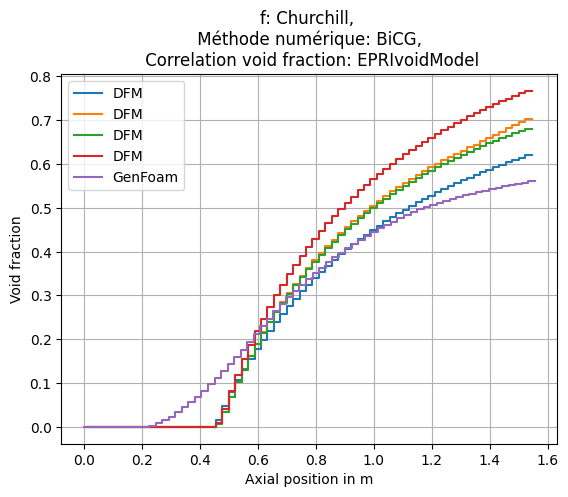

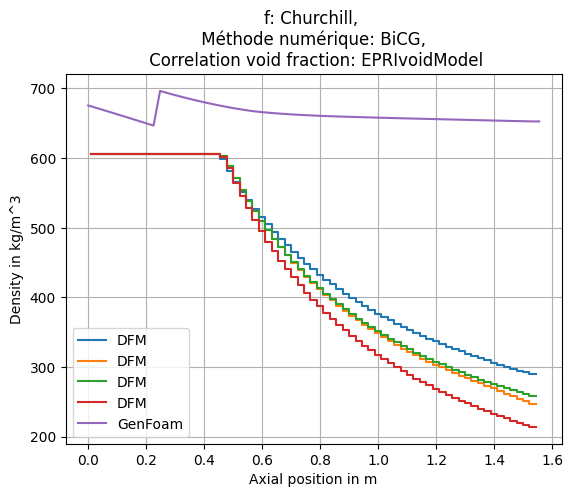

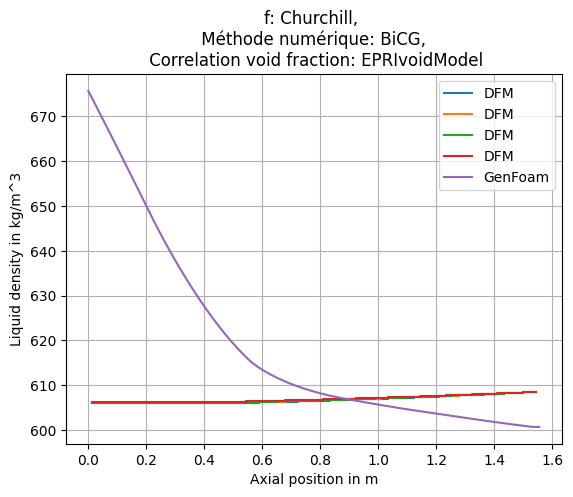

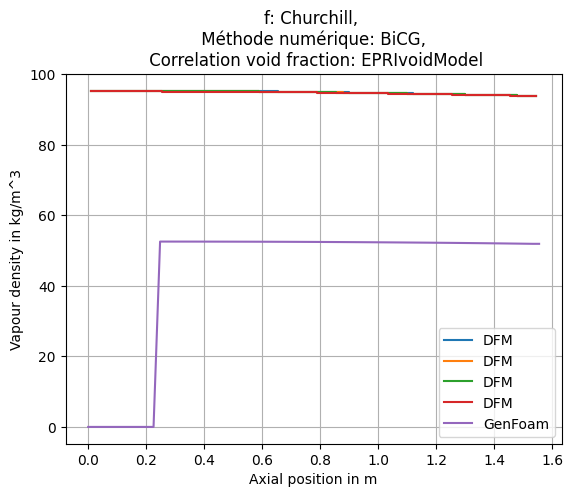

...

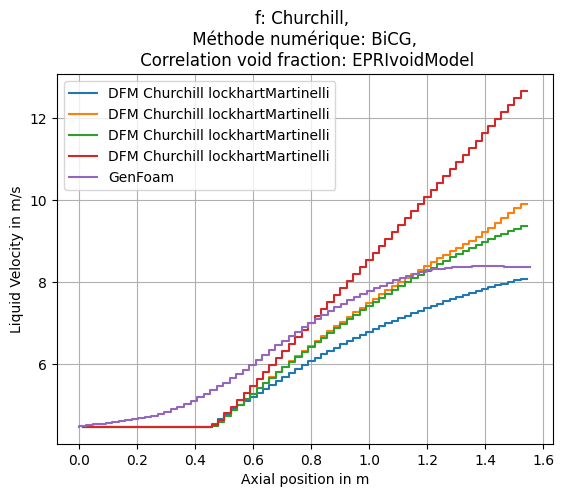

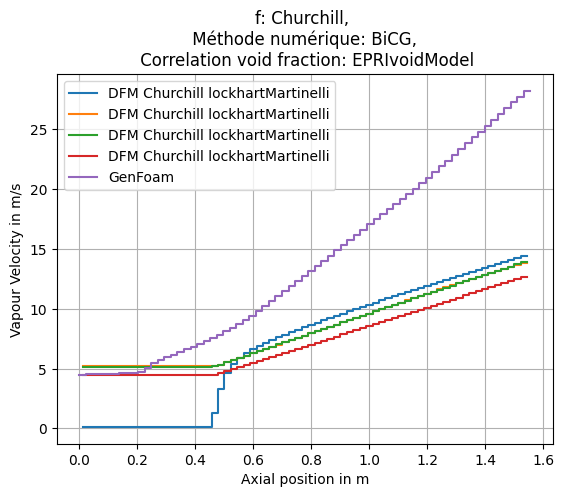

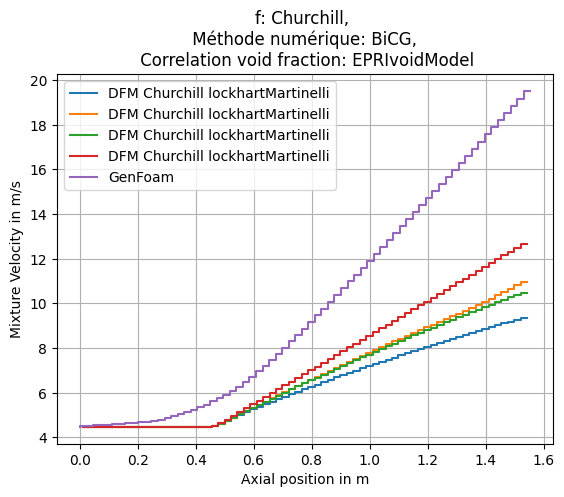

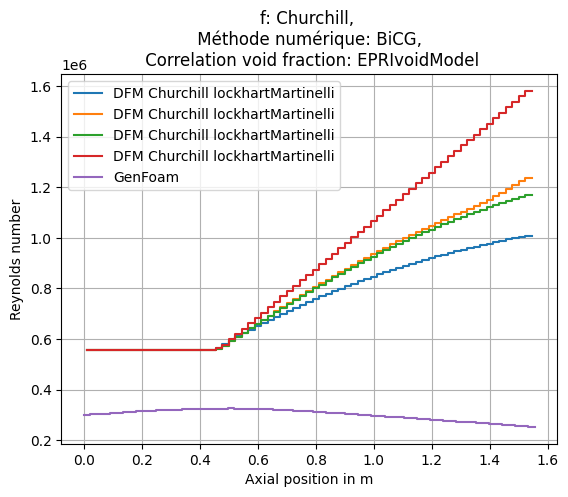

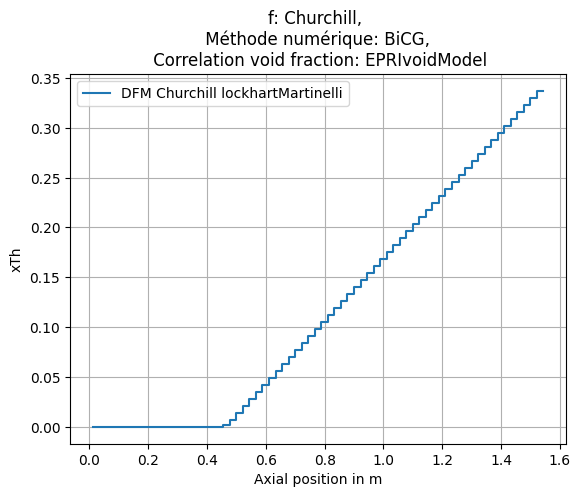

Mean relative error in pressure: 0.3296299029405066, max relative error in pressure 0.42079930536892324 for EPRIvoidModel
Mean relative error in pressure: 0.35006202872936354, max relative error in pressure 0.44454819949677227 for GEramp
Mean relative error in pressure: 0.3569040078541809, max relative error in pressure 0.45268321508423476 for modBestion
Mean relative error in pressure: 0.40862705555215567, max relative error in pressure 0.5220685678657918 for HEM1
[0.3296299029405066, 0.35006202872936354, 0.3569040078541809, 0.40862705555215567]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\4.5GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: alphaRhoPhi.liquid
R

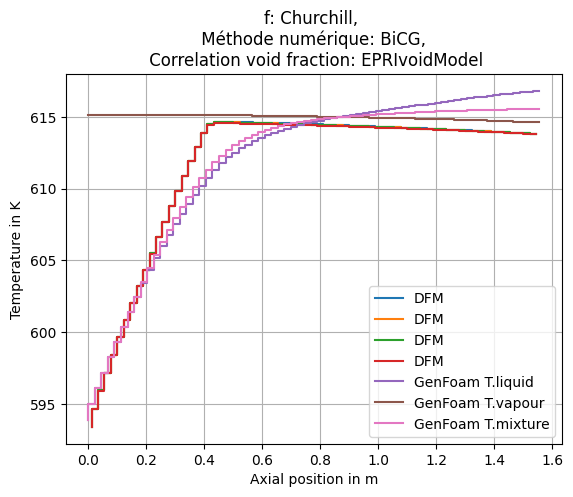

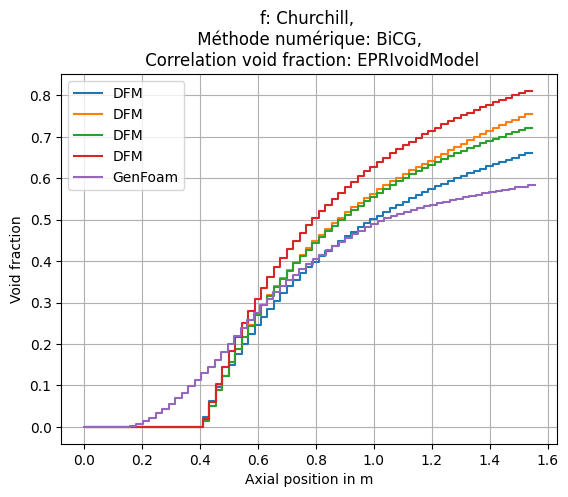

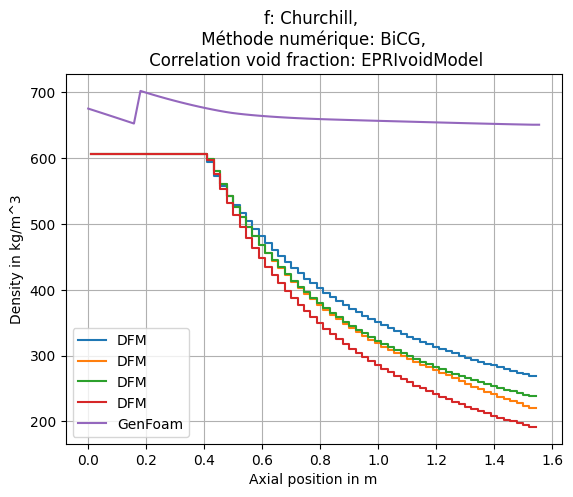

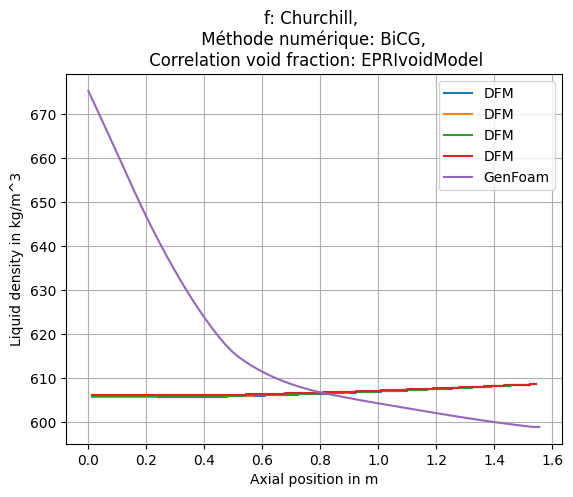

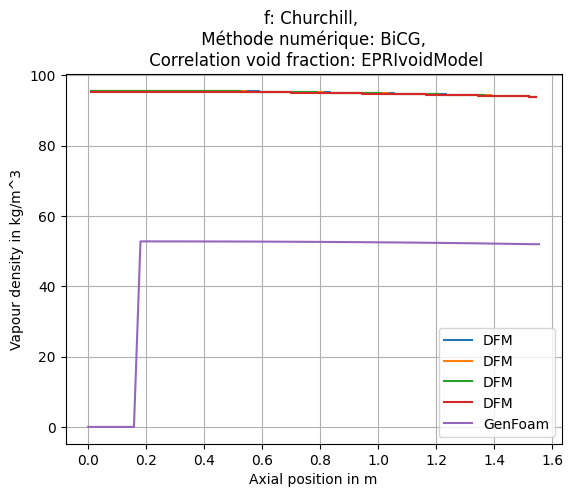

...

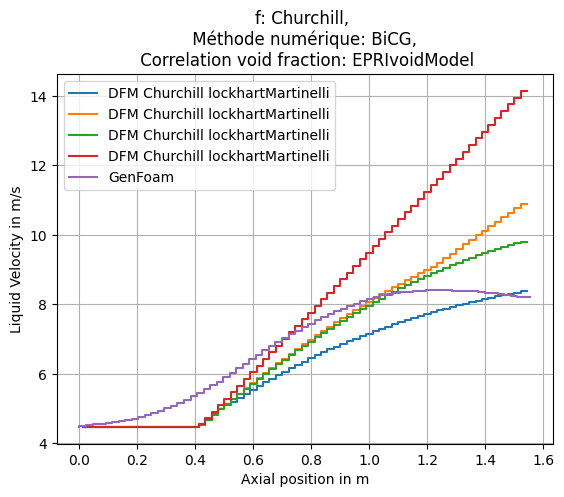

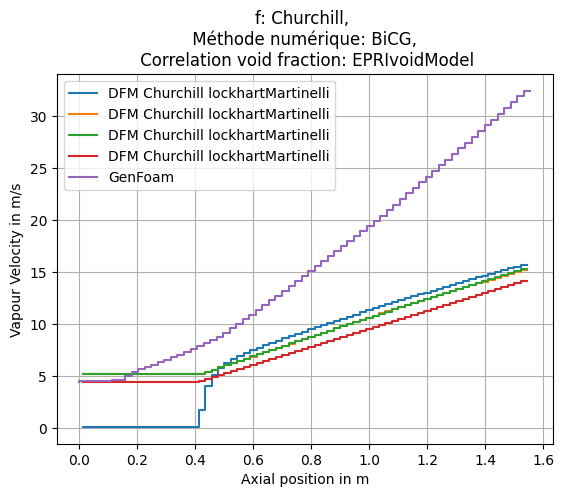

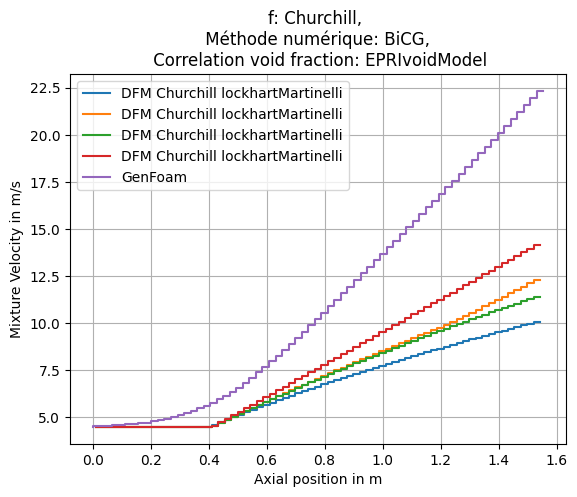

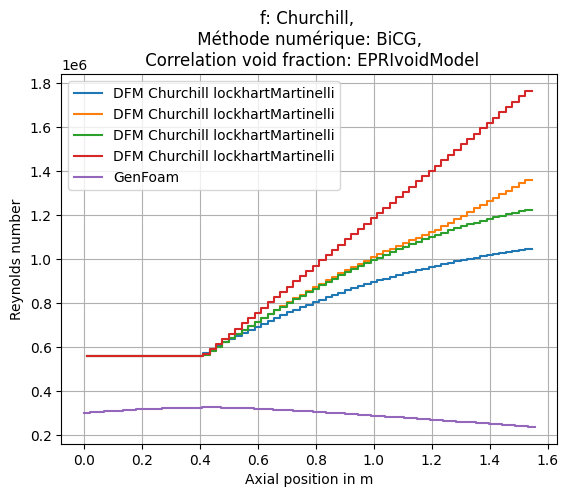

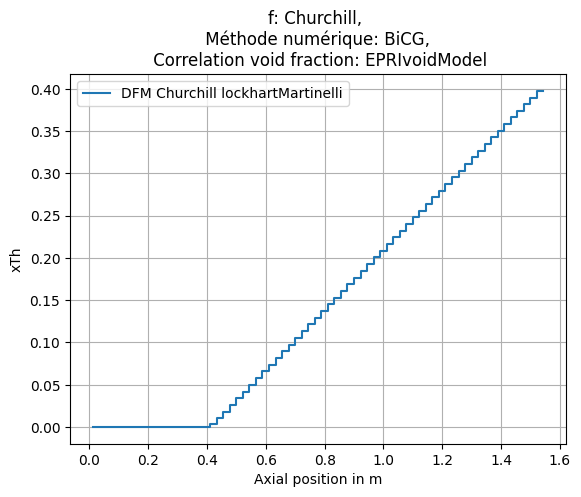

Mean relative error in pressure: 0.49375802191907264, max relative error in pressure 0.6347546153013826 for EPRIvoidModel
Mean relative error in pressure: 0.5146547855919905, max relative error in pressure 0.6610287025278961 for GEramp
Mean relative error in pressure: 0.5237996119405955, max relative error in pressure 0.6724010272248402 for modBestion
Mean relative error in pressure: 0.5849483083926352, max relative error in pressure 0.753391696130793 for HEM1
[0.49375802191907264, 0.5146547855919905, 0.5237996119405955, 0.5849483083926352]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\5.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: alphaRhoPhi.liquid
Reading

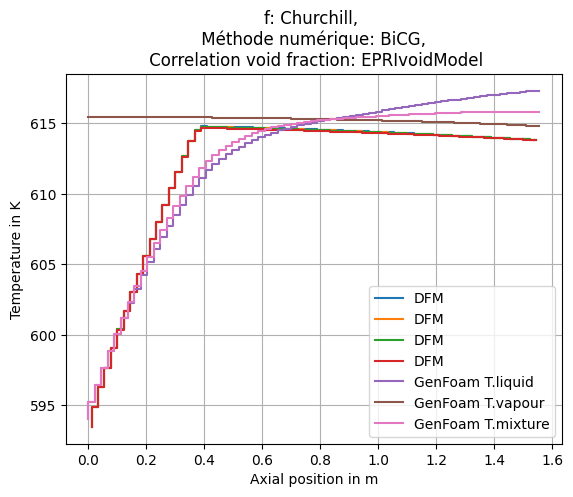

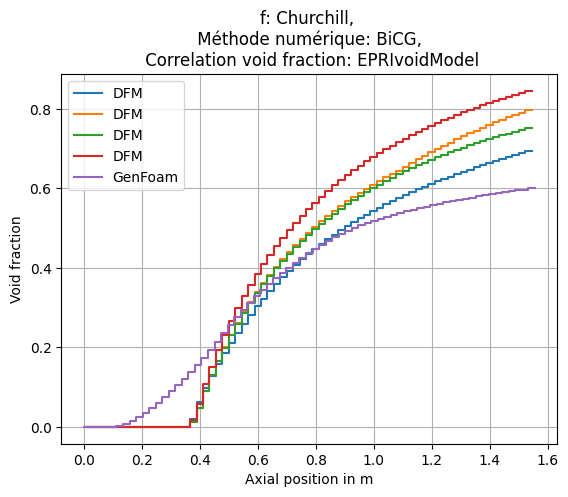

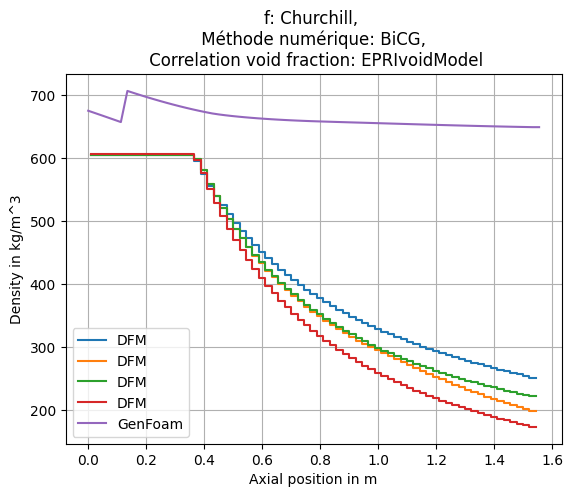

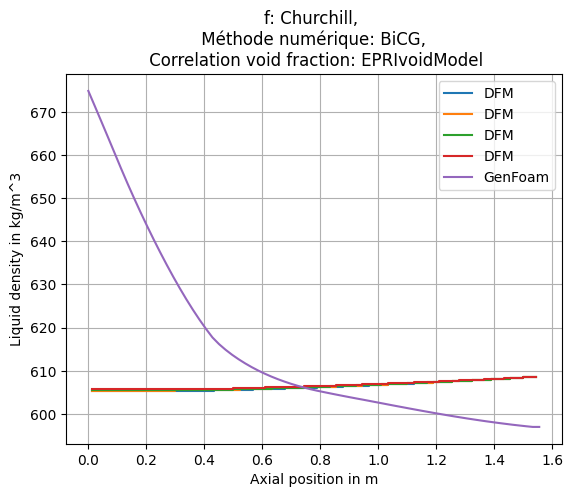

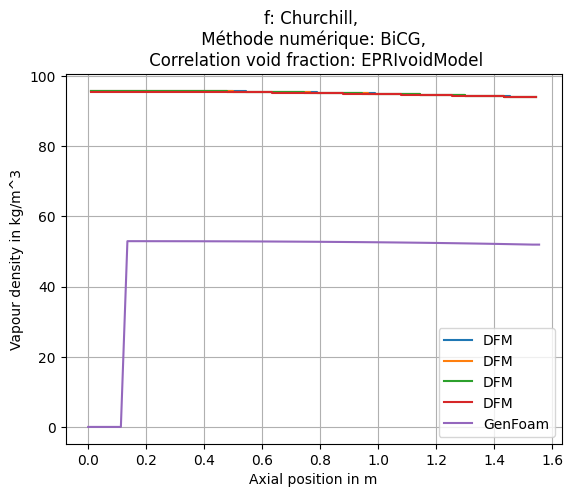

...

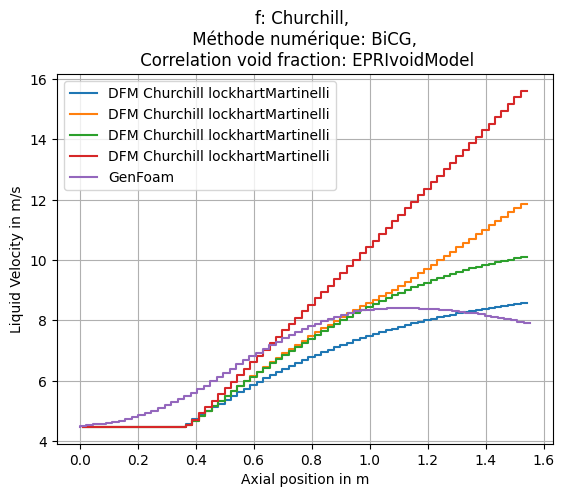

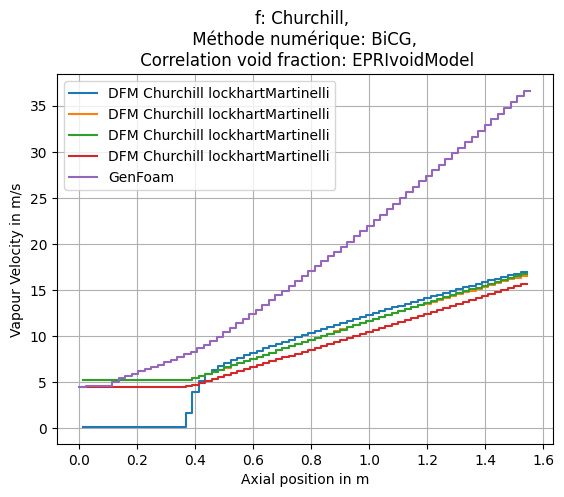

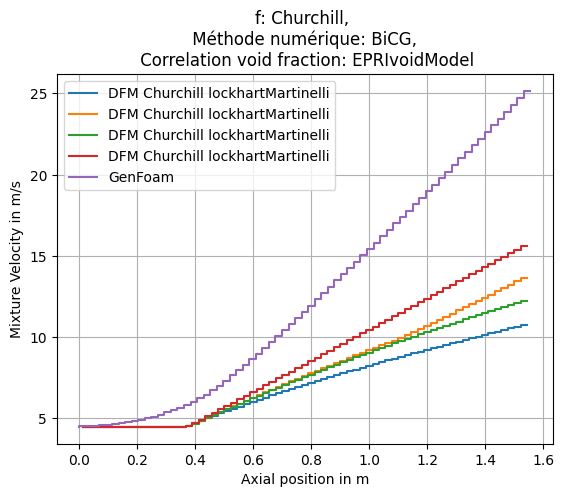

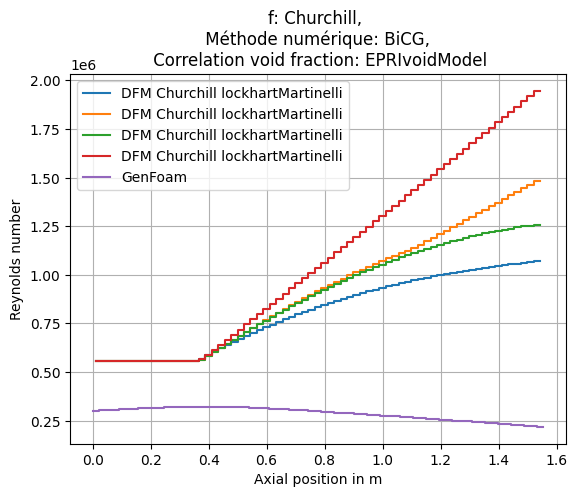

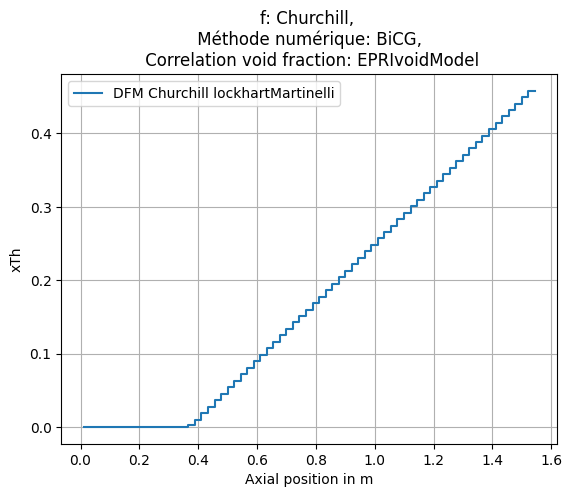

Mean relative error in pressure: 0.6732511540247652, max relative error in pressure 0.8648437965858213 for EPRIvoidModel
Mean relative error in pressure: 0.6948702723711699, max relative error in pressure 0.8915288100058527 for GEramp
Mean relative error in pressure: 0.7046981654823405, max relative error in pressure 0.904732728252524 for modBestion
Mean relative error in pressure: 0.7777217917299744, max relative error in pressure 1.0001456817500924 for HEM1
[0.6732511540247652, 0.6948702723711699, 0.7046981654823405, 0.7777217917299744]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\1.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: alphaRhoPhi.liquid
Reading f

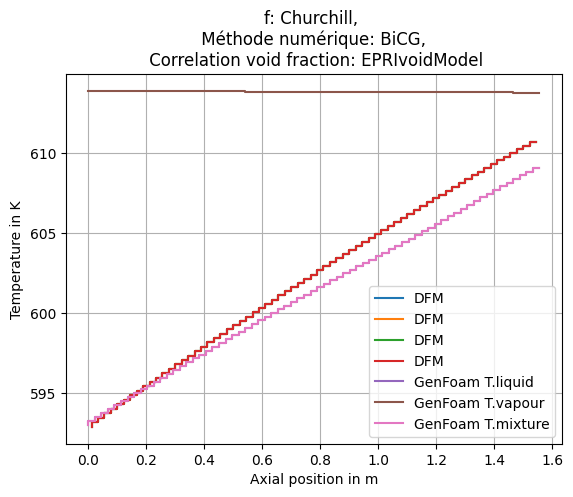

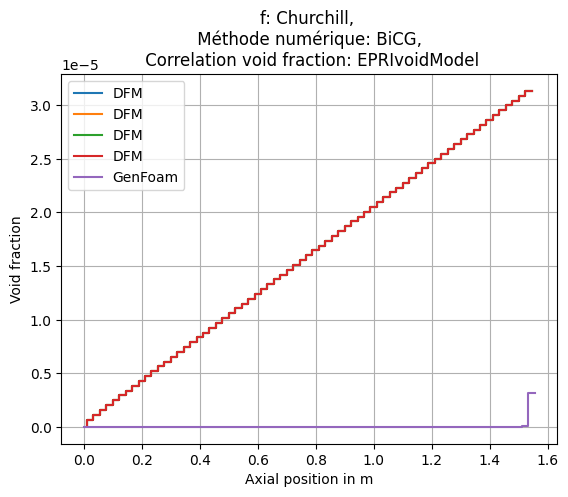

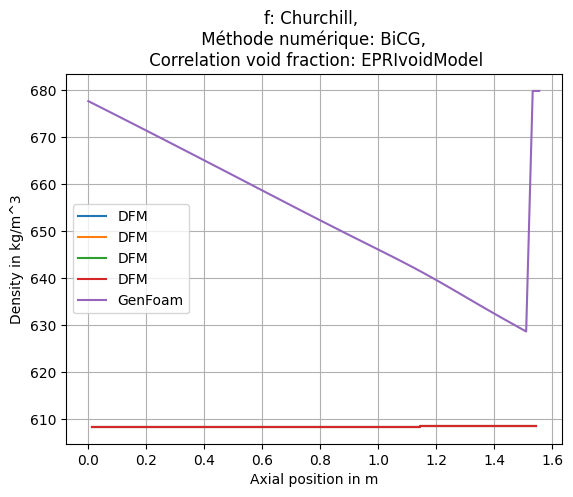

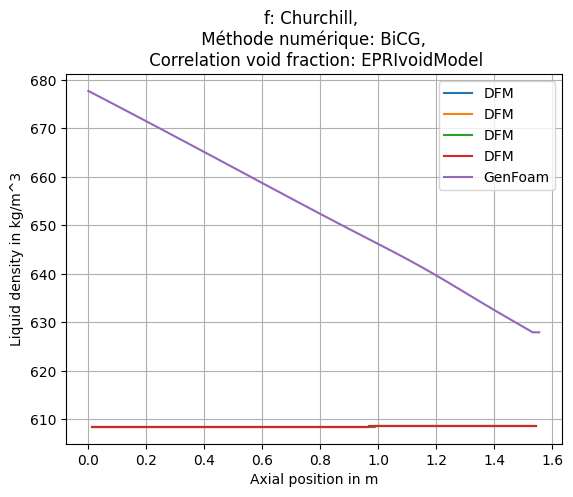

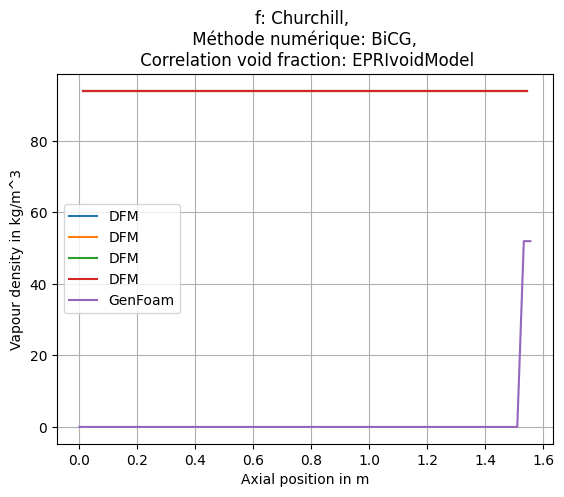

...

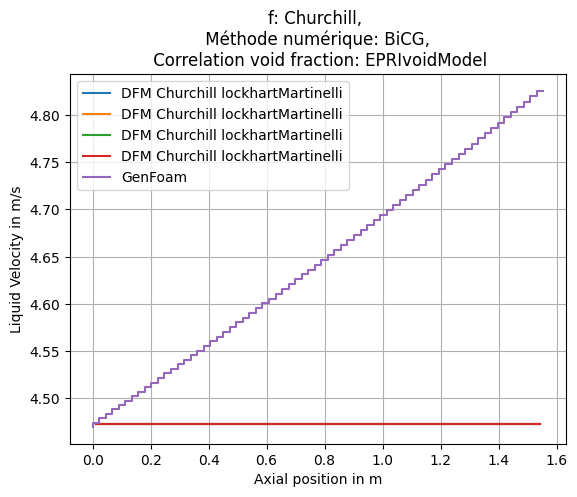

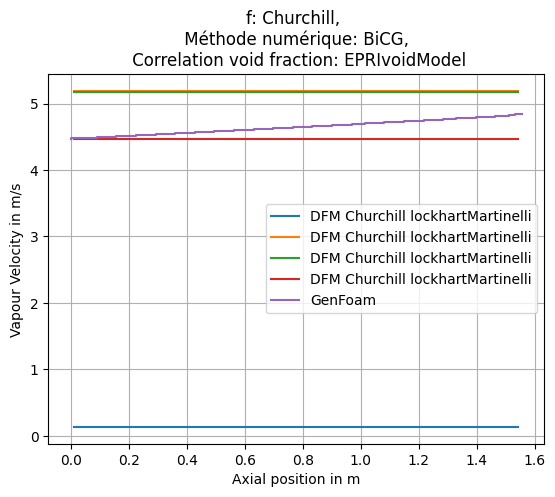

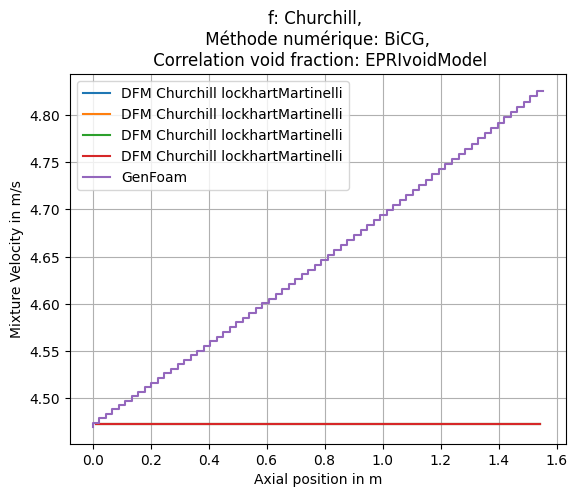

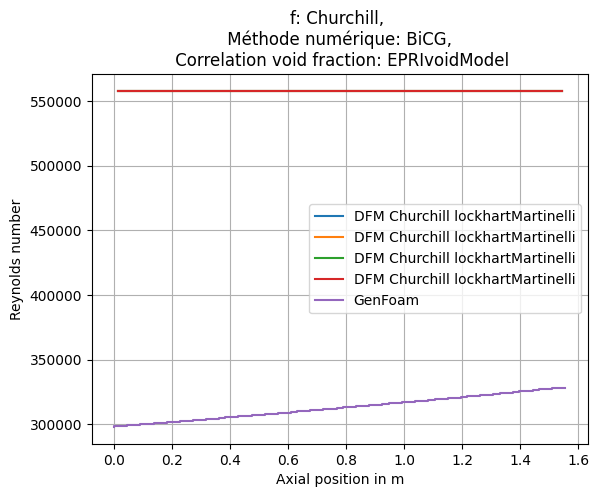

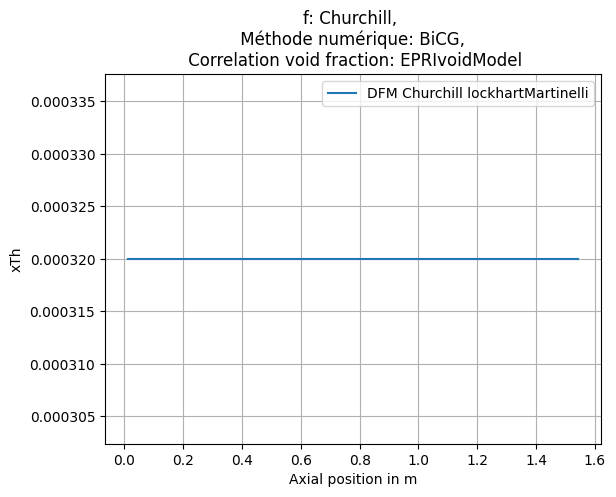

Mean relative error in temperature: 0.15921083530265298, max relative error in temperature 0.2700591697959265 for EPRIvoidModel
Mean relative error in temperature: 0.15921965933486965, max relative error in temperature 0.2700751958542099 for GEramp
Mean relative error in temperature: 0.1592196267148233, max relative error in temperature 0.27007513670085054 for modBestion
Mean relative error in temperature: 0.15921652467464734, max relative error in temperature 0.2700694985364765 for HEM1
[0.15921083530265298, 0.15921965933486965, 0.1592196267148233, 0.15921652467464734]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\1.5GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading fi

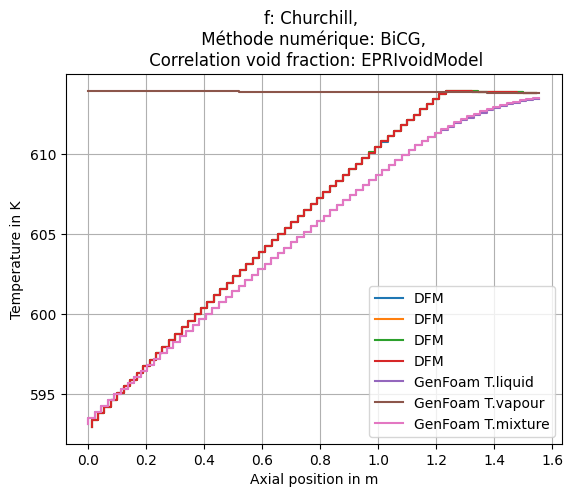

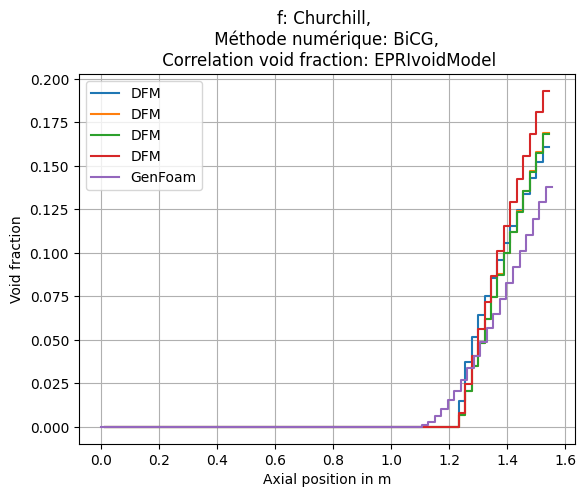

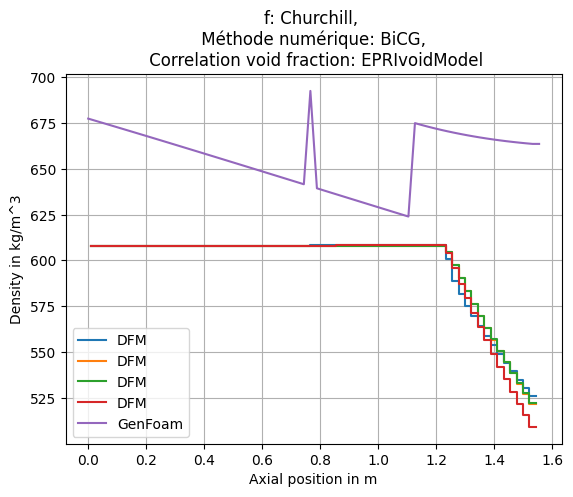

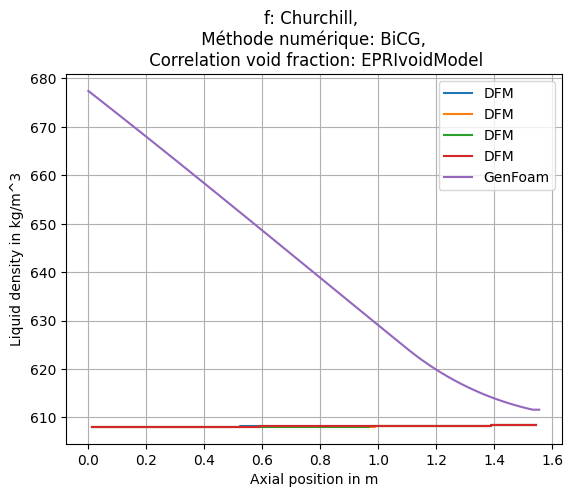

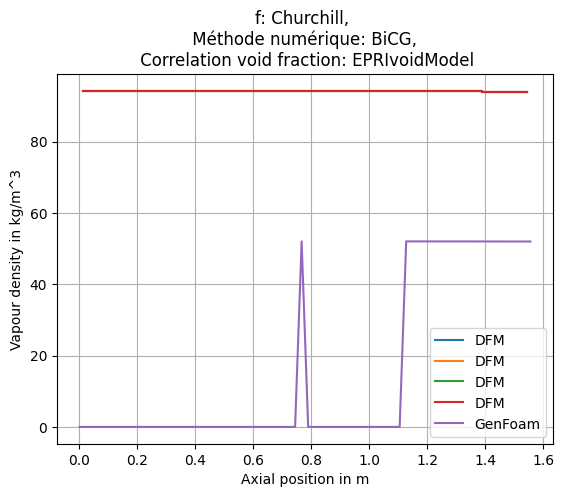

...

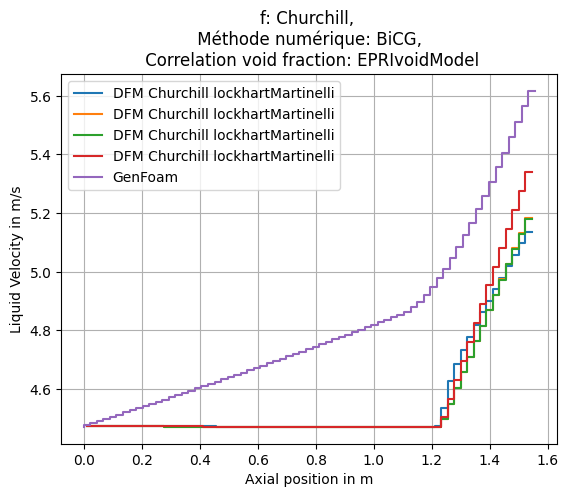

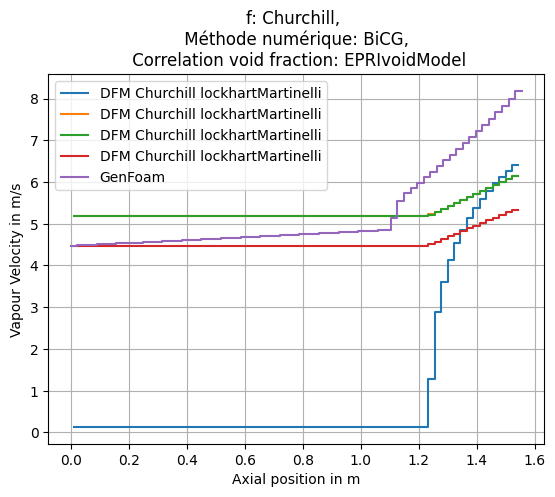

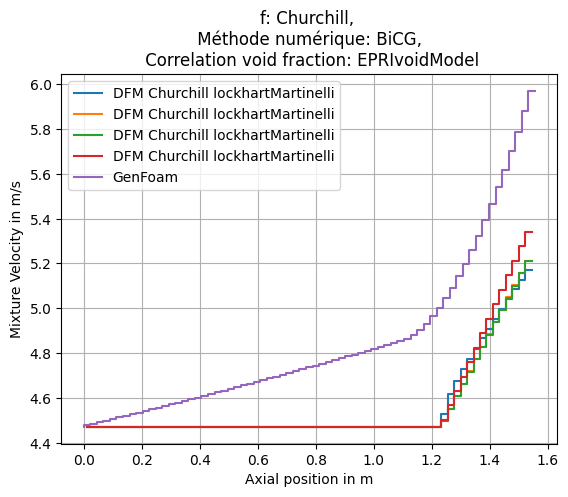

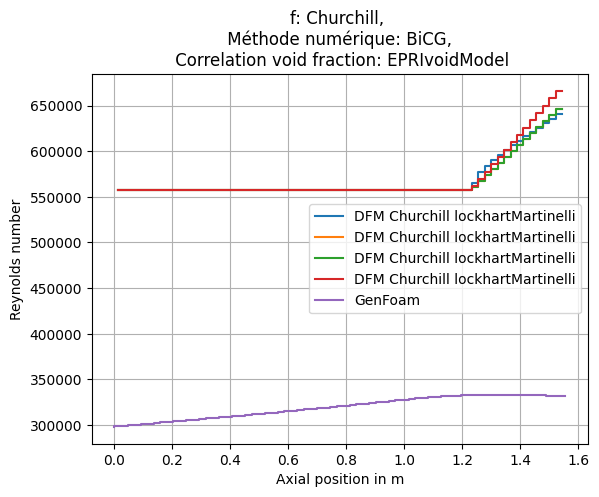

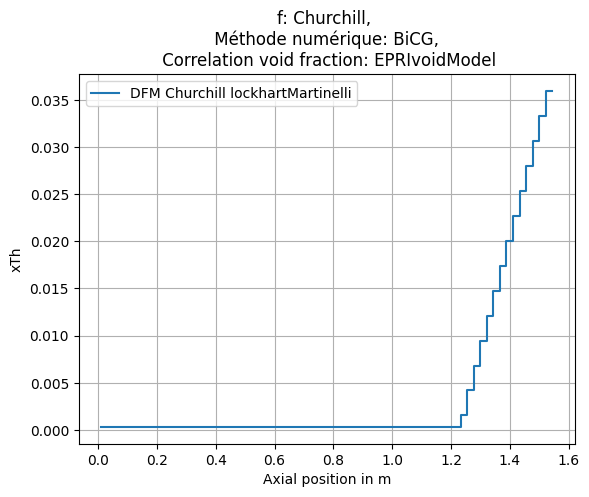

Mean relative error in temperature: 0.17566152976338992, max relative error in temperature 0.35928530405630726 for EPRIvoidModel
Mean relative error in temperature: 0.17593387587421447, max relative error in temperature 0.3596904520910121 for GEramp
Mean relative error in temperature: 0.17593130233320037, max relative error in temperature 0.3596875711627212 for modBestion
Mean relative error in temperature: 0.1756113984721839, max relative error in temperature 0.3593461791312719 for HEM1
[0.17566152976338992, 0.17593387587421447, 0.17593130233320037, 0.1756113984721839]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\2.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading fi

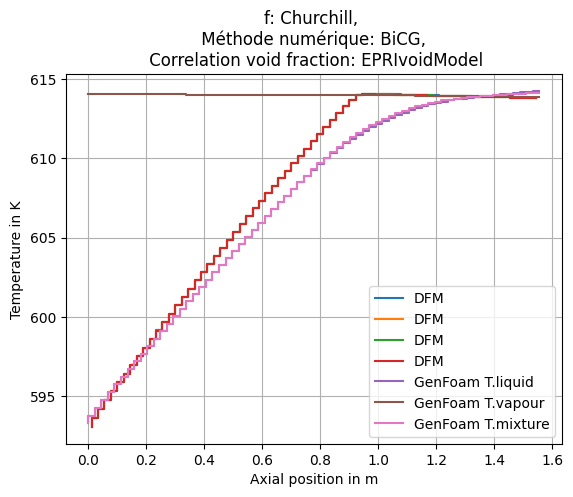

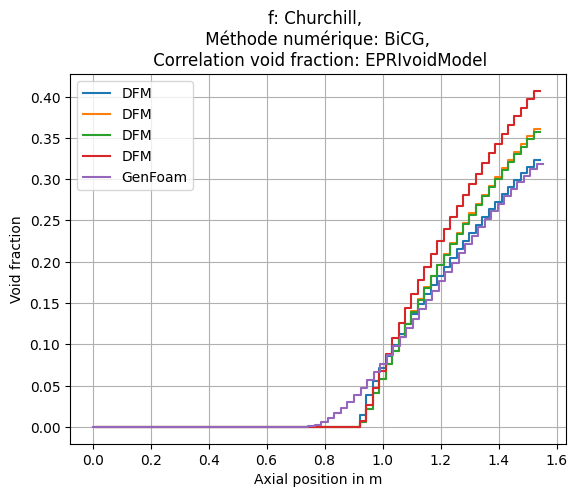

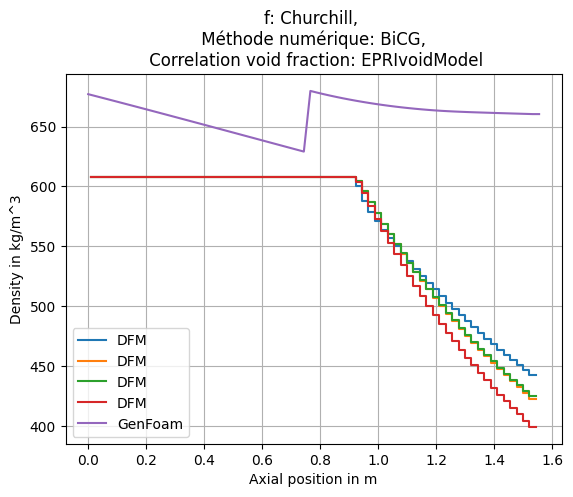

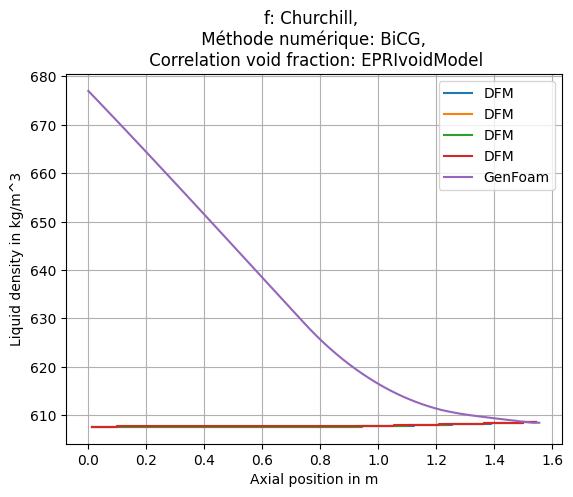

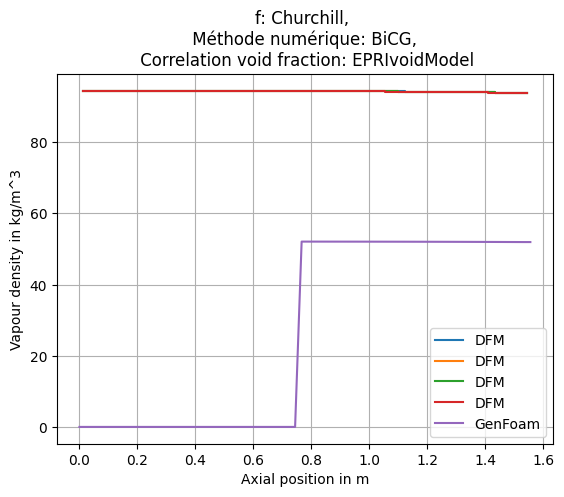

...

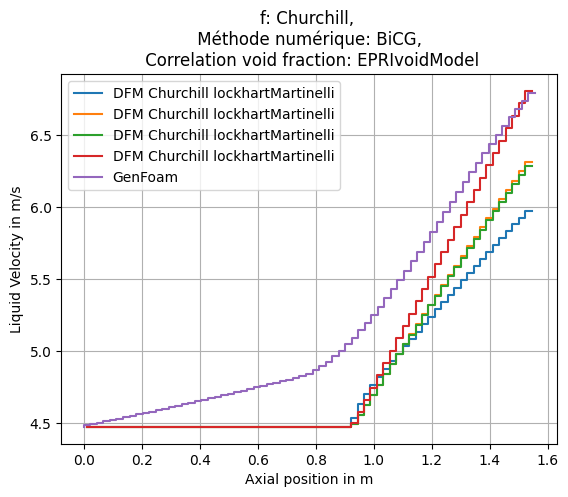

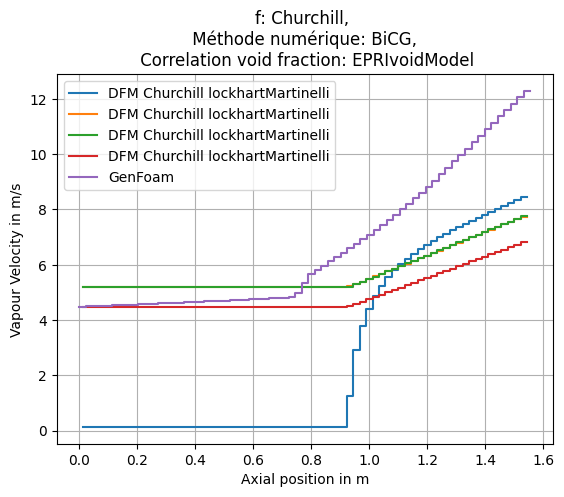

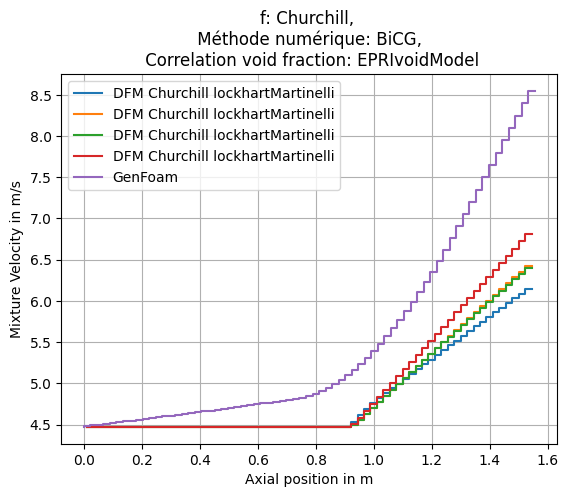

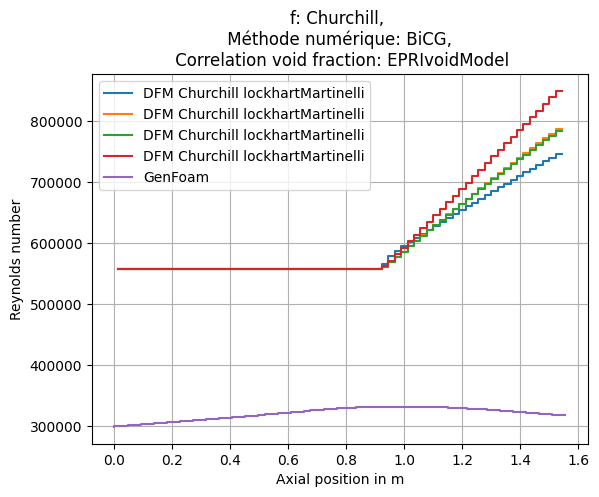

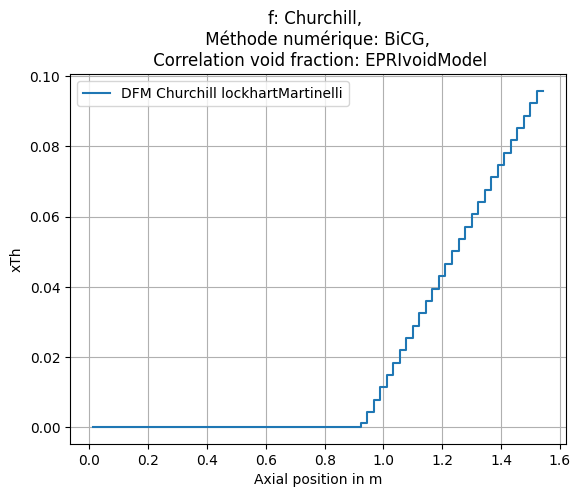

Mean relative error in temperature: 0.14851281734203228, max relative error in temperature 0.39286407544757856 for EPRIvoidModel
Mean relative error in temperature: 0.14829113071207076, max relative error in temperature 0.39305470074105636 for GEramp
Mean relative error in temperature: 0.1482812715865072, max relative error in temperature 0.3930272427845771 for modBestion
Mean relative error in temperature: 0.14743142839073592, max relative error in temperature 0.3907495812322982 for HEM1
[0.14851281734203228, 0.14829113071207076, 0.1482812715865072, 0.14743142839073592]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\2.5GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading f

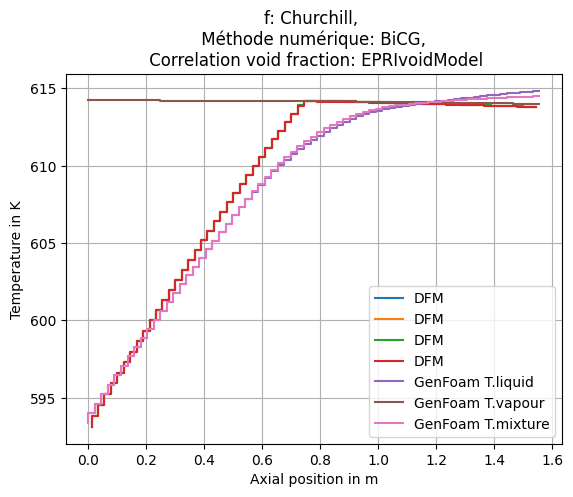

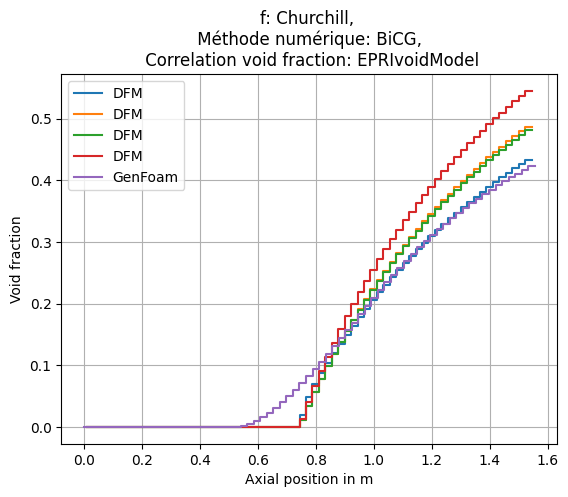

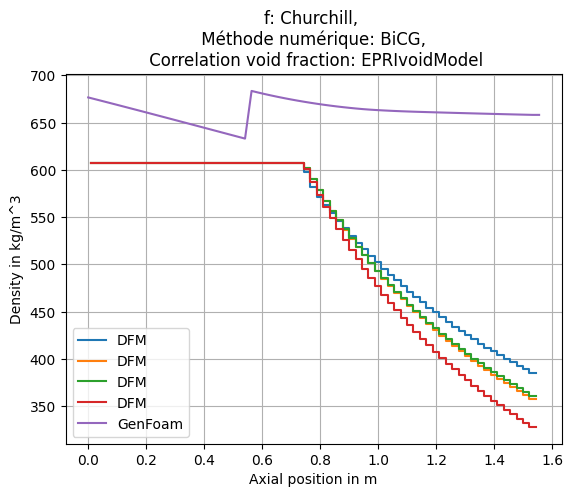

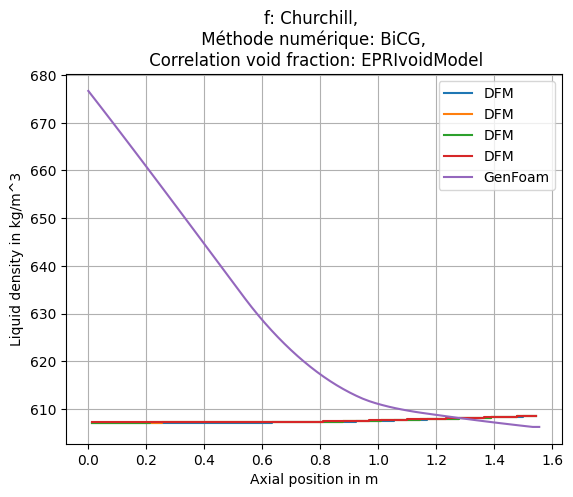

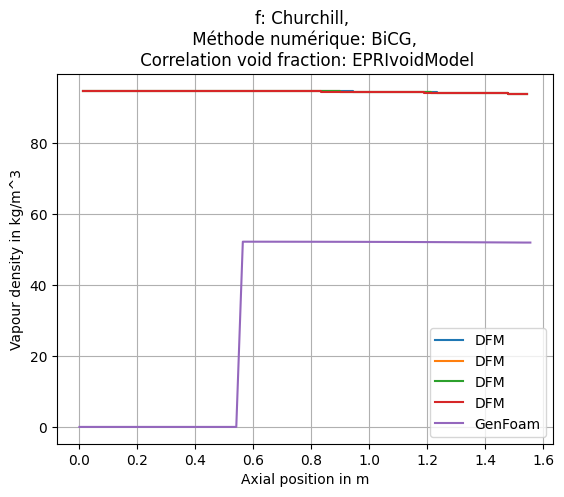

...

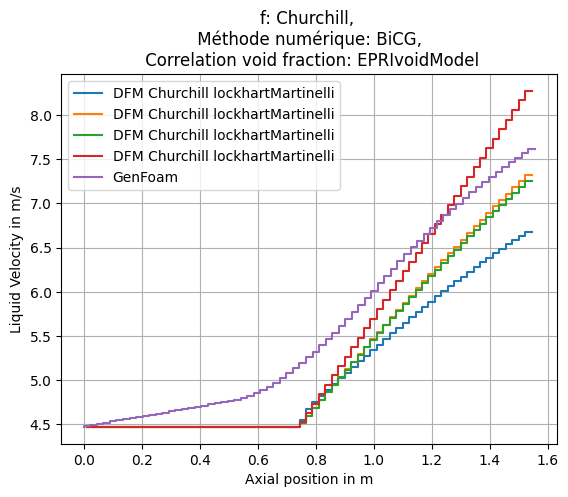

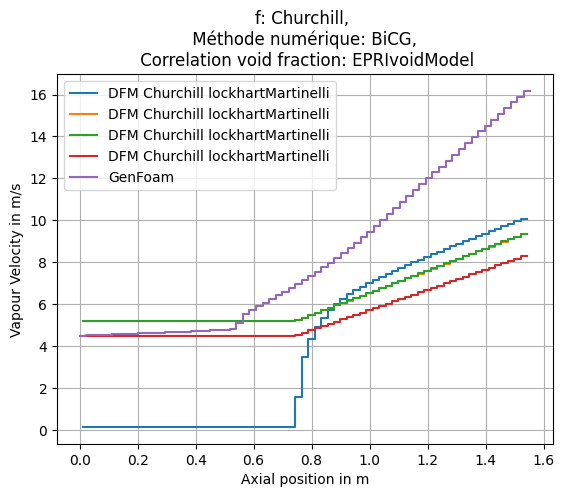

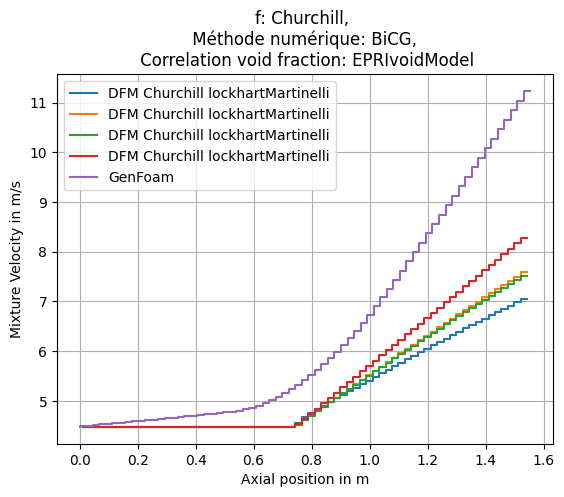

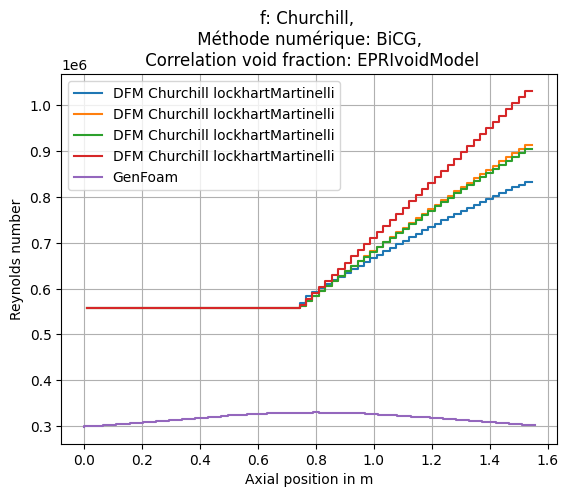

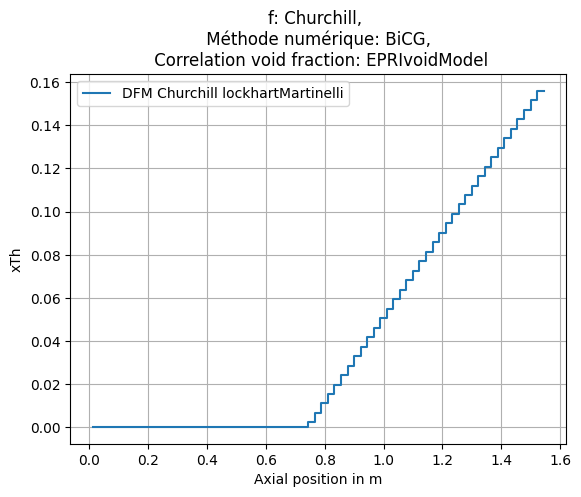

Mean relative error in temperature: 0.14153415885972914, max relative error in temperature 0.4322897410053783 for EPRIvoidModel
Mean relative error in temperature: 0.14114590083673292, max relative error in temperature 0.4319679122196945 for GEramp
Mean relative error in temperature: 0.14112938339721853, max relative error in temperature 0.4319475504175634 for modBestion
Mean relative error in temperature: 0.1403145224990183, max relative error in temperature 0.43091442799440965 for HEM1
[0.14153415885972914, 0.14114590083673292, 0.14112938339721853, 0.1403145224990183]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\3.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading fi

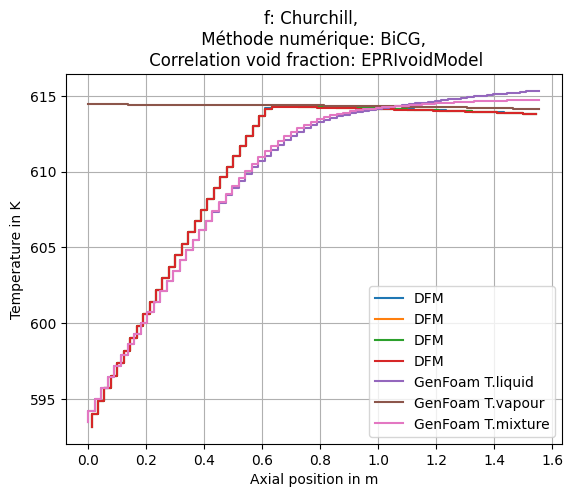

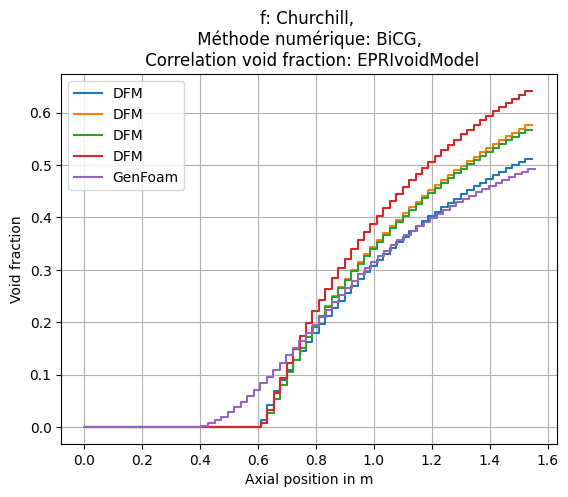

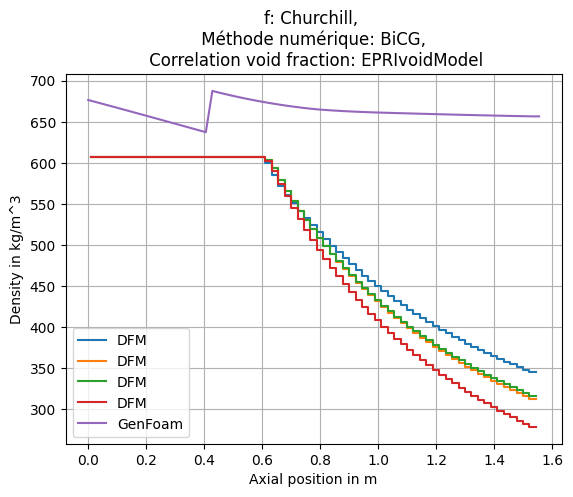

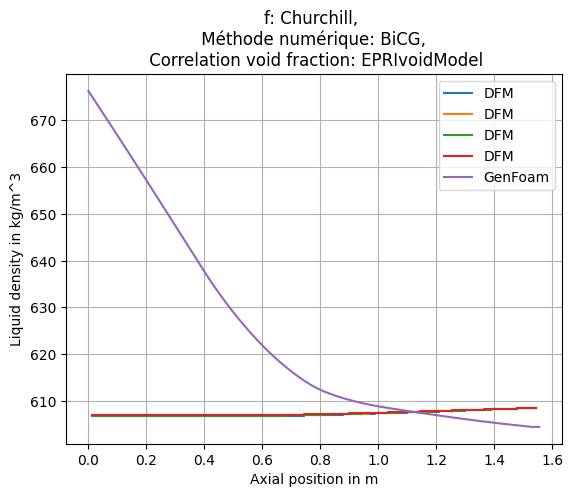

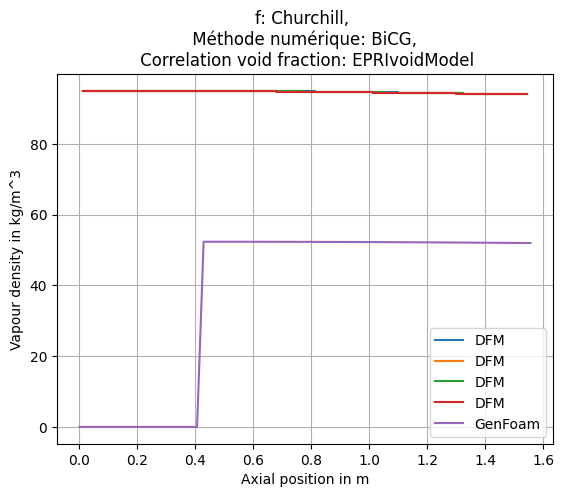

...

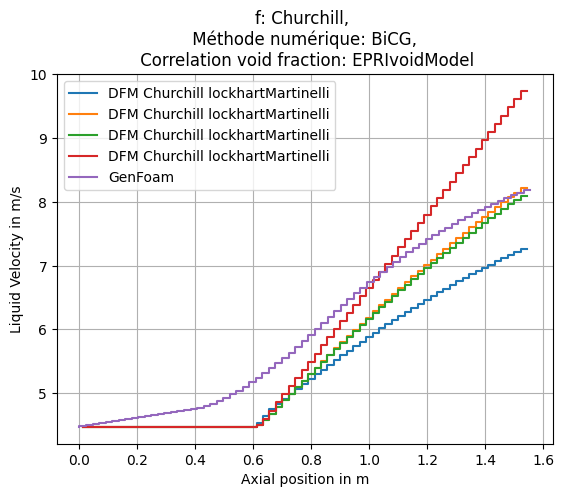

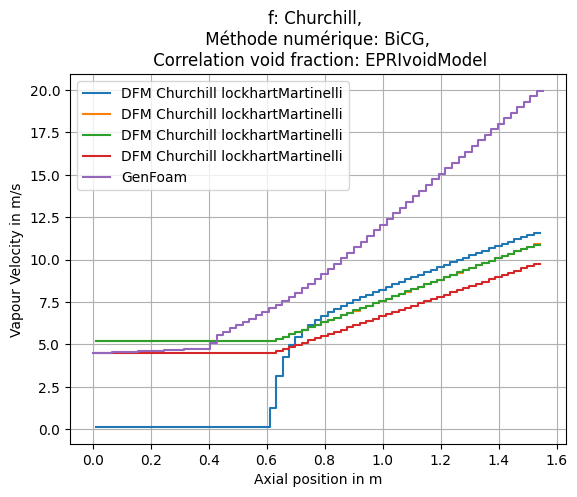

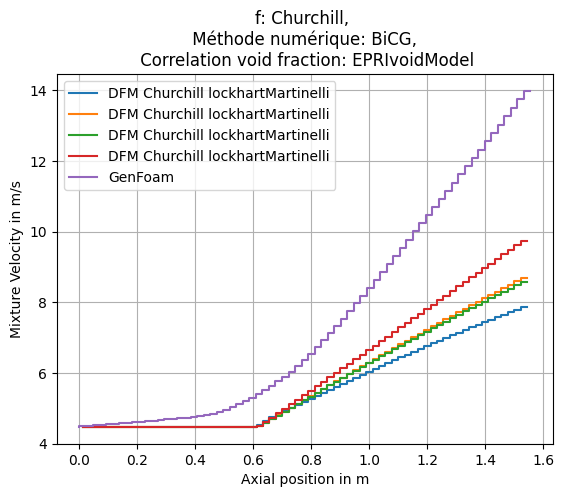

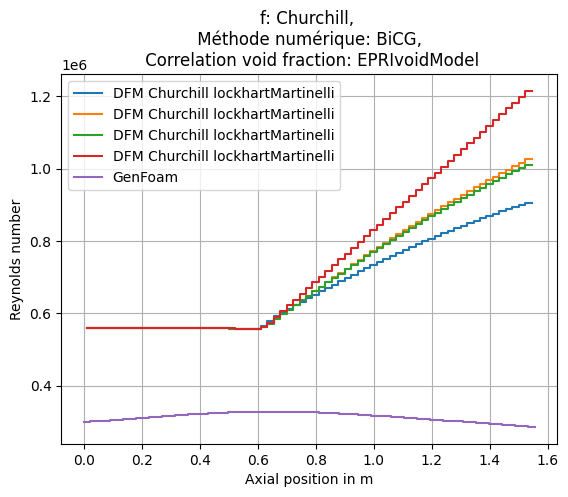

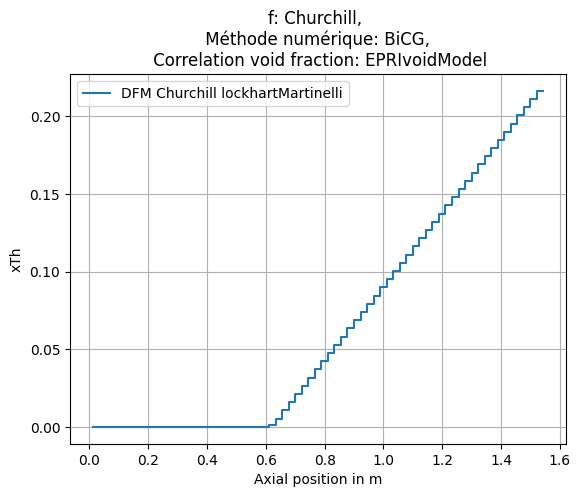

Mean relative error in temperature: 0.14364954868661722, max relative error in temperature 0.46225639873763563 for EPRIvoidModel
Mean relative error in temperature: 0.14334567327483866, max relative error in temperature 0.4608851395993868 for GEramp
Mean relative error in temperature: 0.1433238706989989, max relative error in temperature 0.46073716520602537 for modBestion
Mean relative error in temperature: 0.14272257271466557, max relative error in temperature 0.4568065334140141 for HEM1
[0.14364954868661722, 0.14334567327483866, 0.1433238706989989, 0.14272257271466557]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\3.5GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading f

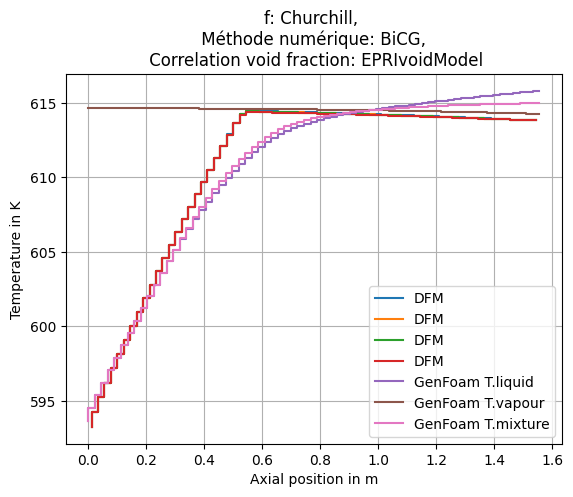

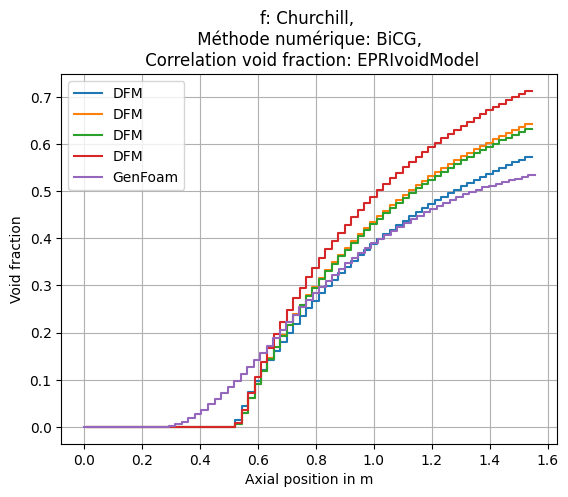

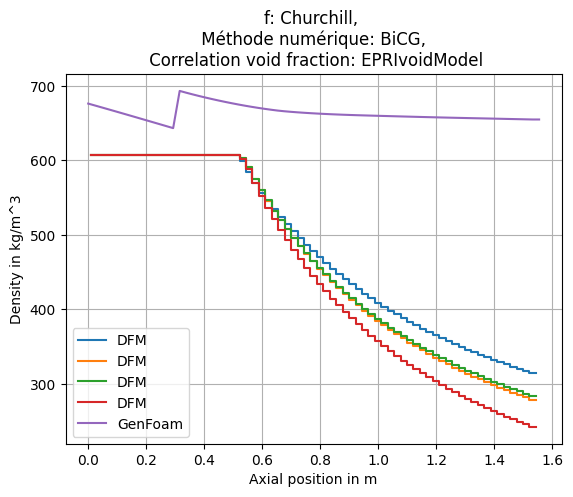

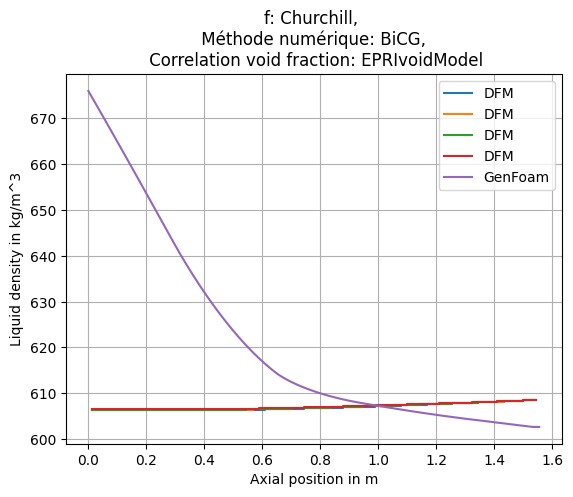

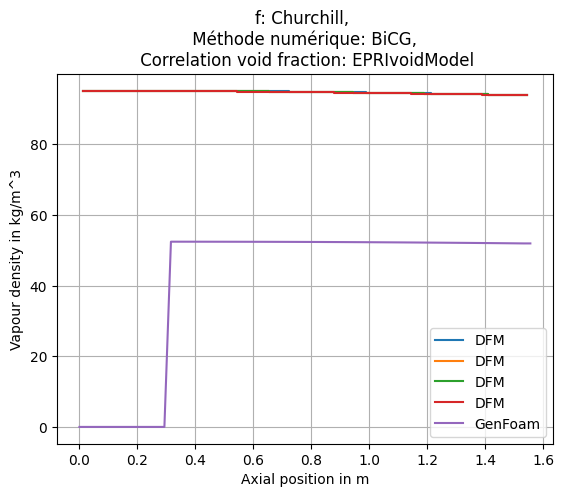

...

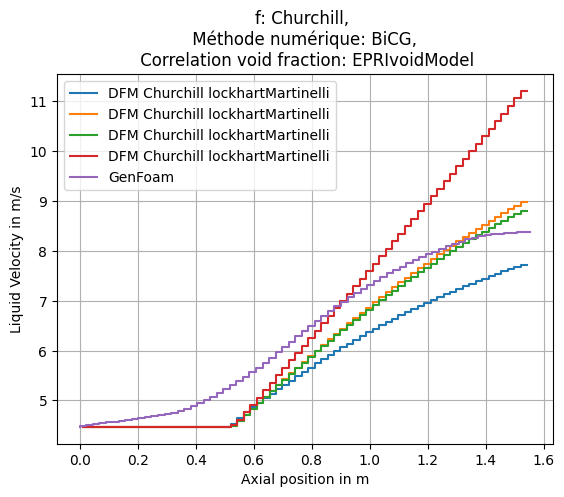

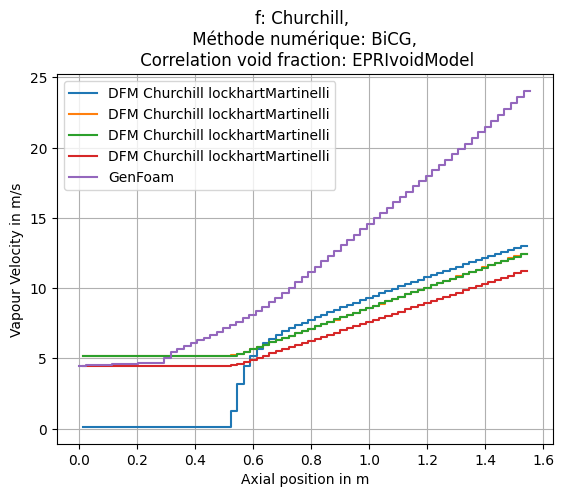

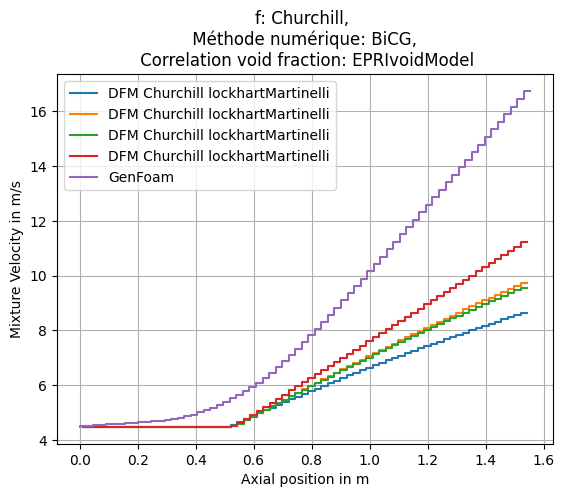

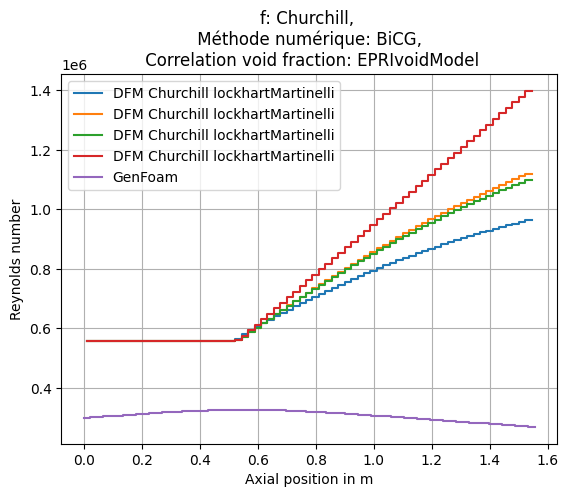

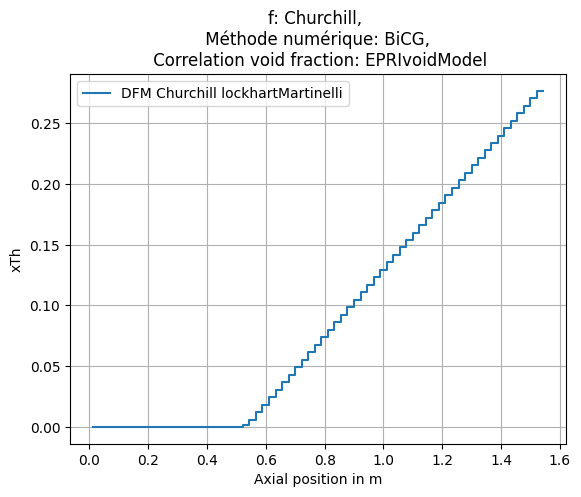

Mean relative error in temperature: 0.15121808862872682, max relative error in temperature 0.49015988297243557 for EPRIvoidModel
Mean relative error in temperature: 0.1510823718022356, max relative error in temperature 0.4883716687607175 for GEramp
Mean relative error in temperature: 0.1510752799354373, max relative error in temperature 0.4881164968306304 for modBestion
Mean relative error in temperature: 0.15091956543106896, max relative error in temperature 0.48344163344761654 for HEM1
[0.15121808862872682, 0.1510823718022356, 0.1510752799354373, 0.15091956543106896]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\4.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading fil

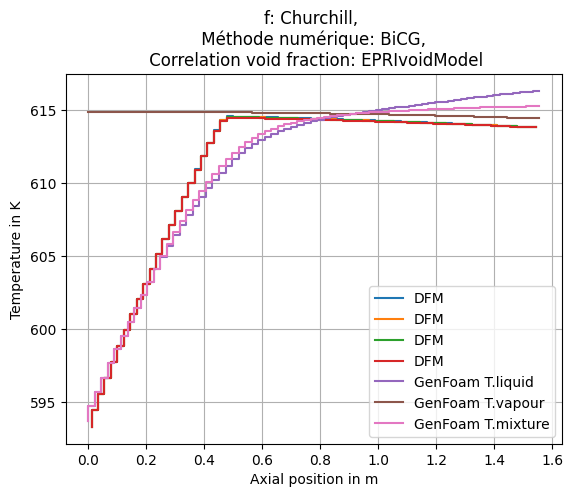

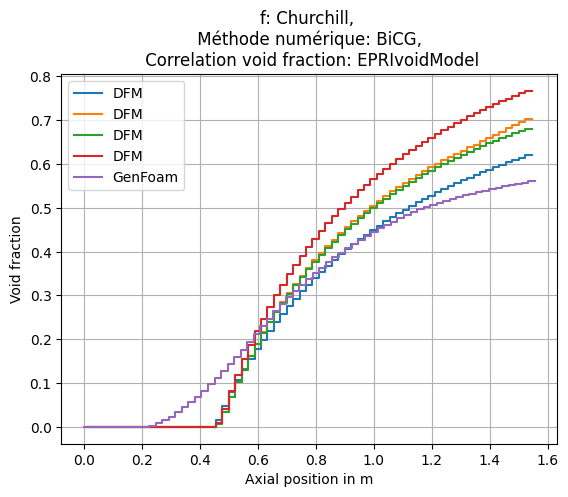

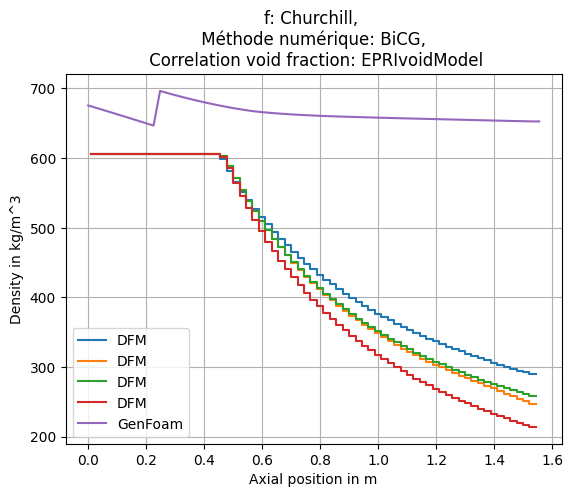

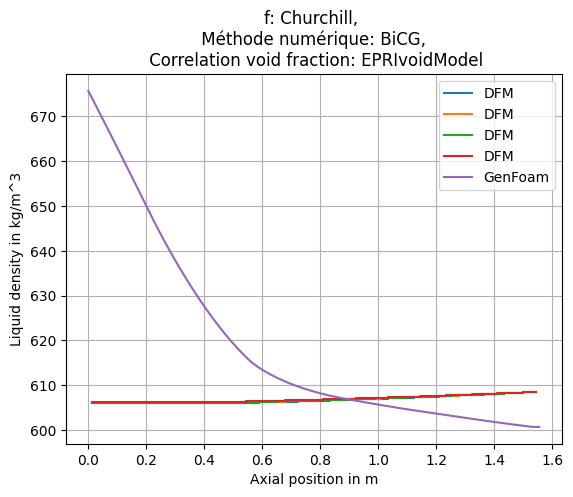

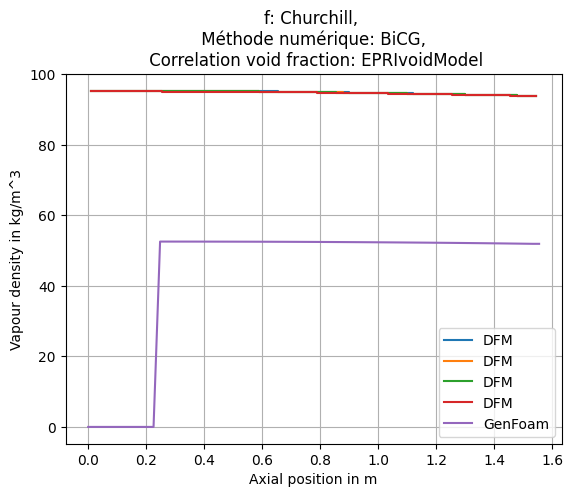

...

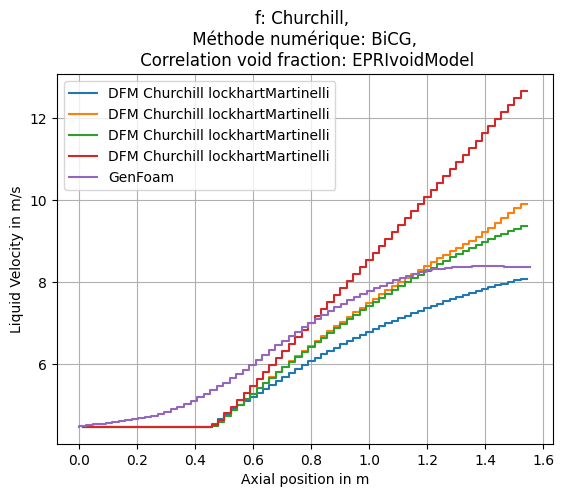

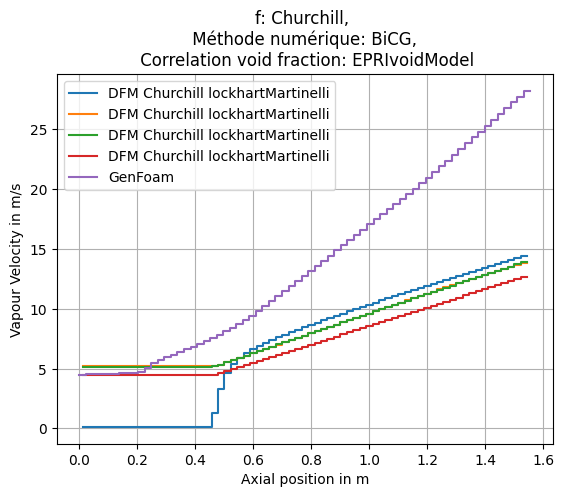

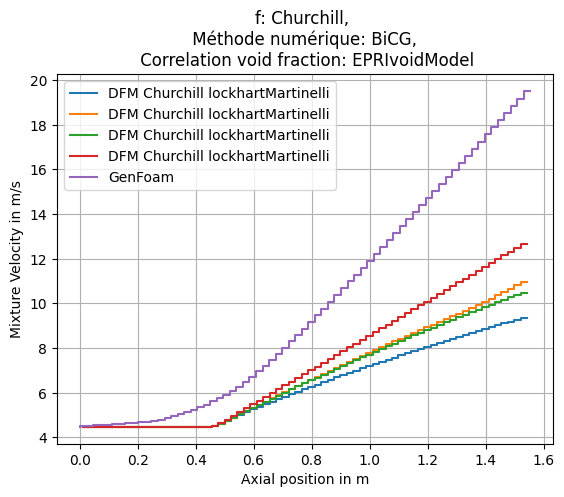

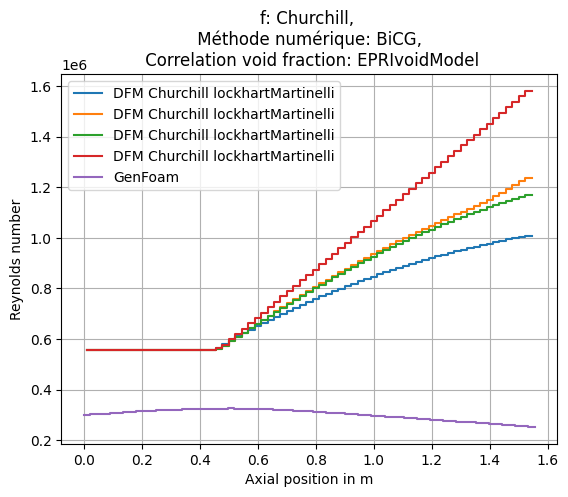

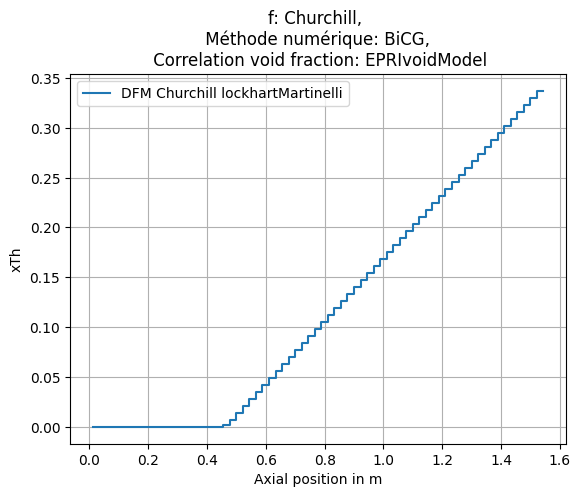

Mean relative error in temperature: 0.16402367623022387, max relative error in temperature 0.5125656448089284 for EPRIvoidModel
Mean relative error in temperature: 0.16409837289747892, max relative error in temperature 0.5107593446707128 for GEramp
Mean relative error in temperature: 0.164230911380914, max relative error in temperature 0.5101204886844428 for modBestion
Mean relative error in temperature: 0.1646364919988971, max relative error in temperature 0.5046311677315082 for HEM1
[0.16402367623022387, 0.16409837289747892, 0.164230911380914, 0.1646364919988971]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\4.5GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: a

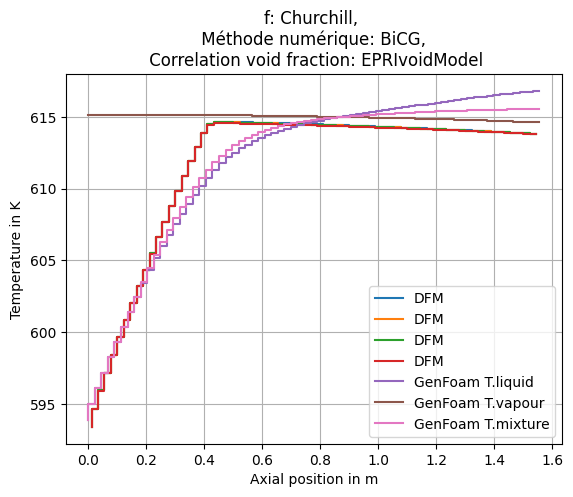

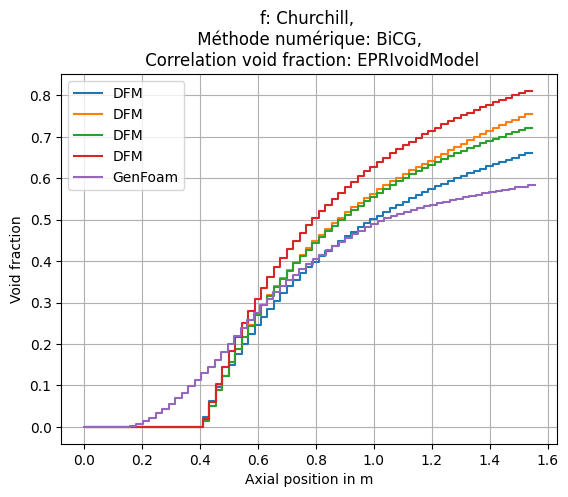

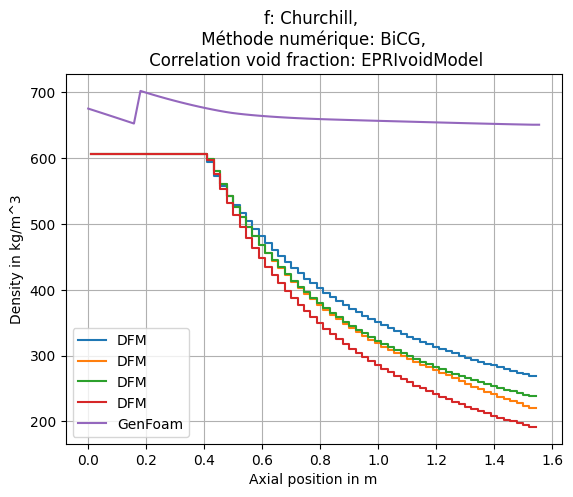

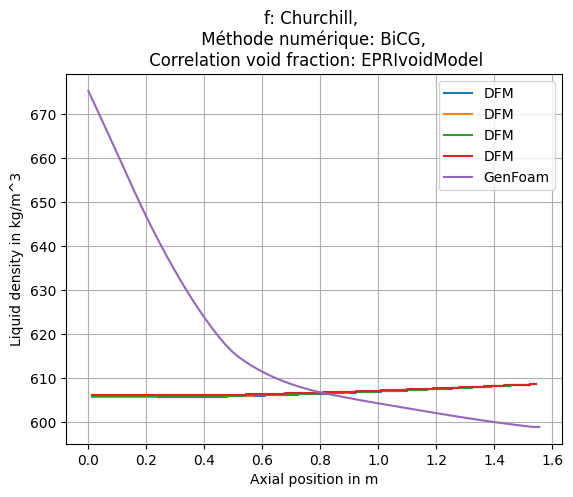

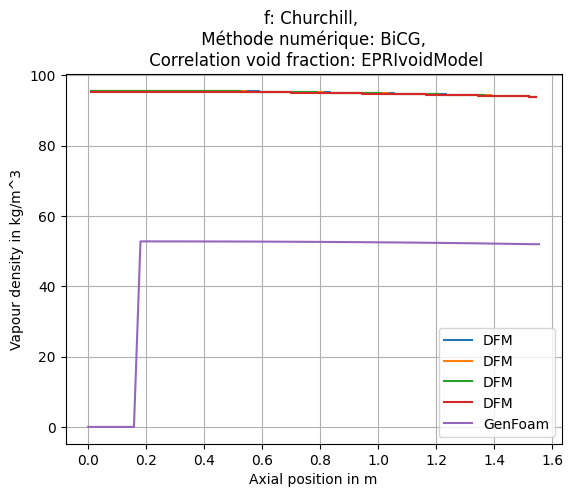

...

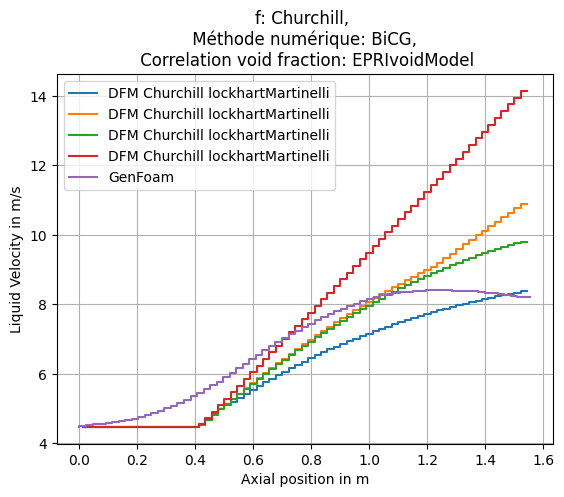

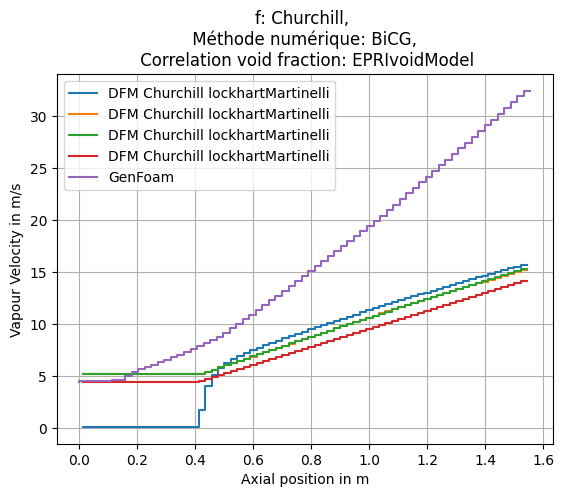

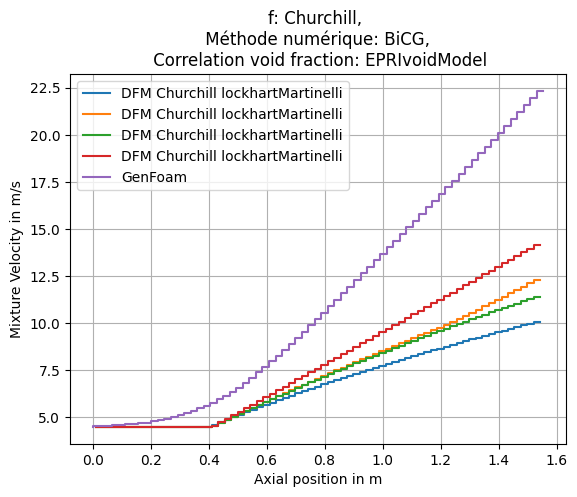

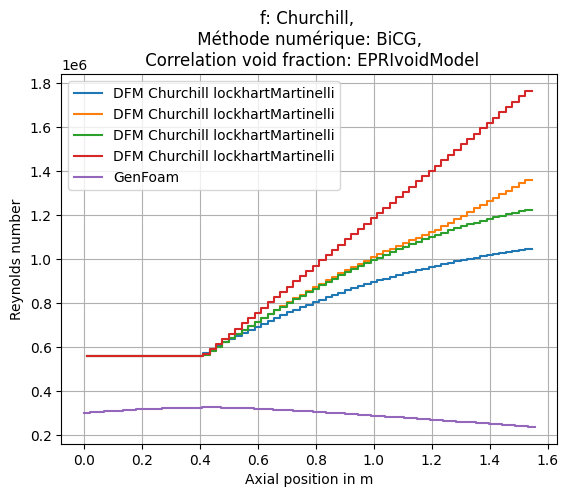

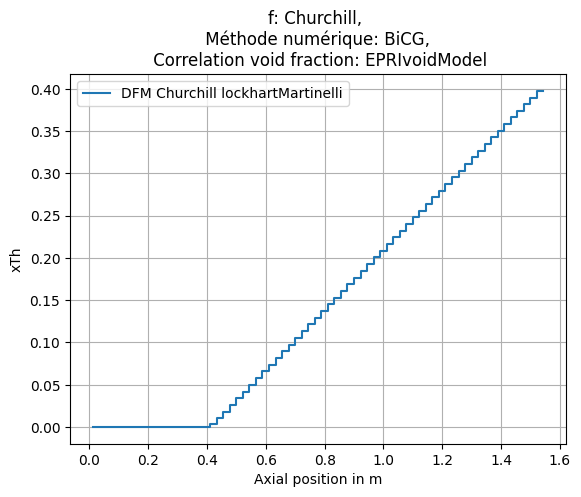

Mean relative error in temperature: 0.1814029558393395, max relative error in temperature 0.5261272146970828 for EPRIvoidModel
Mean relative error in temperature: 0.18165251330247476, max relative error in temperature 0.5241180622807592 for GEramp
Mean relative error in temperature: 0.18186884561815442, max relative error in temperature 0.5232209252592352 for modBestion
Mean relative error in temperature: 0.18312630697045726, max relative error in temperature 0.5167685137773501 for HEM1
[0.1814029558393395, 0.18165251330247476, 0.18186884561815442, 0.18312630697045726]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\5.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading fil

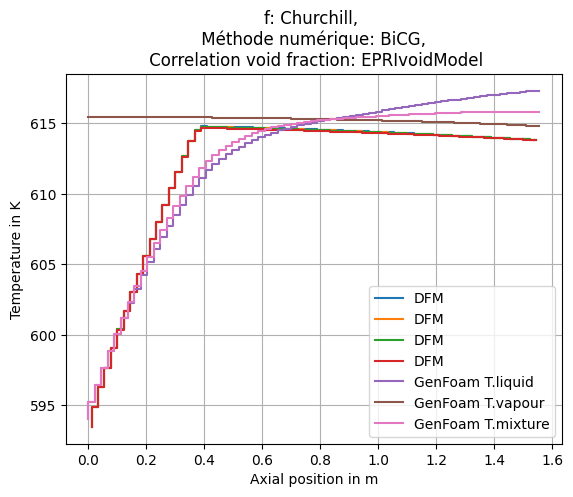

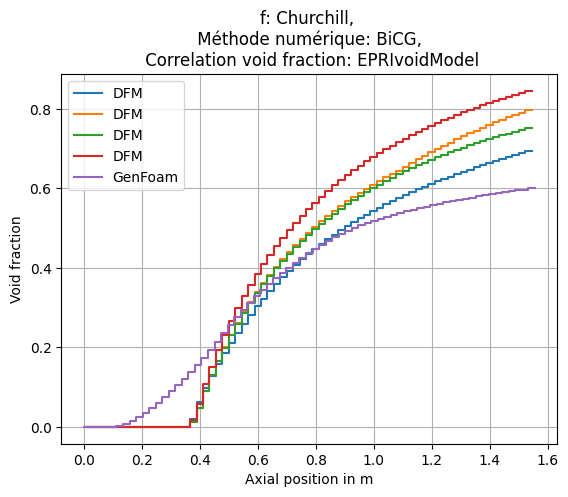

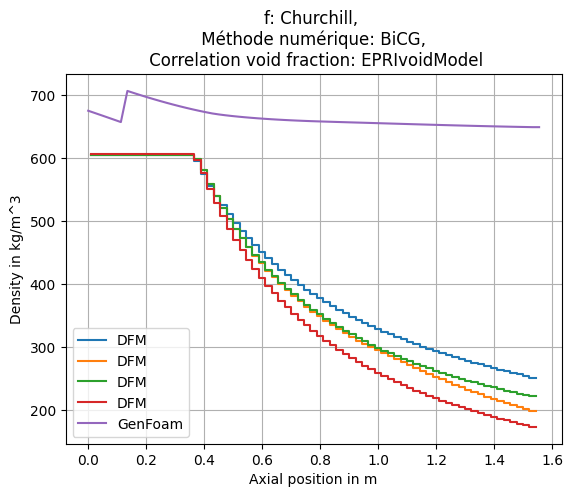

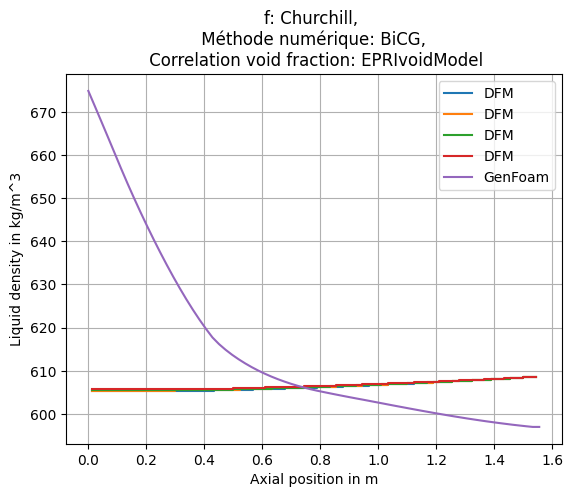

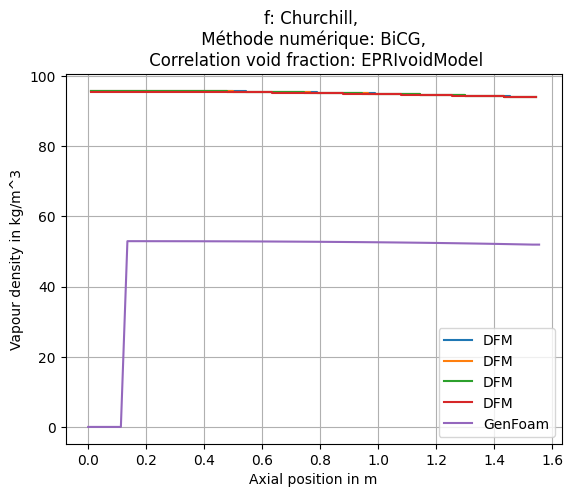

...

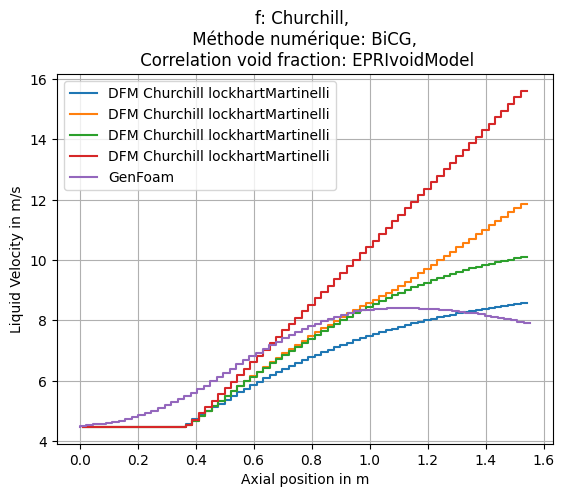

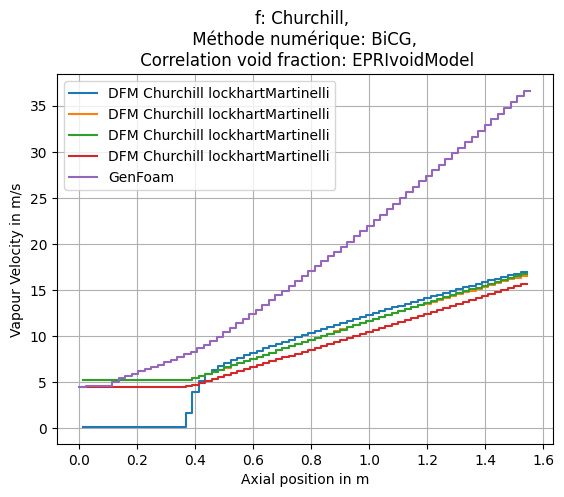

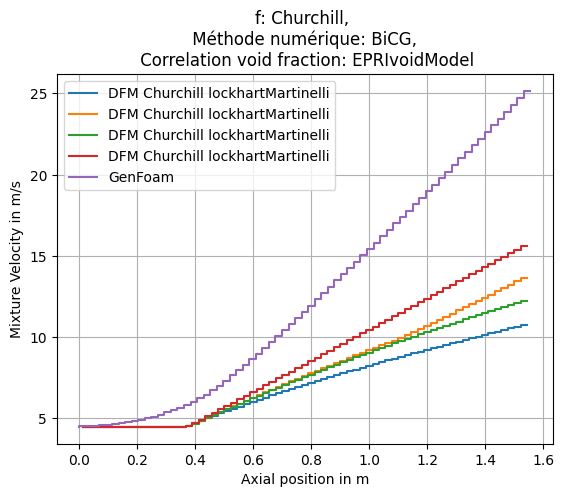

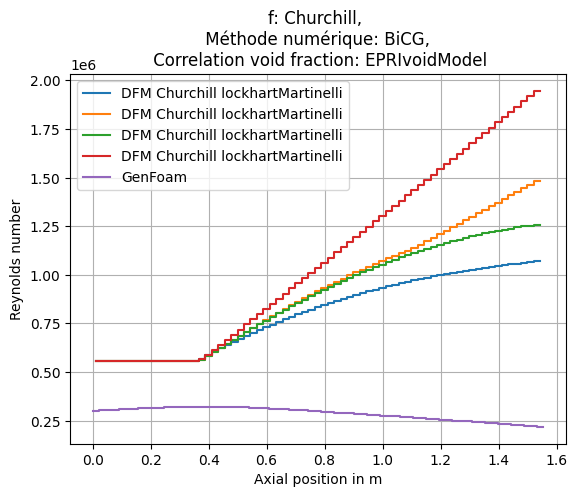

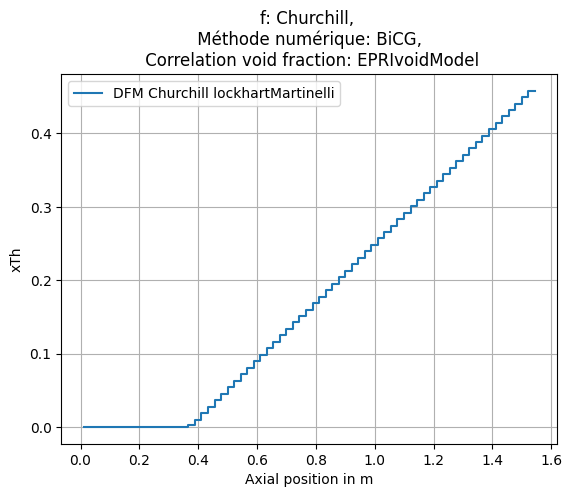

Mean relative error in temperature: 0.2020479243943323, max relative error in temperature 0.5417430661453649 for EPRIvoidModel
Mean relative error in temperature: 0.2025756490811157, max relative error in temperature 0.5397296272348396 for GEramp
Mean relative error in temperature: 0.20281656136097714, max relative error in temperature 0.5386511324890569 for modBestion
Mean relative error in temperature: 0.20509499289003733, max relative error in temperature 0.5310781633949362 for HEM1
[0.2020479243943323, 0.2025756490811157, 0.20281656136097714, 0.20509499289003733]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\1.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file:

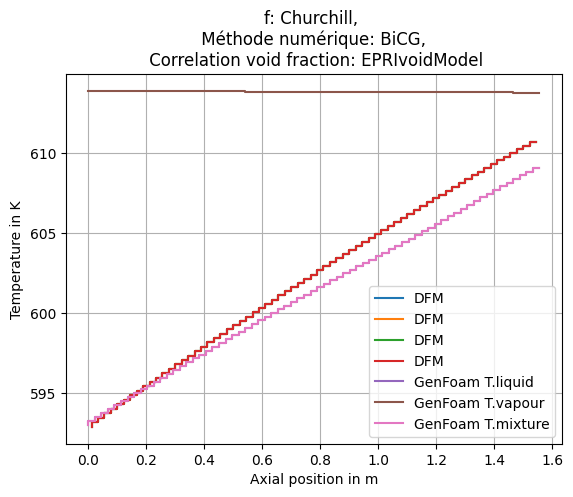

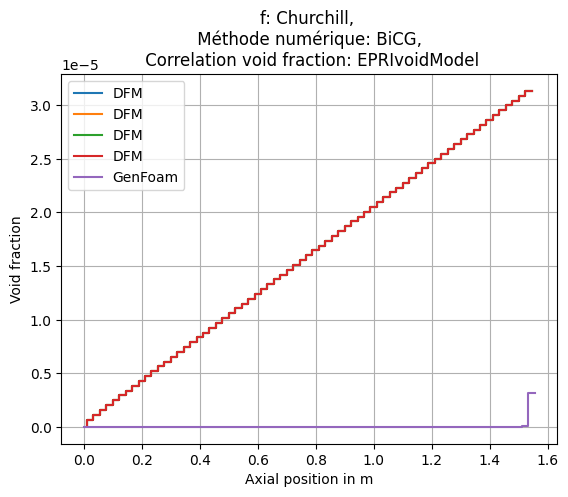

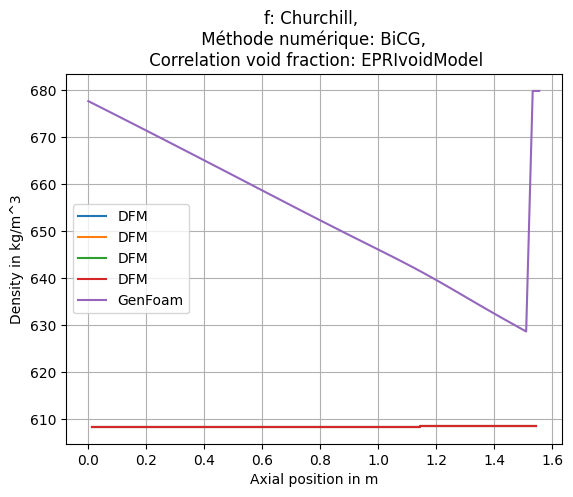

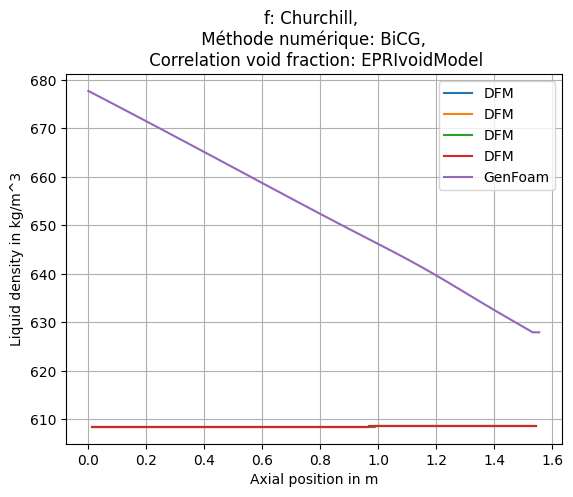

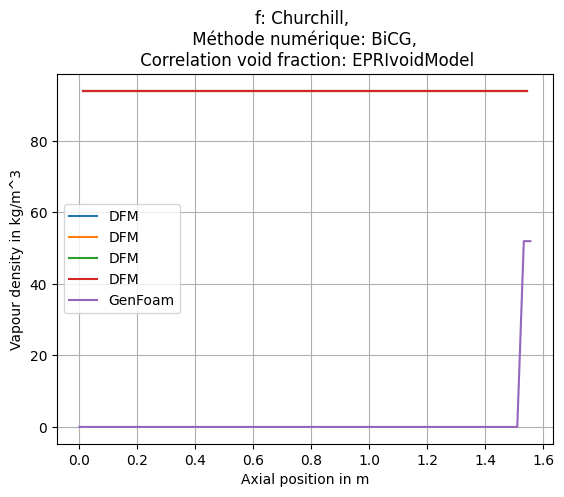

...

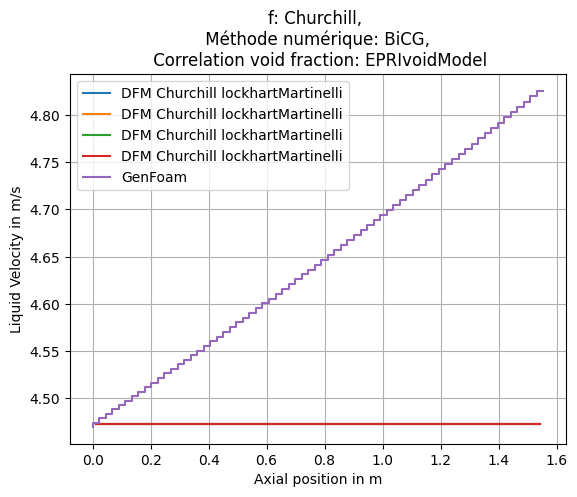

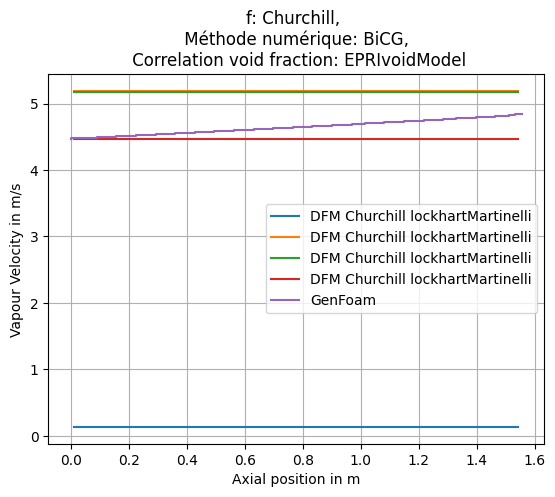

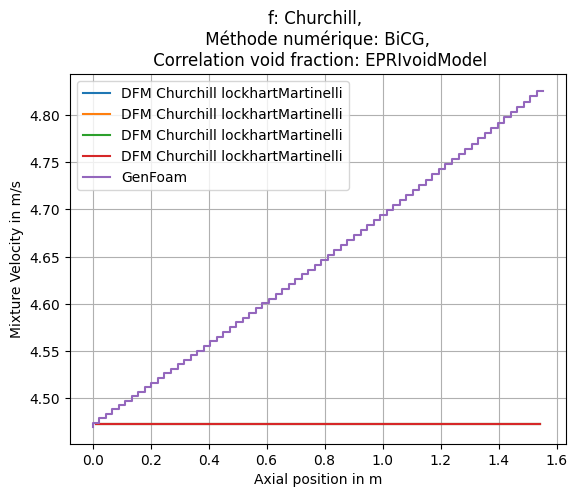

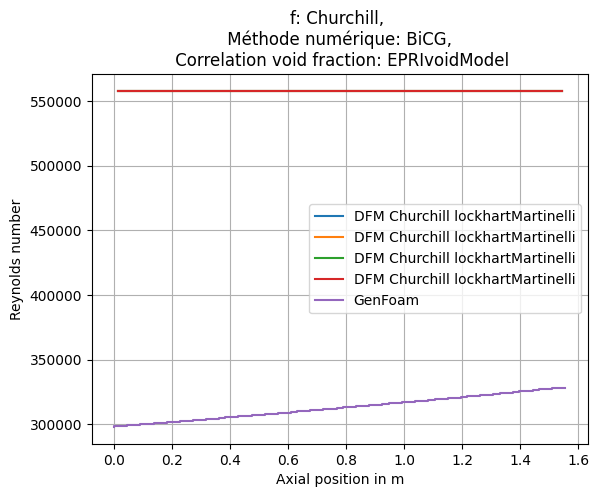

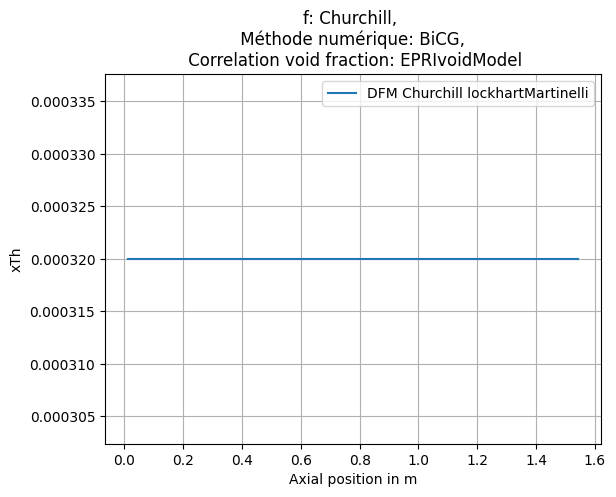

Mean absolute error in void fraction: 0.001572890925790974, max absolute error in temperature 0.0030831662606666545 for EPRIvoidModel
Mean absolute error in void fraction: 0.001572890925790974, max absolute error in temperature 0.0030831662606666545 for GEramp
Mean absolute error in void fraction: 0.001572890925790974, max absolute error in temperature 0.0030831662606666545 for modBestion
Mean absolute error in void fraction: 0.001572890925790974, max absolute error in temperature 0.0030831662606666545 for HEM1
[0.001572890925790974, 0.001572890925790974, 0.001572890925790974, 0.001572890925790974]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\1.5GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: a

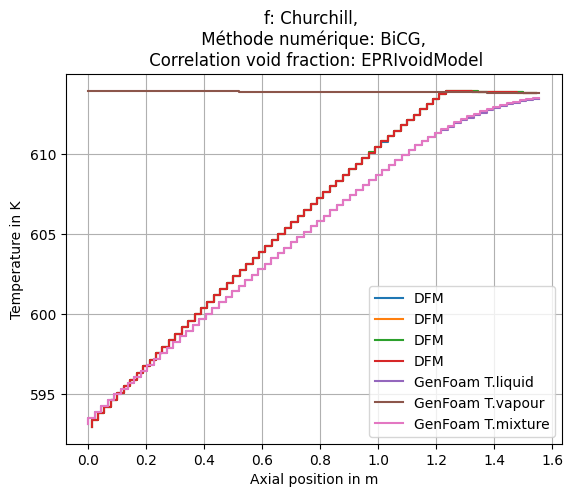

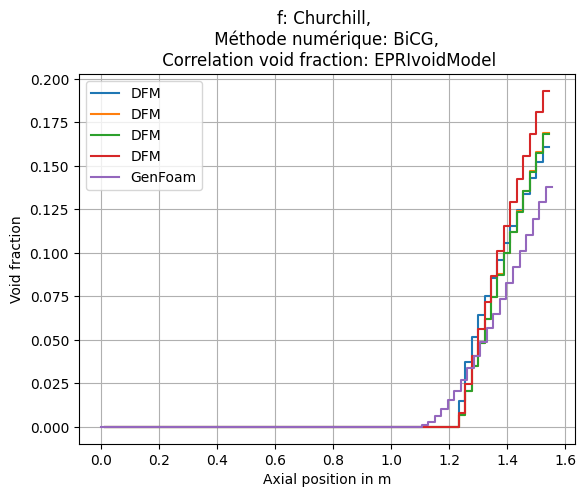

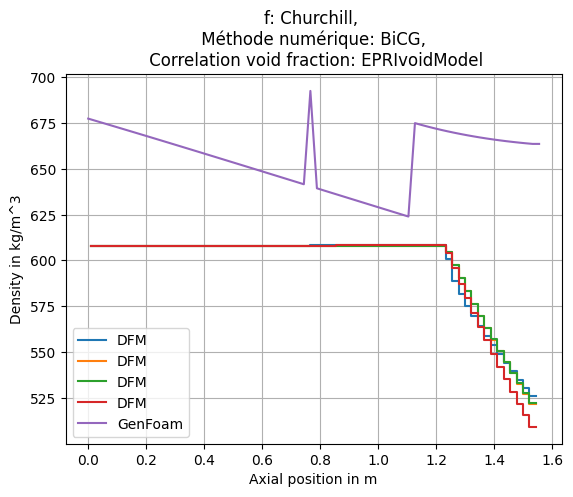

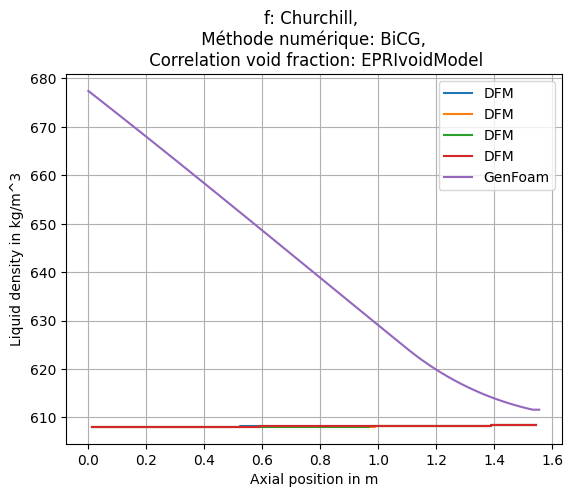

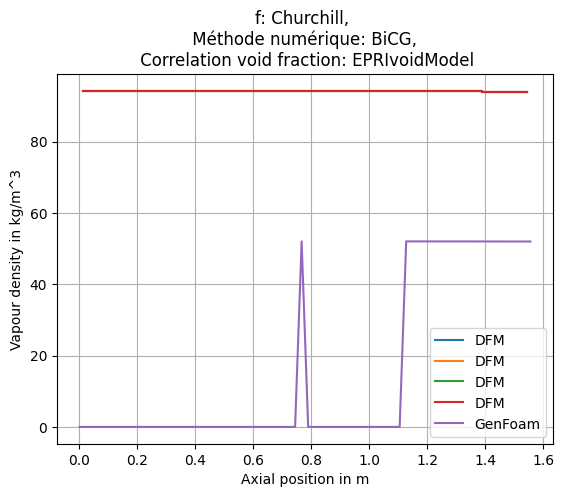

...

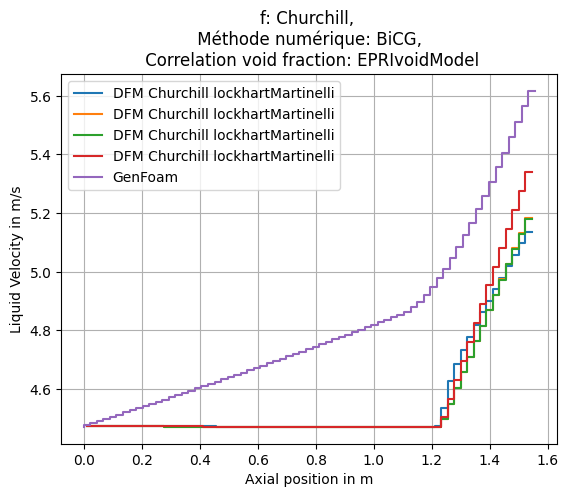

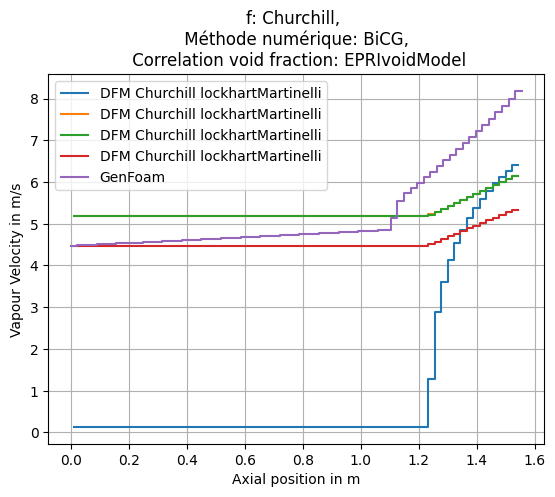

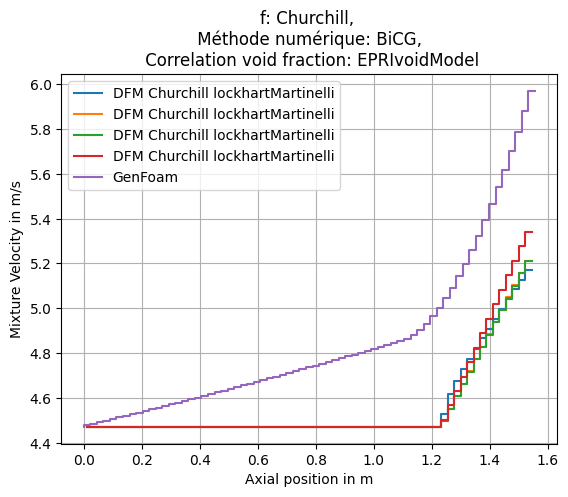

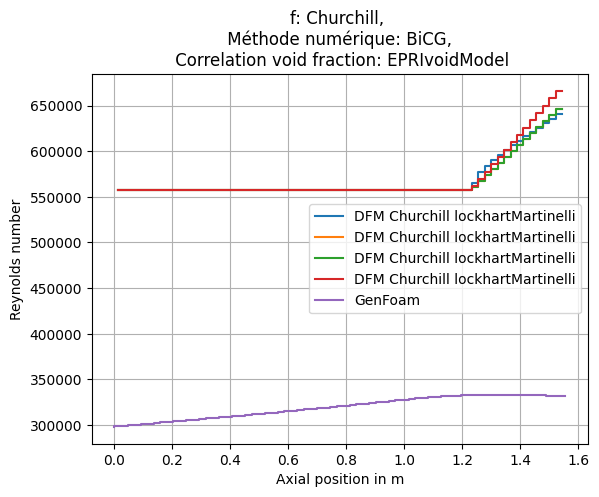

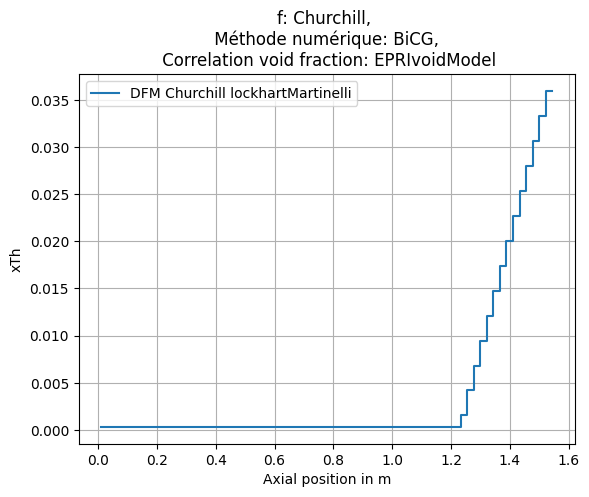

Mean absolute error in void fraction: 0.46414793085453454, max absolute error in temperature 2.389385297040257 for EPRIvoidModel
Mean absolute error in void fraction: 0.42810809679134115, max absolute error in temperature 3.1168425676034146 for GEramp
Mean absolute error in void fraction: 0.42359973970496306, max absolute error in temperature 3.048684986689026 for modBestion
Mean absolute error in void fraction: 0.6715993327798362, max absolute error in temperature 5.535520990379917 for HEM1
[0.46414793085453454, 0.42810809679134115, 0.42359973970496306, 0.6715993327798362]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\2.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Readin

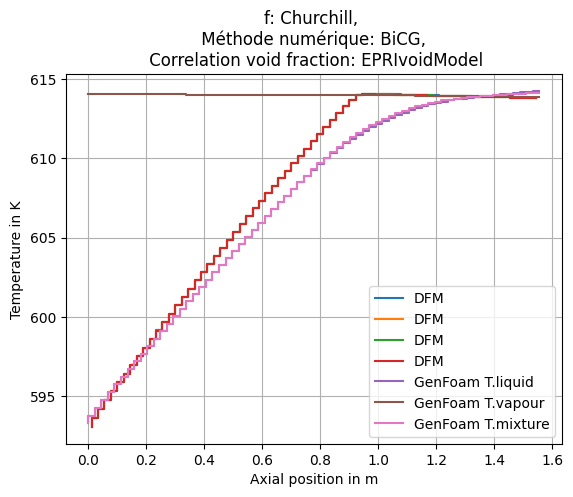

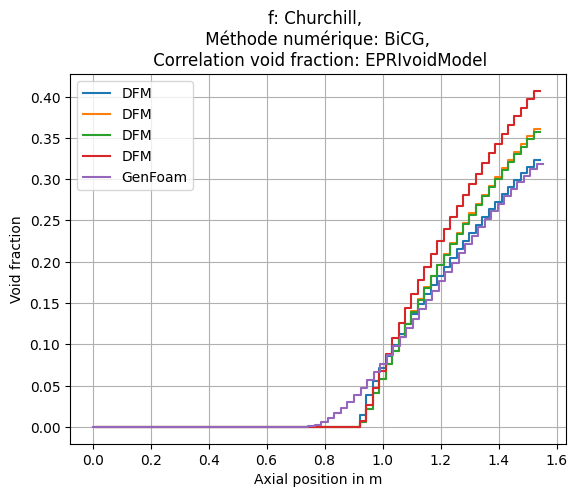

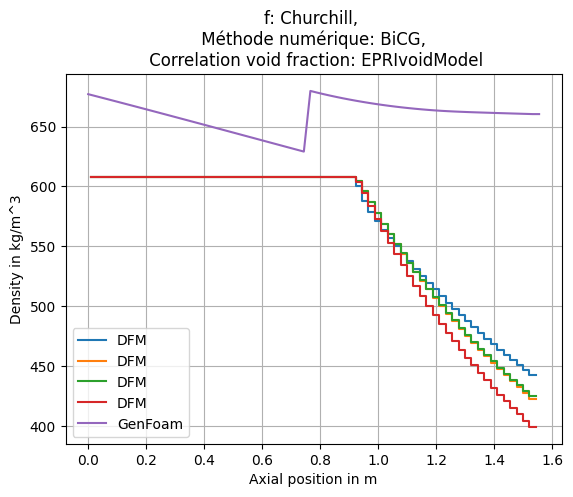

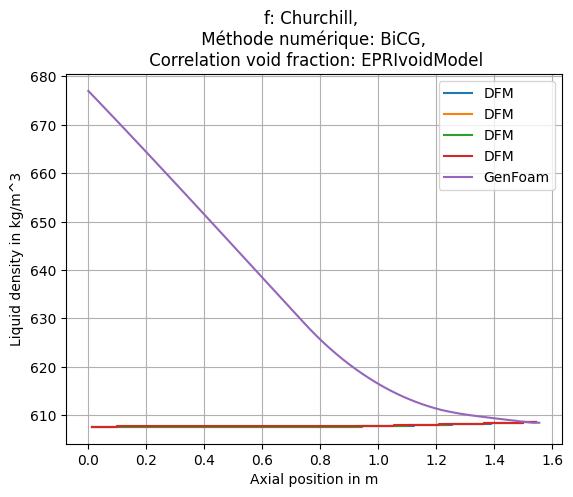

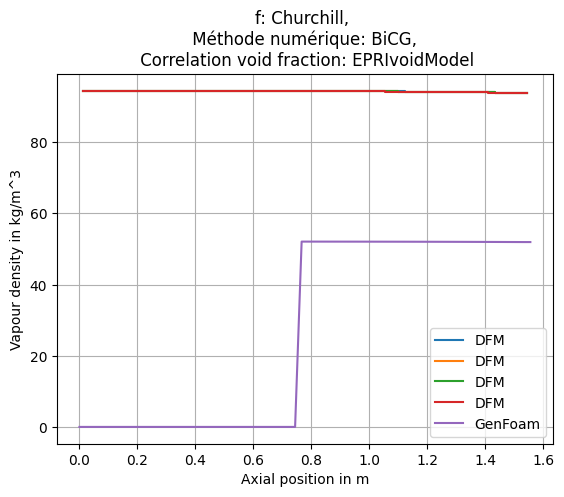

...

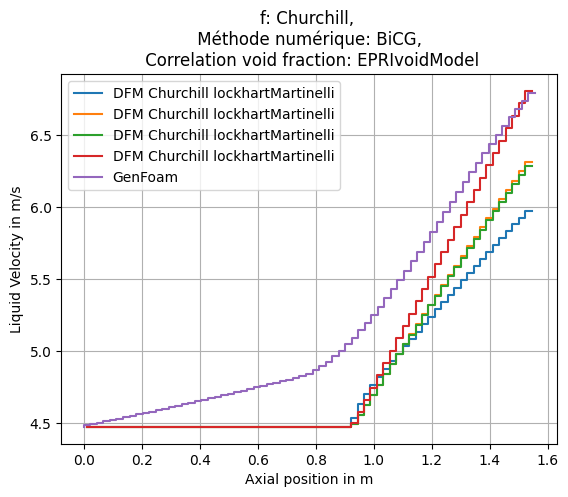

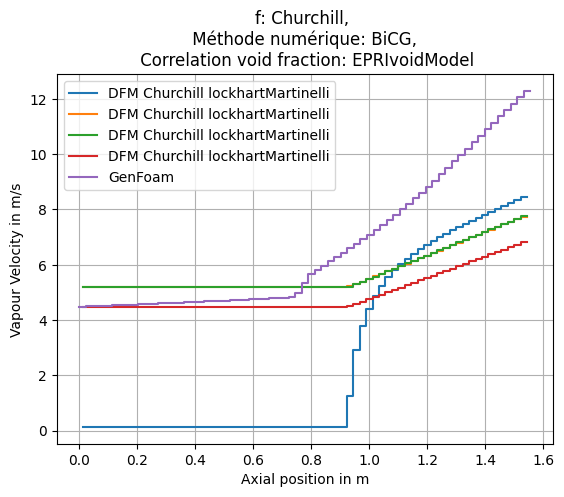

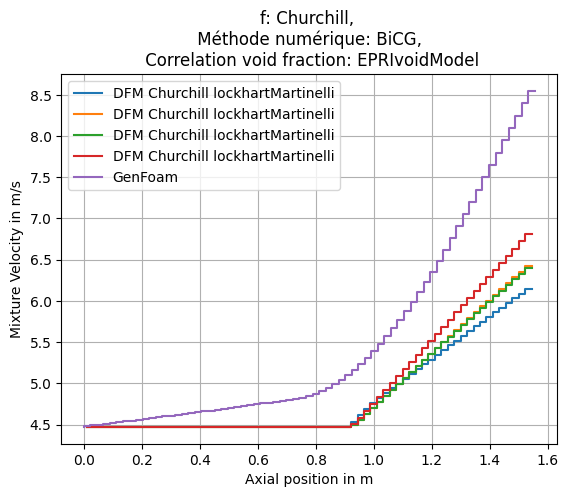

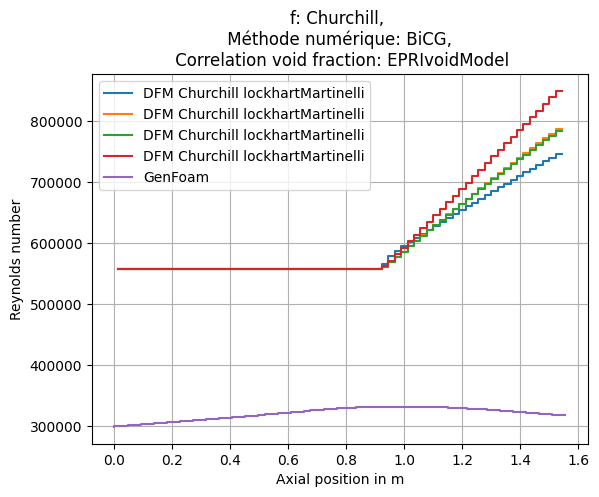

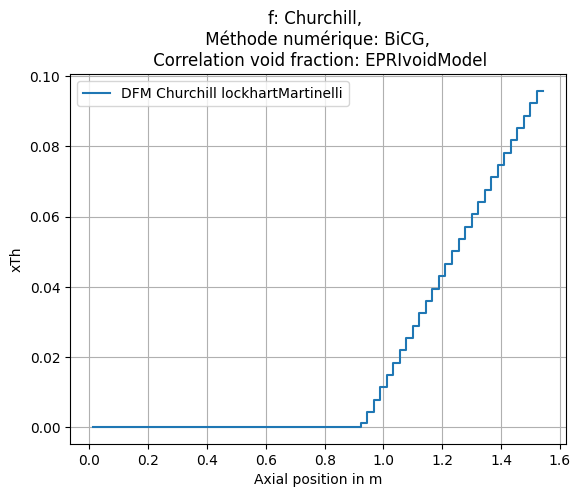

Mean absolute error in void fraction: 0.42035969148210567, max absolute error in temperature 3.889386831689343 for EPRIvoidModel
Mean absolute error in void fraction: 1.1677694839528847, max absolute error in temperature 4.190376387253803 for GEramp
Mean absolute error in void fraction: 1.1152560240792602, max absolute error in temperature 4.133359836012856 for modBestion
Mean absolute error in void fraction: 2.177536778796578, max absolute error in temperature 8.789801013593134 for HEM1
[0.42035969148210567, 1.1677694839528847, 1.1152560240792602, 2.177536778796578]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\2.5GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file:

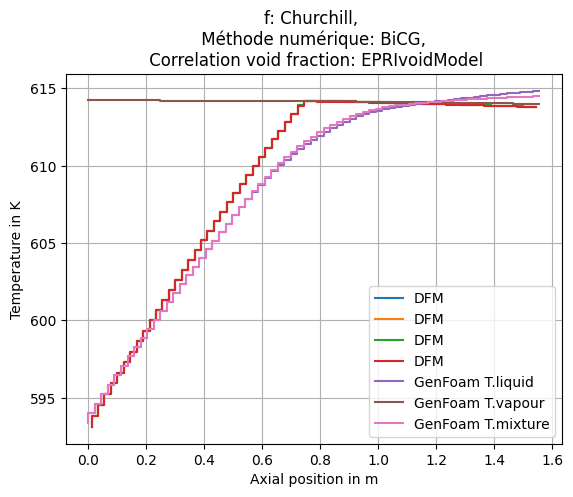

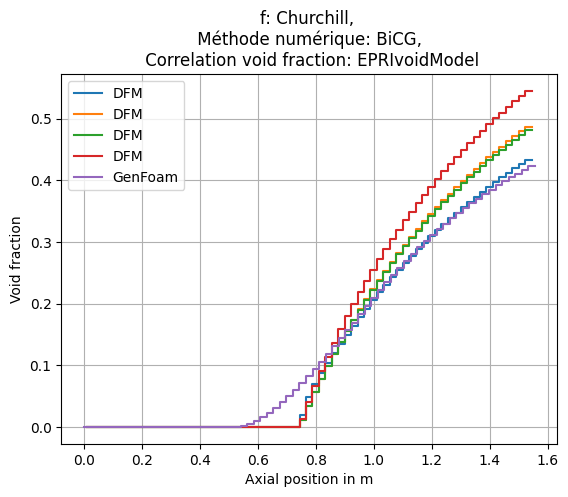

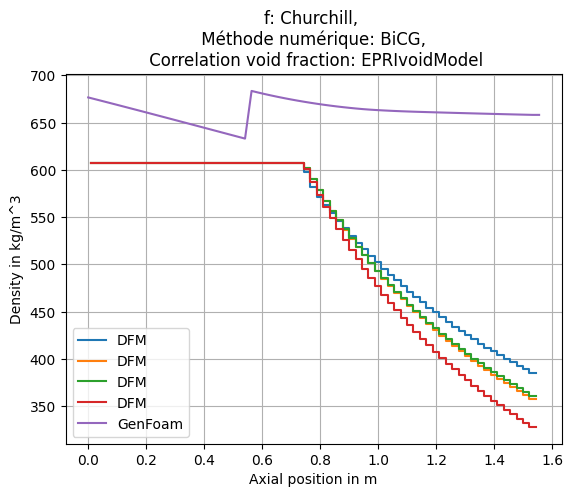

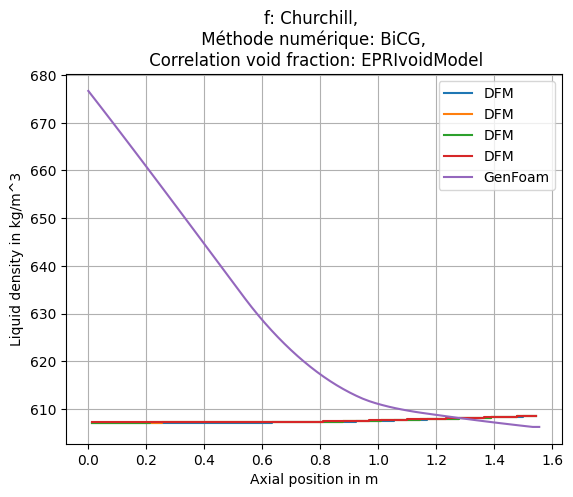

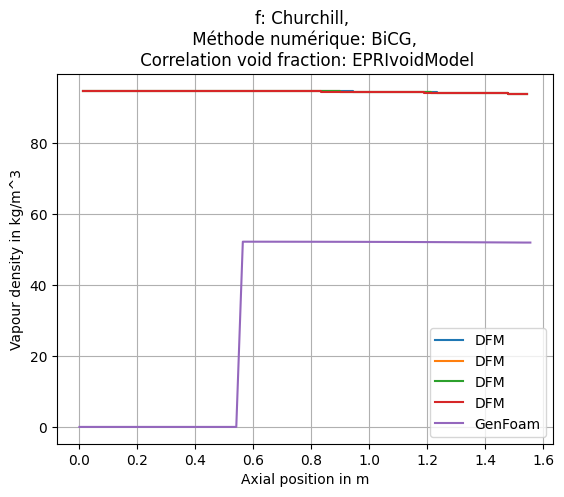

...

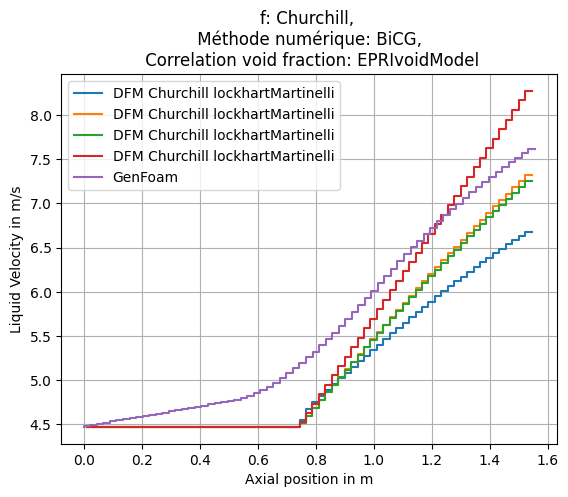

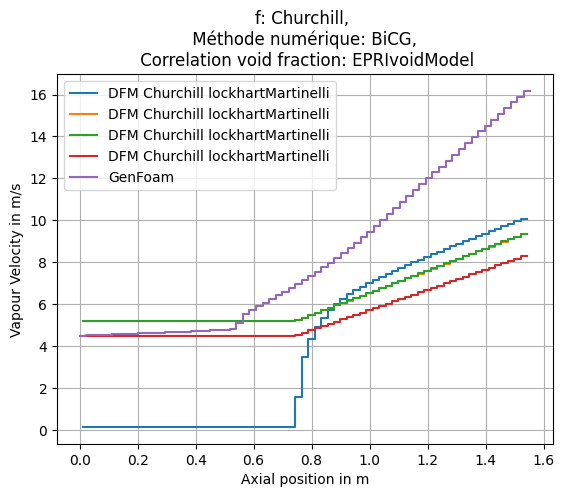

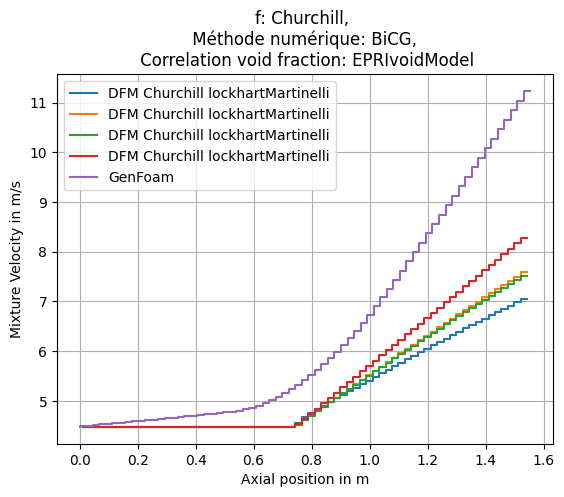

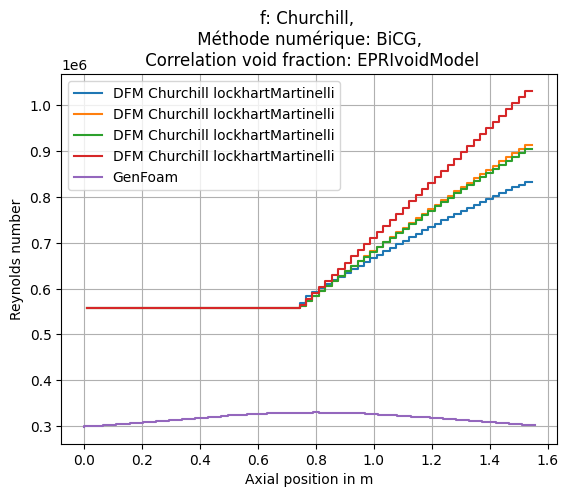

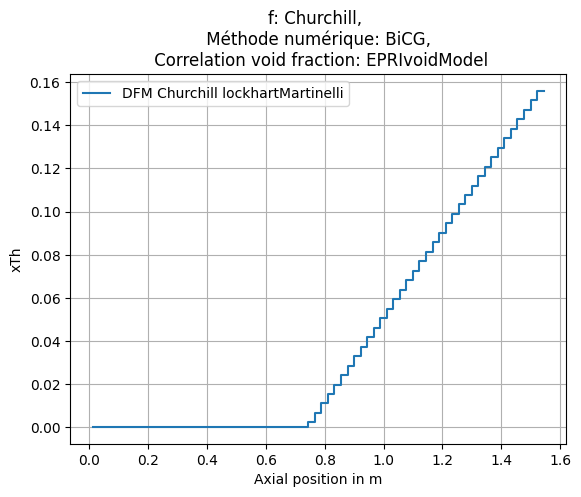

Mean absolute error in void fraction: 0.7379214772274679, max absolute error in temperature 5.973373555183953 for EPRIvoidModel
Mean absolute error in void fraction: 2.094418685244439, max absolute error in temperature 6.39101951777537 for GEramp
Mean absolute error in void fraction: 1.9616448582076487, max absolute error in temperature 5.973861840663389 for modBestion
Mean absolute error in void fraction: 3.8536866745870433, max absolute error in temperature 12.188153917454091 for HEM1
[0.7379214772274679, 2.094418685244439, 1.9616448582076487, 3.8536866745870433]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\3.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: a

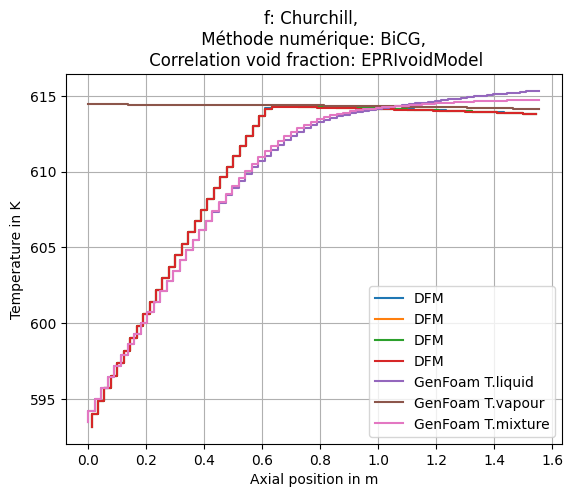

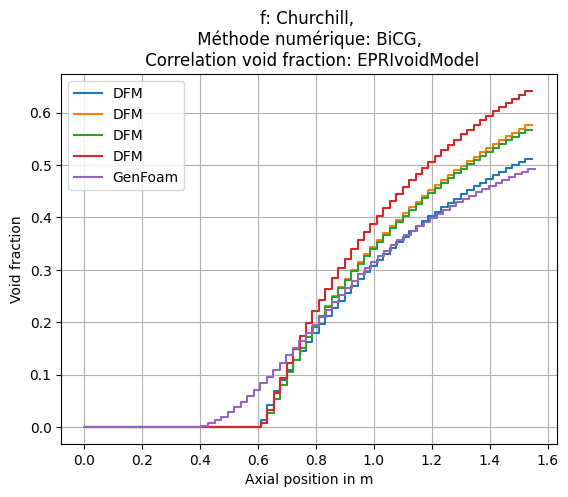

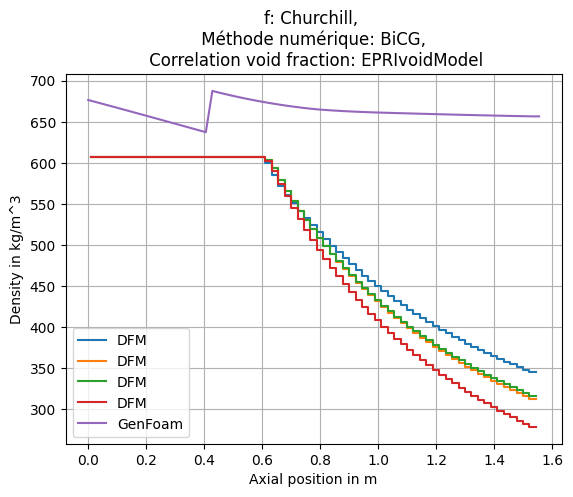

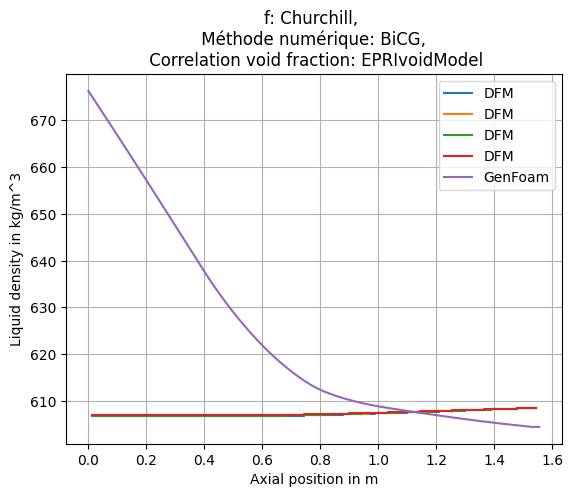

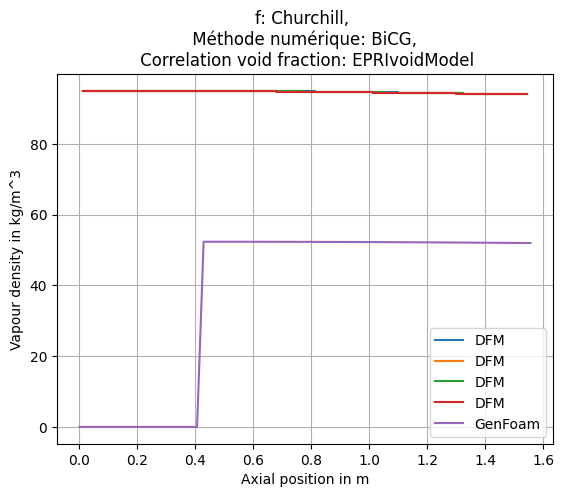

...

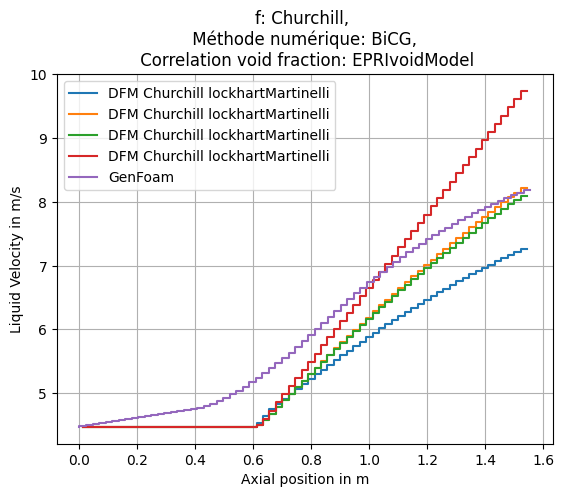

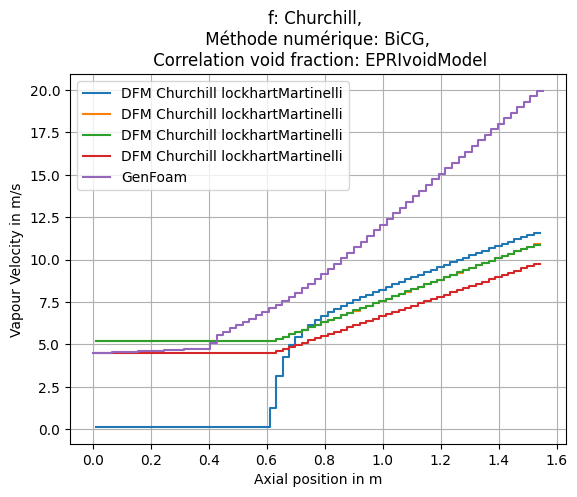

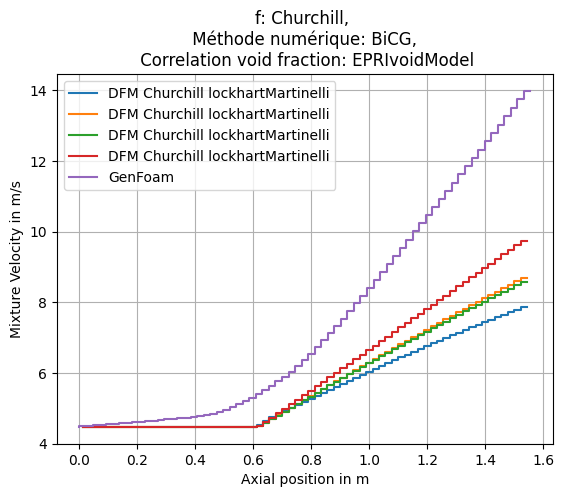

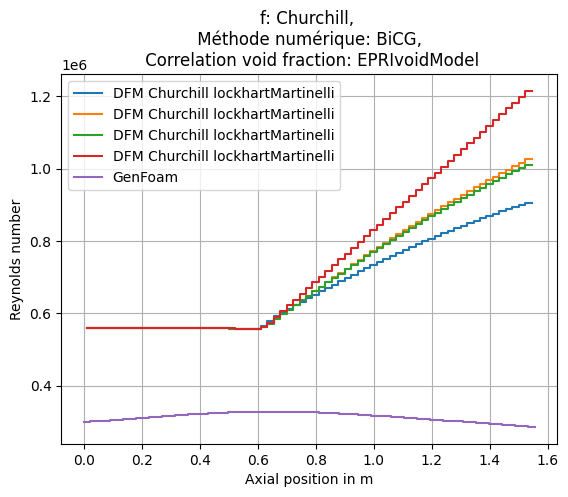

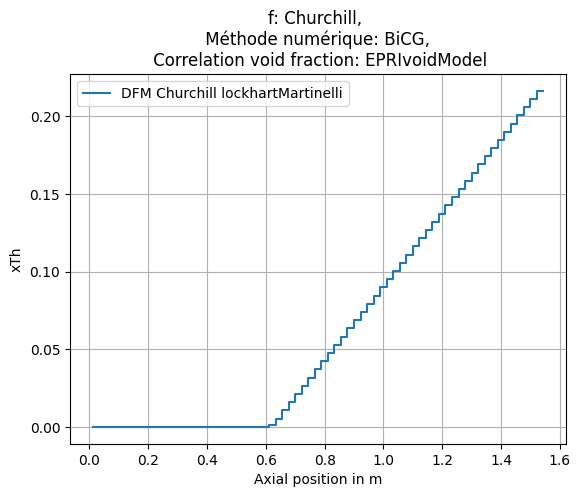

Mean absolute error in void fraction: 1.2628576453602574, max absolute error in temperature 7.08033395088556 for EPRIvoidModel
Mean absolute error in void fraction: 3.1108858758718942, max absolute error in temperature 8.270117110289576 for GEramp
Mean absolute error in void fraction: 2.88808122074156, max absolute error in temperature 7.653333763033615 for modBestion
Mean absolute error in void fraction: 5.511639529405482, max absolute error in temperature 14.83649024541468 for HEM1
[1.2628576453602574, 3.1108858758718942, 2.88808122074156, 5.511639529405482]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\3.5GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: alphaR

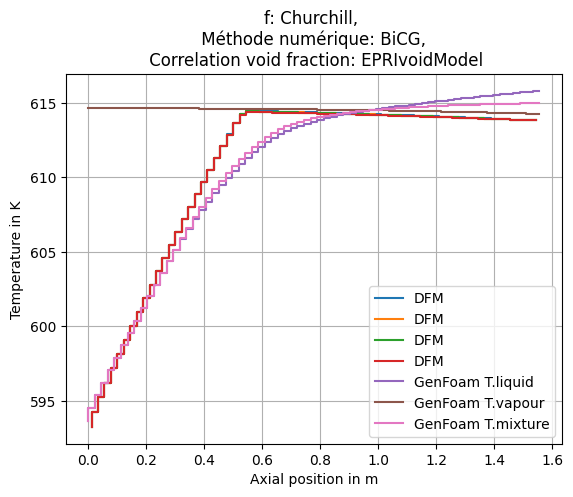

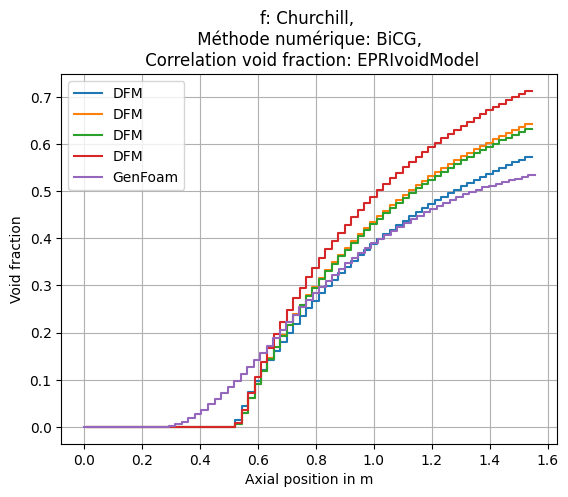

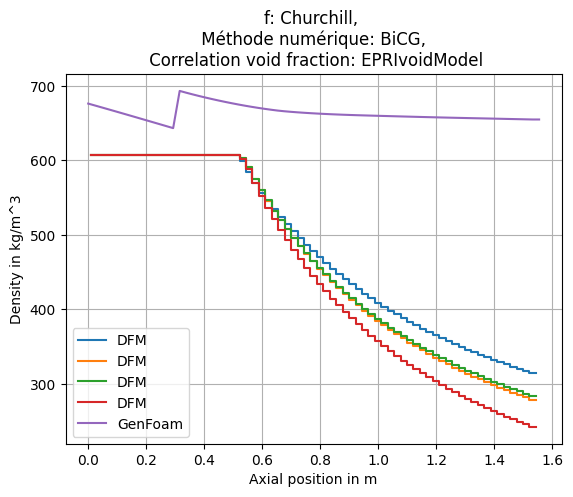

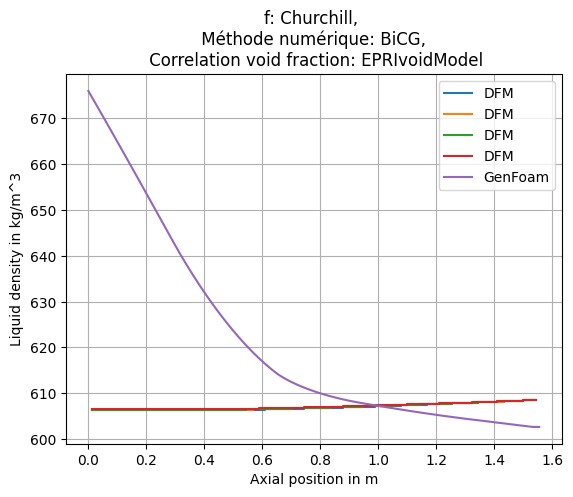

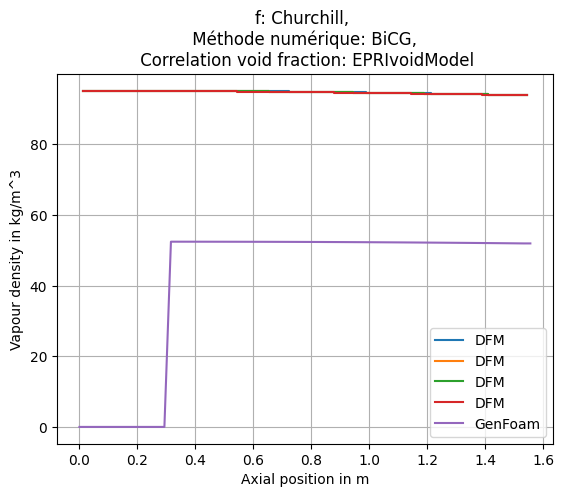

...

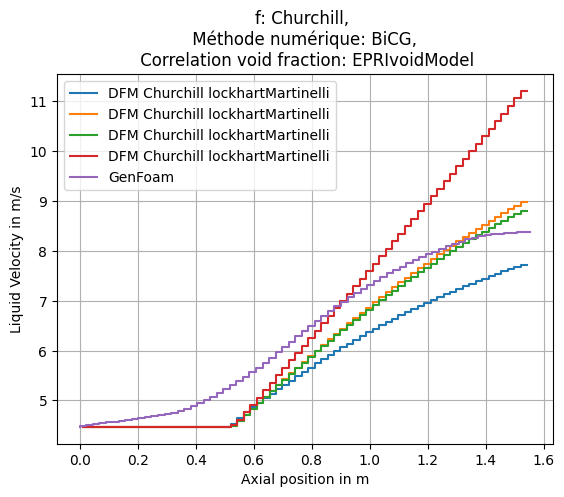

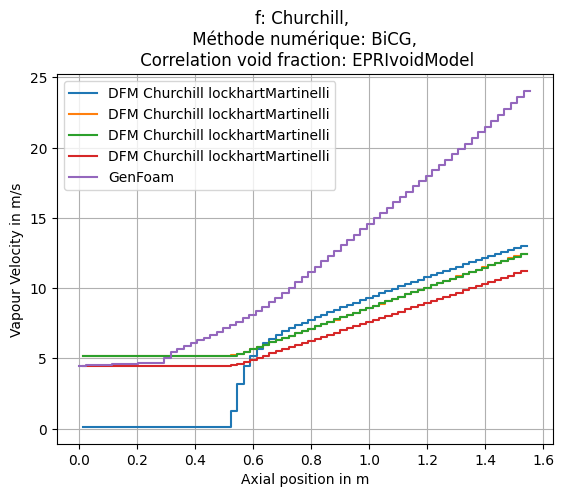

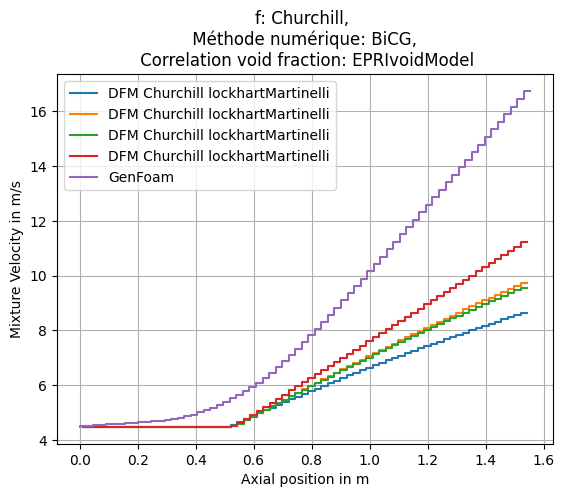

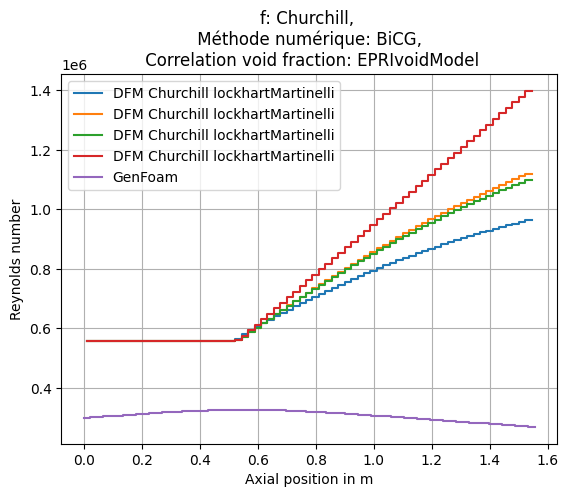

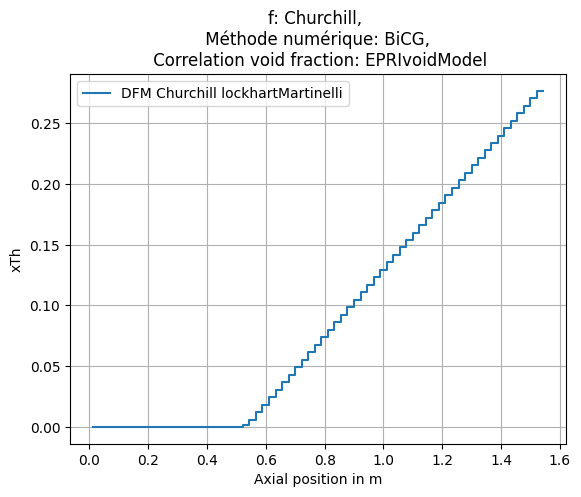

Mean absolute error in void fraction: 1.8690976609837893, max absolute error in temperature 8.475648785768792 for EPRIvoidModel
Mean absolute error in void fraction: 4.197062924270086, max absolute error in temperature 10.73838138201344 for GEramp
Mean absolute error in void fraction: 3.8875462322354215, max absolute error in temperature 9.75748174523796 for modBestion
Mean absolute error in void fraction: 7.1391625493048485, max absolute error in temperature 17.84832347748373 for HEM1
[1.8690976609837893, 4.197062924270086, 3.8875462322354215, 7.1391625493048485]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\4.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: al

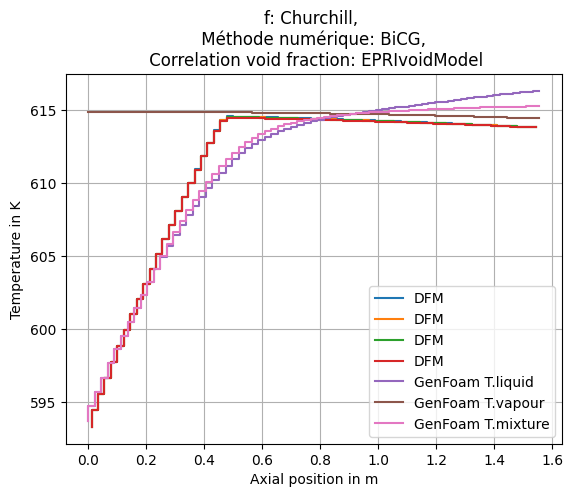

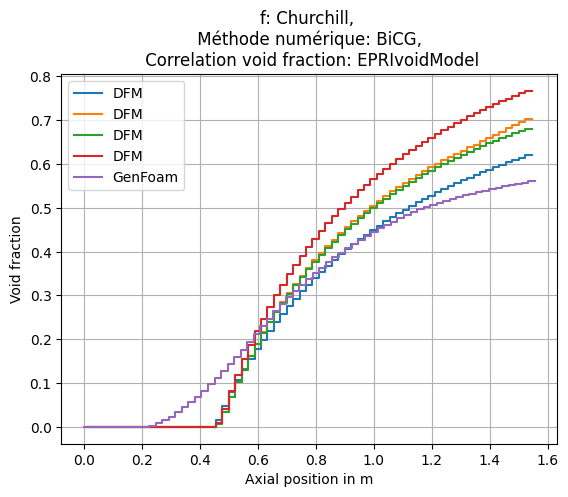

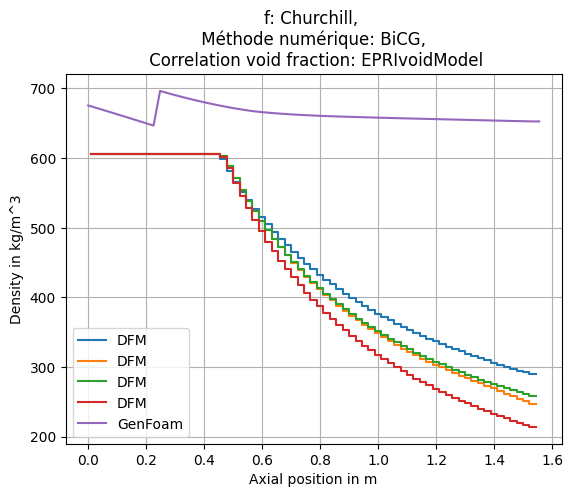

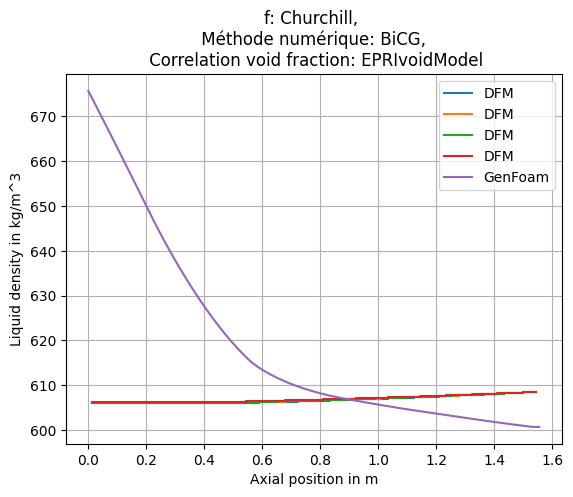

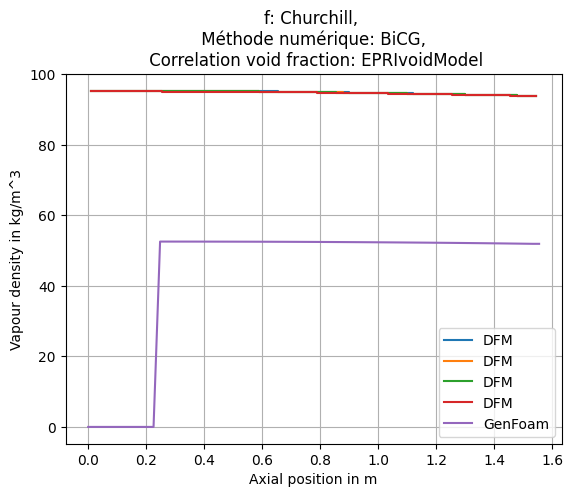

...

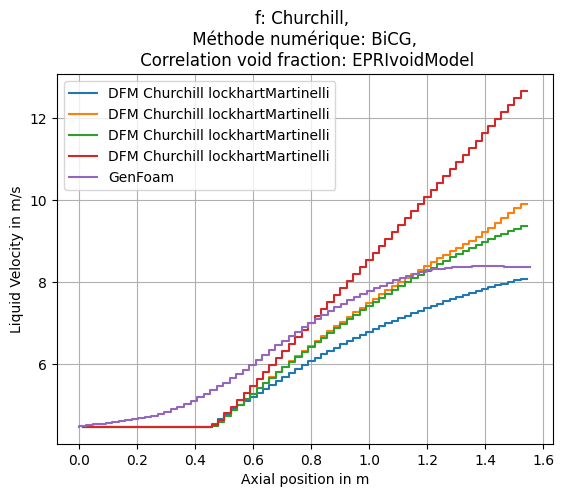

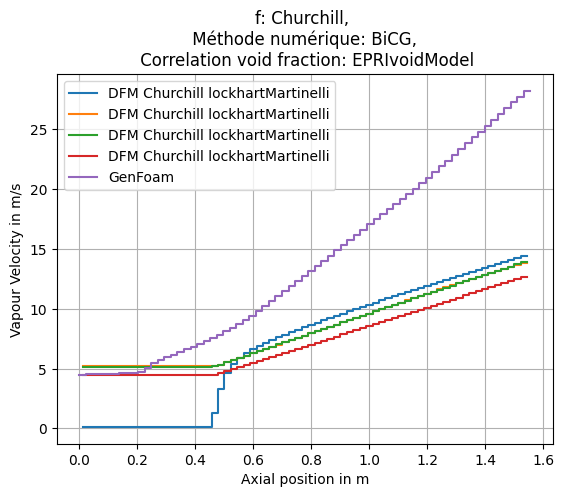

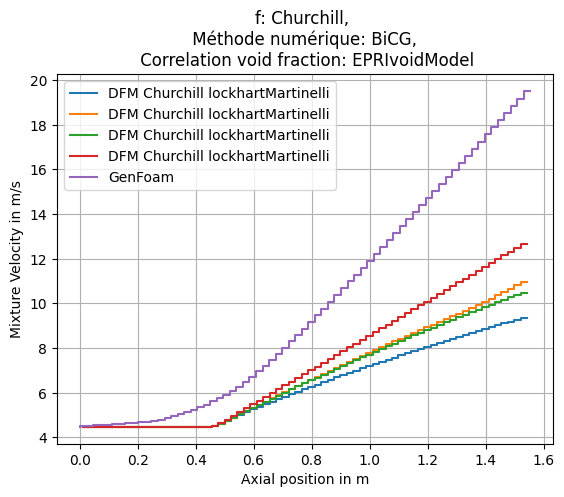

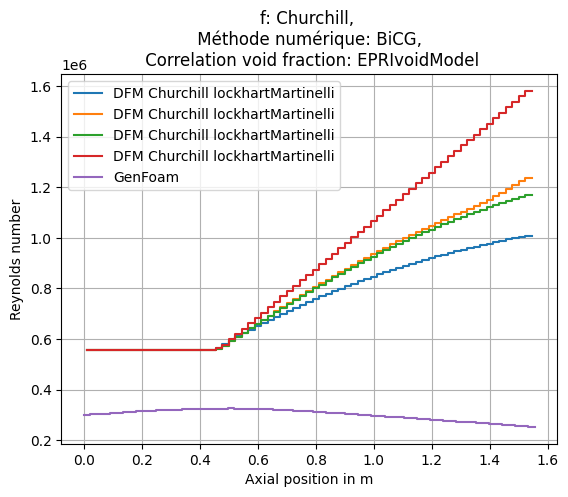

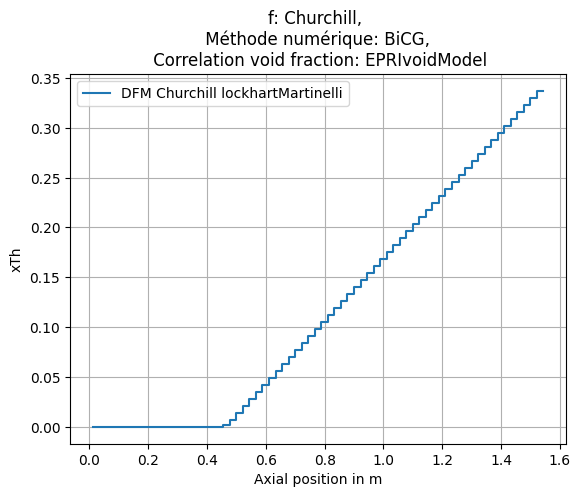

Mean absolute error in void fraction: 2.580574435487993, max absolute error in temperature 9.708072203184964 for EPRIvoidModel
Mean absolute error in void fraction: 5.414335825110771, max absolute error in temperature 14.026903835680782 for GEramp
Mean absolute error in void fraction: 4.960961924389755, max absolute error in temperature 11.866801007811478 for modBestion
Mean absolute error in void fraction: 8.756404415224184, max absolute error in temperature 20.496871947099137 for HEM1
[2.580574435487993, 5.414335825110771, 4.960961924389755, 8.756404415224184]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\4.5GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file: alph

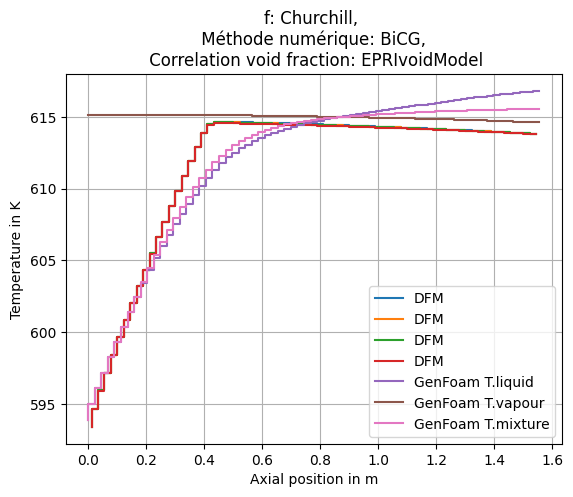

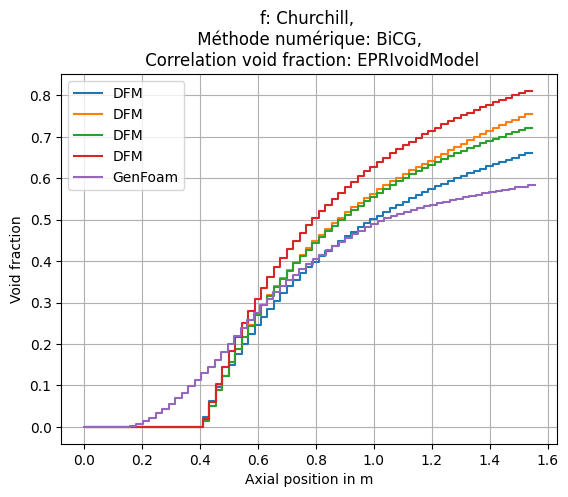

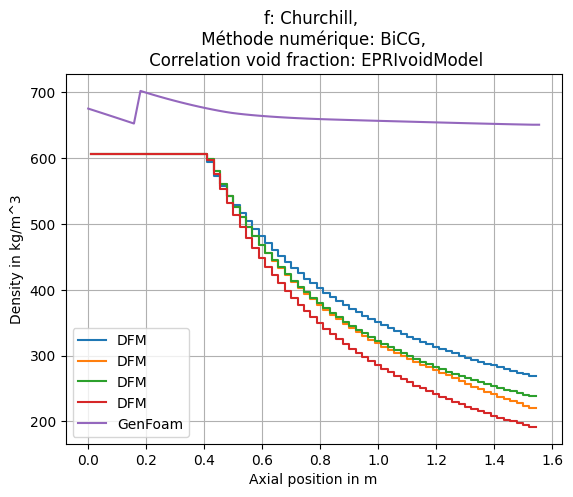

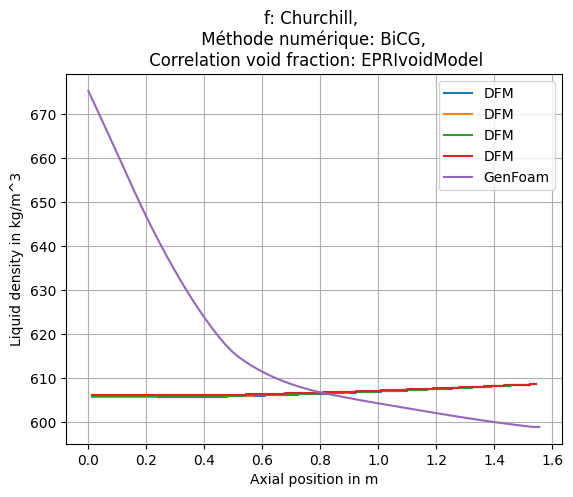

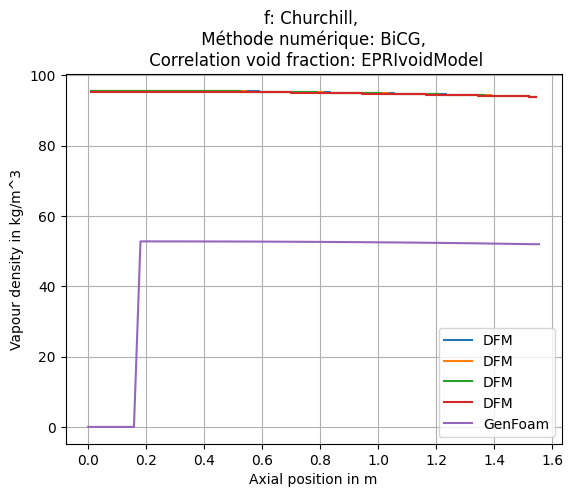

...

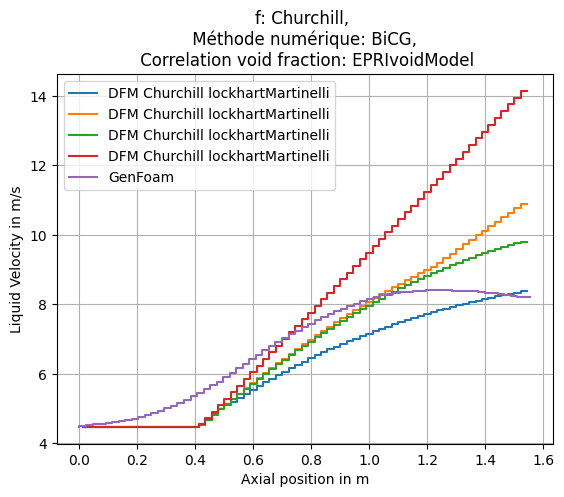

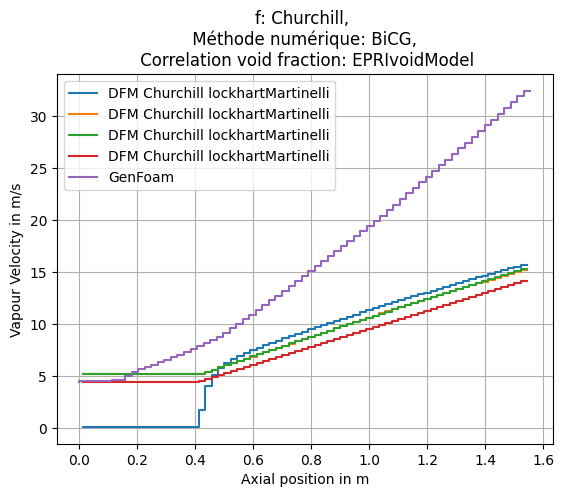

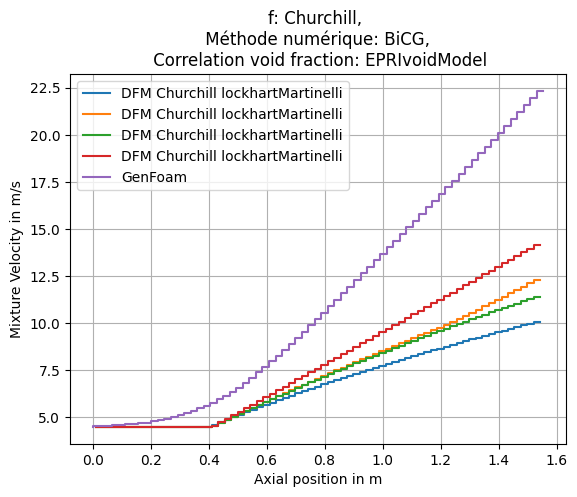

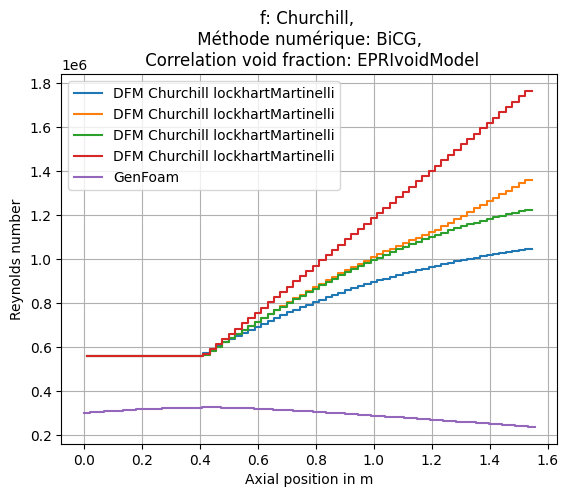

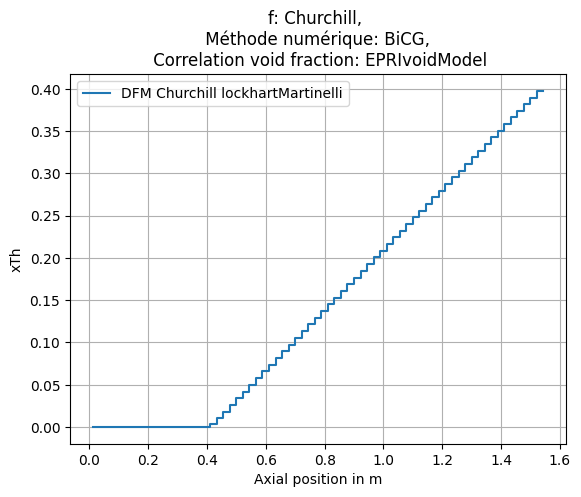

Mean absolute error in void fraction: 3.3618641864224106, max absolute error in temperature 11.303874604520853 for EPRIvoidModel
Mean absolute error in void fraction: 6.744271239670099, max absolute error in temperature 17.006715962731466 for GEramp
Mean absolute error in void fraction: 6.033759123201828, max absolute error in temperature 13.597590313812658 for modBestion
Mean absolute error in void fraction: 10.304689271653976, max absolute error in temperature 22.652721934039533 for HEM1
[3.3618641864224106, 6.744271239670099, 6.033759123201828, 10.304689271653976]
Reading files in directory: C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\5.0GW
Reading file: alpha.liquid
Reading file: alpha.passiveStructure
Reading file: alpha.powerModel
Reading file: alpha.structure
Reading file: alpha.vapour
Reading file: alphaPhi.liquid
Reading file: alphaPhi.vapour
Reading file: alphaRhoMagU.liquid
Reading file: alphaRhoMagU.vapour
Reading file:

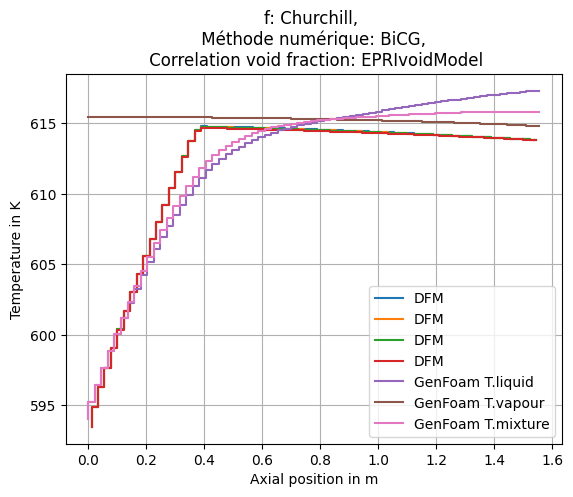

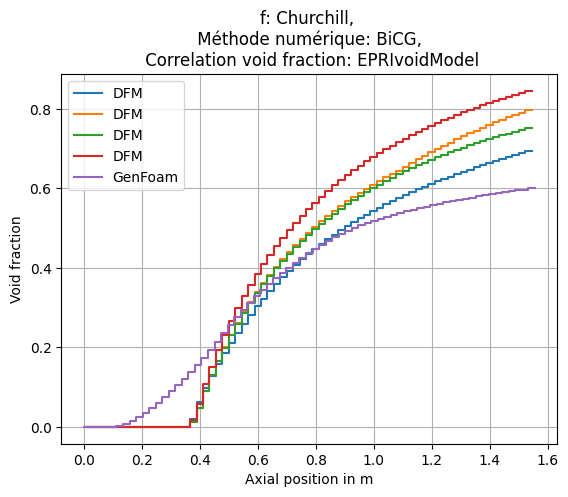

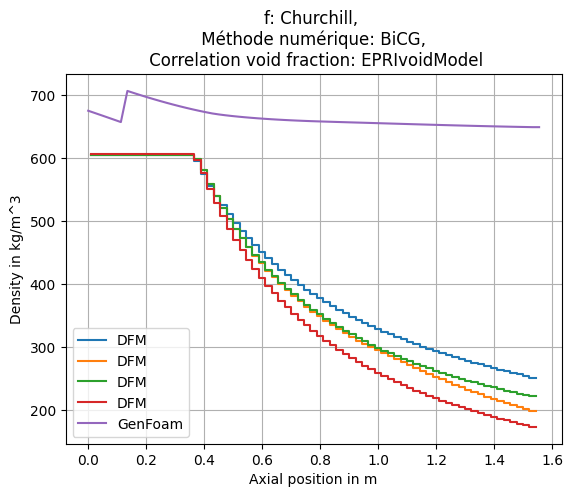

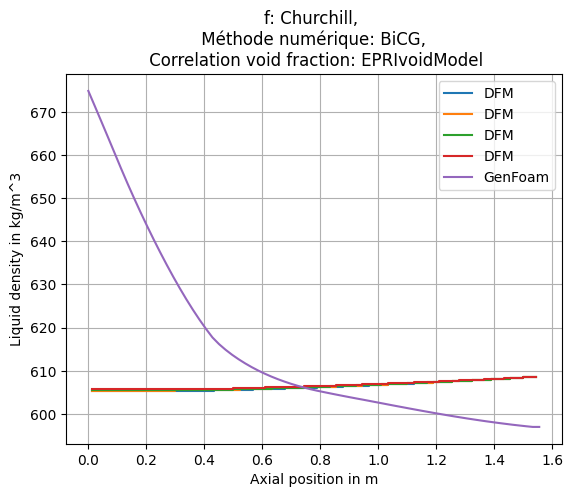

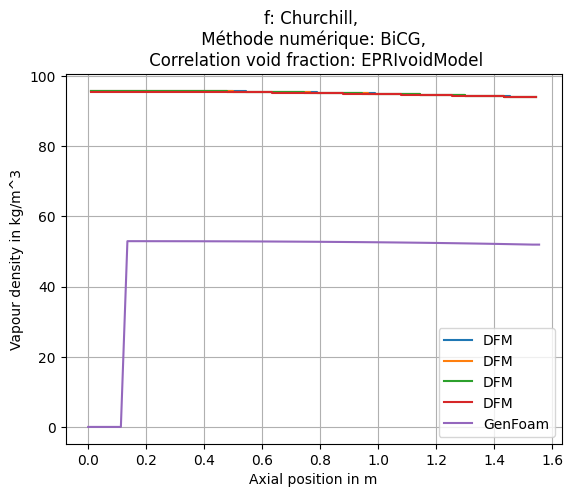

...

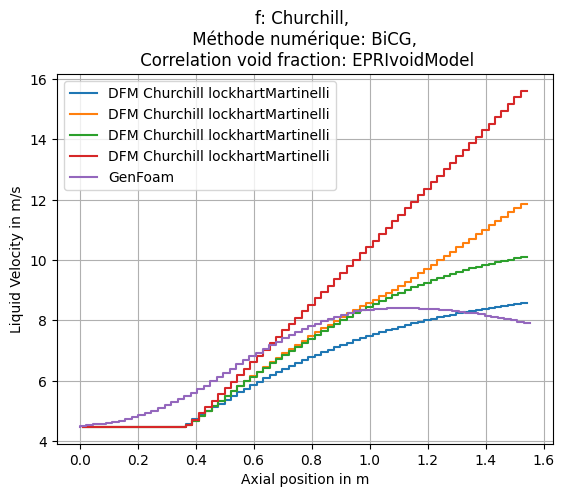

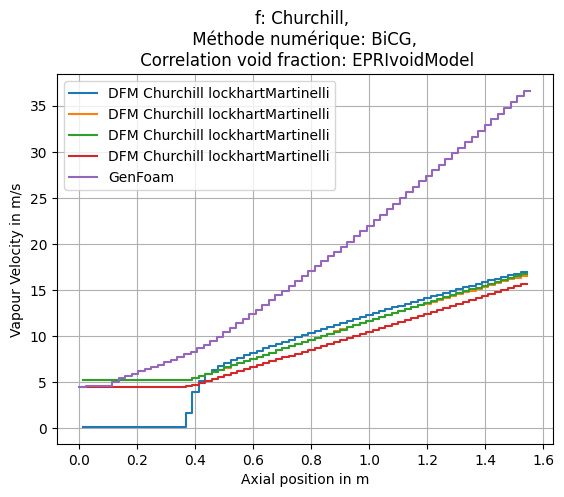

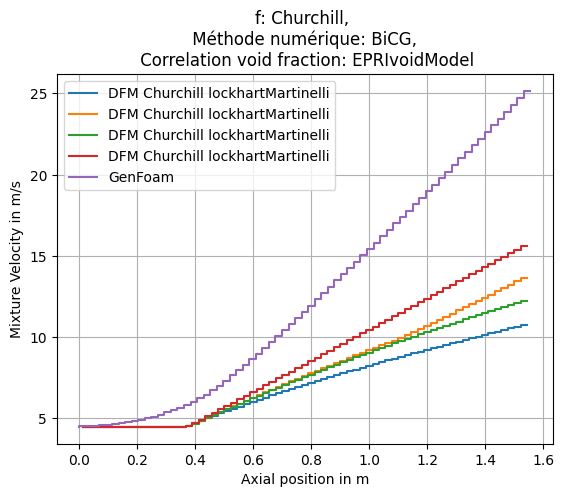

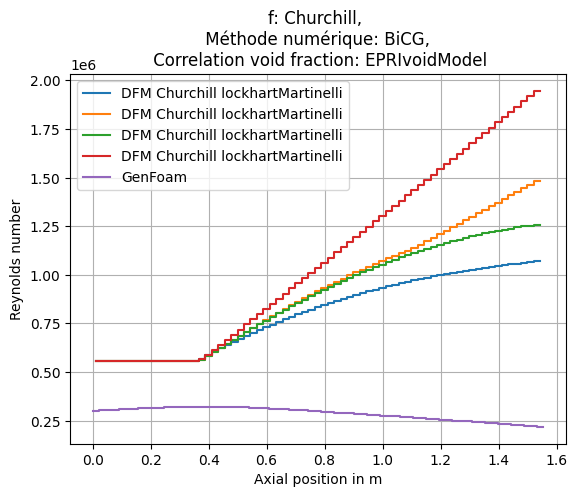

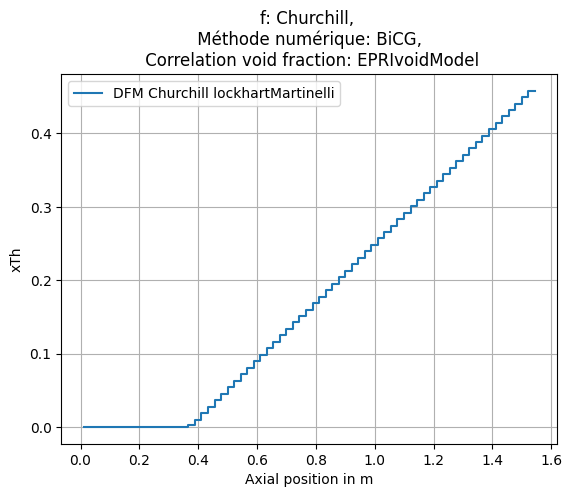

Mean absolute error in void fraction: 4.147082064673125, max absolute error in temperature 12.0869798837638 for EPRIvoidModel
Mean absolute error in void fraction: 8.092844626137222, max absolute error in temperature 19.571005948896282 for GEramp
Mean absolute error in void fraction: 7.061007129970764, max absolute error in temperature 15.030375624080595 for modBestion
Mean absolute error in void fraction: 11.75767428680295, max absolute error in temperature 24.43216845415722 for HEM1
[4.147082064673125, 8.092844626137222, 7.061007129970764, 11.75767428680295]


" #plotter.plotCase()\nprint(f'Umixture GeN-Foam: {plotter.U_mixture}')\nprint(f'zlist Plotter: {plotter.zList}')\nprint(f'len zListplotter: {len(plotter.zList)}')\nprint(f'zList convection: {case0.convection_sol.z_mesh}')\nprint(f'len z list convection {len(case0.convection_sol.z_mesh)}')\n#print(f'rhoua: {plotter.rhoUA}')  \nprint(f'rhoL GeN-Foam: {case0.convection_sol.rhoL[-1]}')\nprint(f'rhoG GeN-Foam: {case0.convection_sol.rhoG[-1]}')\nprint(f'rho GeN-Foam: {case0.convection_sol.rho[-1]}') "

In [5]:
errors_p=[]
for i in range(len(caseMerge)):
    plotter = GFPlotter(caseMerge[i], rf'C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\{1+i/2}GW', f"Qvariation_{qFiss[i]}GW")
    plotter.plotComparison()
    plotter.computeErrors()
    errors_p.append(plotter.plotErrorsPressure())

errors_T=[]
for i in range(len(caseMerge)):
    plotter = GFPlotter(caseMerge[i], rf'C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\{1+i/2}GW', f"Qvariation_{qFiss[i]}GW")
    plotter.plotComparison()
    plotter.computeErrors()
    errors_T.append(plotter.plotErrorsTemperature())

errors_eps=[]
for i in range(len(caseMerge)):
    plotter = GFPlotter(caseMerge[i], rf'C:\Users\cleme\OneDrive\Documents\Poly\BWR\driftFluxModel\thermalHydraulicsPoro\Phase_I_Qvariation\{1+i/2}GW', f"Qvariation_{qFiss[i]}GW")
    plotter.plotComparison()
    plotter.computeErrors()
    errors_eps.append(plotter.plotErrorsVoidFraction())


""" #plotter.plotCase()
print(f'Umixture GeN-Foam: {plotter.U_mixture}')
print(f'zlist Plotter: {plotter.zList}')
print(f'len zListplotter: {len(plotter.zList)}')
print(f'zList convection: {case0.convection_sol.z_mesh}')
print(f'len z list convection {len(case0.convection_sol.z_mesh)}')
#print(f'rhoua: {plotter.rhoUA}')  
print(f'rhoL GeN-Foam: {case0.convection_sol.rhoL[-1]}')
print(f'rhoG GeN-Foam: {case0.convection_sol.rhoG[-1]}')
print(f'rho GeN-Foam: {case0.convection_sol.rho[-1]}') """

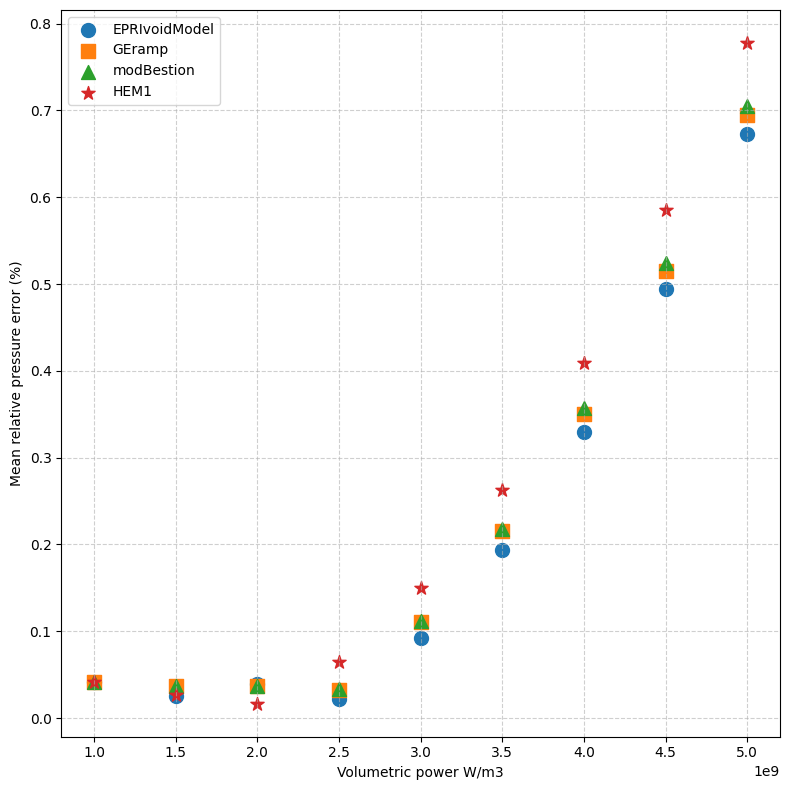

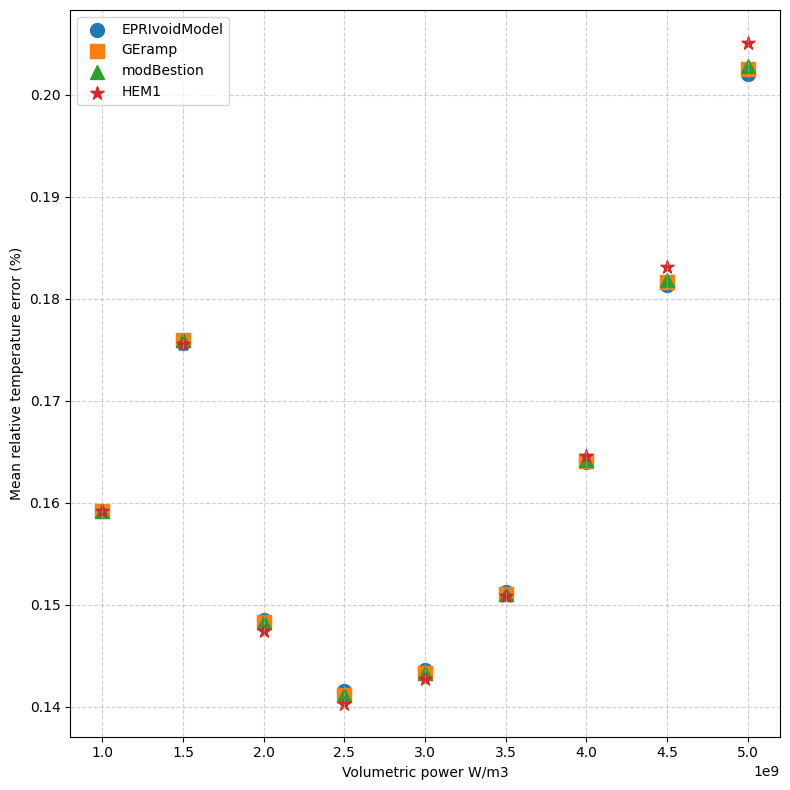

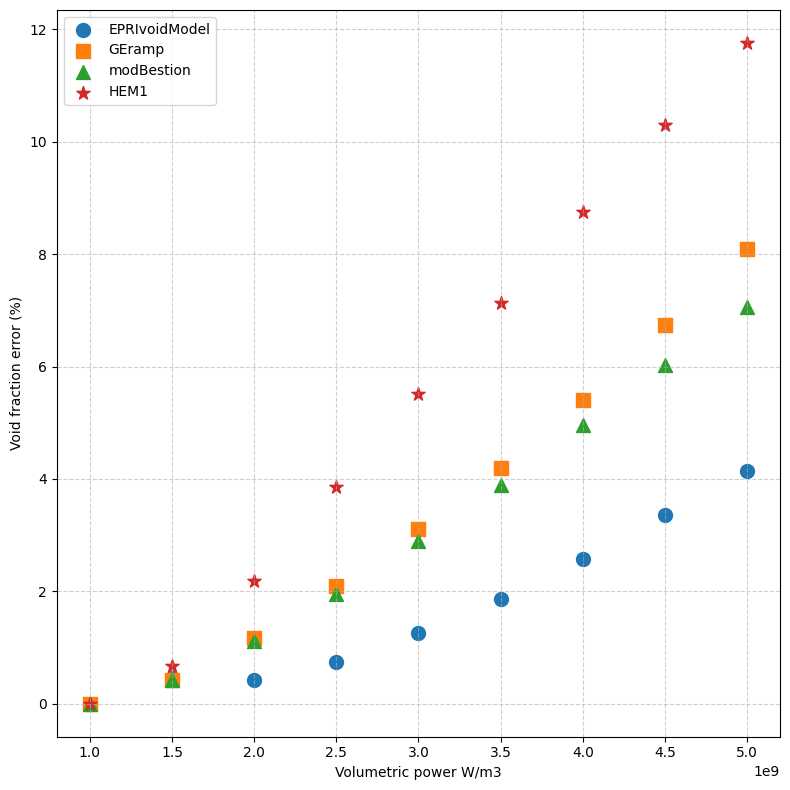

RMS error void fraction: [0.001572890925790974, 0.5072455636876688, 1.3716641589809233, 2.4305384830977714, 3.5352370431432614, 4.668766455653526, 5.857904026662919, 7.060102610875297, 8.227896908049724]
Max error void fraction: [0.001572890925790974, 0.6715993327798362, 2.177536778796578, 3.8536866745870433, 5.511639529405482, 7.1391625493048485, 8.756404415224184, 10.304689271653976, 11.75767428680295]


In [6]:
# Symboles pour chaque cas
markers = ['o', 's', '^', '*', '.', '<']  # Cercle, carré, triangle, étoile

cases = {
}

for i in range(len(caseMerge[0])):
    cases[f'{caseMerge[0][i].convection_sol.voidFractionCorrel}'] = [errors_p[j][i] for j in range(len(errors_p))]

# Création du graphique
plt.figure(figsize=(8, 8))

for (case_name, errors), marker in zip(cases.items(), markers):
    plt.scatter(qFiss, errors, label=case_name, marker=marker, s=100)

# Ajout des légendes et étiquettes
#plt.title("Erreur moyenne par puissance pour chaque combinaison \n de facteur de friction de multiplicateur biphasique")
plt.xlabel("Volumetric power W/m3")
plt.ylabel("Mean relative pressure error (%)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()

# Affichage du graphique
plt.show()

cases = {
}

for i in range(len(caseMerge[0])):
    cases[f'{caseMerge[0][i].convection_sol.voidFractionCorrel}'] = [errors_T[j][i] for j in range(len(errors_T))]

# Création du graphique
plt.figure(figsize=(8, 8))

for (case_name, errors), marker in zip(cases.items(), markers):
    plt.scatter(qFiss, errors, label=case_name, marker=marker, s=100)

# Ajout des légendes et étiquettes
#plt.title("Erreur moyenne sur la temparature par puissance pour chaque combinaison \n de facteur de friction de multiplicateur biphasique")
plt.xlabel("Volumetric power W/m3")
plt.ylabel("Mean relative temperature error (%)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()

cases = {
}

for i in range(len(caseMerge[0])):
    cases[f'{caseMerge[0][i].convection_sol.voidFractionCorrel}'] = [errors_eps[j][i] for j in range(len(errors_eps))]

# Création du graphique
plt.figure(figsize=(8, 8))

for (case_name, errors), marker in zip(cases.items(), markers):
    plt.scatter(qFiss, errors, label=case_name, marker=marker, s=100)

# Ajout des légendes et étiquettes
#plt.title("Erreur moyenne sur la fraction de vide par puissance pour chaque combinaison \n de facteur de friction de multiplicateur biphasique")
plt.xlabel("Volumetric power W/m3")
plt.ylabel("Void fraction error (%)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()


#RMS ERROR:
rms_eps = []
max_error = []
for i in range(len(errors_p)):
    rms_eps.append(np.sqrt(np.mean(np.array(errors_eps[i])**2)))
    max_error.append(np.max(errors_eps[i]))
#print
print(f'RMS error void fraction: {rms_eps}')
print(f'Max error void fraction: {max_error}')


In [7]:
print(f'volume_fracion_fuel: {(fuelRadius ** 2) / ( cladRadius ** 2)}')
print(f'volume_fracion_clad: {(np.pi *cladRadius ** 2) / waterRadius ** 2}')
q = [flowArea * Qfiss1[i] / (np.pi * fuelRadius ** 2) for i in range(len(Qfiss1))]
print(Qfiss1)
for i in range(len(Qfiss1)):
    print(q[i])

volume_fracion_fuel: 0.32590017062773124
volume_fracion_clad: 0.3982265958849156
[5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000, 5000000000]
23183988085.605114
23183988085.605114
23183988085.605114
23183988085.605114
23